In [ ]:
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
import cv2
import sys
import numpy as np
import torch.nn.init
import random
from google.colab.patches import cv2_imshow
import os
from os import path
from sklearn.preprocessing import normalize
from torch.nn.utils import clip_grad_norm_
import torch.nn.parallel.data_parallel as data_parallel
from torch.optim.lr_scheduler import StepLR
import pandas as pd
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
plt.style.use('dark_background')

In [ ]:
# define hyper params
class hyperParam:
  stride_conv = 1
  stride_conv_final = 1
  stride_conv_hidden = 1
  conv1_infeat = 100
  conv1_outfeat = 100
  conv_hidden_infeat = 100
  conv_hidden_outfeat = 100
  conv_final_infeat = 100
  conv_final_outfeat = 100
  input_size = 100
  n_hidden = 1
  kernel1_size = 3
  kernel2_size = 3
  lr = 0.05
  num_epochs = 50
  batch_size = 50
  momemtum = 0.9
  decay_factor = 0.9
  n_epochs = 1000
  cle_weight = 1
  discontinuity_weight = 0.5
  min_labels = 3

In [ ]:
class CNN(nn.Module):
  def __init__(self,input_dim):
    super(CNN, self).__init__()

    # network architecture
    # conv -> maxpool -> relu ->conv -> maxpool -> relu ->fc -> relu -> fc -> softmax
    
    self.infeat = input_dim
    self.stride_conv1 = hyperParam.stride_conv
    self.stride_conv_hidden = hyperParam.stride_conv_hidden
    self.stride_conv_final = hyperParam.stride_conv_final

    # non zero padding, unit stride 
    # used this calculations to make output features dynamic. 
    # for now, just replicated the original parameters of the model with adaptive learning rate schedule
    # self.opfeats_conv1 = np.floor((self.infeat - hyperParam.kernel1_size)/self.stride_conv1) +1


    # self.opfeats_conv2 = np.floor((self.opfeats_maxpool1 - hyperParam.kernel2_size)/self.stride_conv2) +1

    
    self.conv1 = nn.Conv2d(in_channels=input_dim, out_channels=hyperParam.conv1_outfeat, kernel_size=hyperParam.kernel1_size, stride = (self.stride_conv1,self.stride_conv1), padding=1)
    
    self.convhidden_list = nn.ModuleList()
    self.bnhidden_list = nn.ModuleList()
    

     # batch normalisation
    self.batchnorm1 = nn.BatchNorm2d(hyperParam.conv_final_outfeat)
    self.batchnormhidden = nn.BatchNorm2d(hyperParam.conv_hidden_outfeat)
    self.batchnormfinal = nn.BatchNorm2d(hyperParam.conv_final_outfeat)


    for _ in range(hyperParam.n_hidden):
      self.convhidden_list.append(nn.Conv2d(hyperParam.conv_hidden_infeat, hyperParam.conv_hidden_outfeat, kernel_size=3, stride = (self.stride_conv_hidden,self.stride_conv_hidden), padding=1) )
      self.bnhidden_list.append(self.batchnormhidden)
    
    self.conv_final = nn.Conv2d(in_channels=hyperParam.conv_final_infeat, out_channels=hyperParam.conv_final_outfeat, kernel_size=hyperParam.kernel2_size, stride = (self.stride_conv_final,self.stride_conv_final))



    # layer initialisation
    # xavier layer initialisation (we will experiment with HE initialisation) 
    torch.nn.init.xavier_uniform_(self.conv1.weight) 
    self.conv1.bias.data.fill_(0.0)
    
    for i in range(hyperParam.n_hidden):
      torch.nn.init.xavier_uniform_(self.convhidden_list[i].weight) 
      self.convhidden_list[i].bias.data.fill_(0.0)

    torch.nn.init.xavier_uniform_(self.conv_final.weight) 
    self.conv_final.bias.data.fill_(0.0)

  def forward(self, x):
    x = self.conv1(x)

    x = F.relu(x)
    x = self.batchnorm1(x)

    for i in range(hyperParam.n_hidden):
      x = self.convhidden_list[i](x)

      x = F.relu(x)
      x = self.bnhidden_list[i](x)

    x = self.conv_final(x)
    x = self.batchnormfinal(x)

    return x

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
img = cv2.imread('/content/sea.jpeg')
imarr = np.array([img.transpose((2, 0, 1)).astype('float32')/255.])


In [ ]:
data = torch.from_numpy( np.array([img.transpose( (2, 0, 1) ).astype('float32')/255.]) )
data = Variable(data) # for gradient flow
data.to(device)


tensor([[[[0.1961, 0.1882, 0.1922,  ..., 0.3922, 0.3451, 0.3451],
          [0.1725, 0.1647, 0.1804,  ..., 0.3569, 0.3451, 0.3843],
          [0.1804, 0.1843, 0.1882,  ..., 0.3569, 0.3765, 0.3647],
          ...,
          [0.4039, 0.2706, 0.2314,  ..., 0.0000, 0.0078, 0.0314],
          [0.3922, 0.2824, 0.2824,  ..., 0.0039, 0.0039, 0.0196],
          [0.2000, 0.2471, 0.2510,  ..., 0.0118, 0.0118, 0.0196]],

         [[0.1294, 0.1216, 0.1137,  ..., 0.3412, 0.2941, 0.2902],
          [0.1059, 0.0980, 0.1020,  ..., 0.3059, 0.2941, 0.3294],
          [0.1020, 0.1059, 0.1059,  ..., 0.3098, 0.3255, 0.3137],
          ...,
          [0.5216, 0.3843, 0.3451,  ..., 0.0196, 0.0196, 0.0235],
          [0.5098, 0.3961, 0.3843,  ..., 0.0235, 0.0235, 0.0235],
          [0.3137, 0.3529, 0.3255,  ..., 0.0196, 0.0196, 0.0196]],

         [[0.0235, 0.0157, 0.0157,  ..., 0.0353, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0039,  ..., 0.0000, 0.0000, 0.0314],
          [0.0039, 0.0078, 0.0196,  ..., 0

In [ ]:
model = CNN(data.size(1))
model.to(device)
model.cuda()

CNN(
  (conv1): Conv2d(3, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (convhidden_list): ModuleList(
    (0): Conv2d(100, 100, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  )
  (bnhidden_list): ModuleList(
    (0): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (batchnorm1): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnormhidden): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (batchnormfinal): BatchNorm2d(100, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv_final): Conv2d(100, 100, kernel_size=(3, 3), stride=(1, 1))
)

In [ ]:
# define loss function, optimiser and lr scheduler
optimizer = torch.optim.SGD(model.parameters(), lr = hyperParam.lr, momentum=hyperParam.momemtum)
scheduler = StepLR(optimizer, 10, hyperParam.decay_factor)
loss_func = nn.CrossEntropyLoss()

# continuity loss function (adapted from the paper)
continitity_lossy = torch.nn.L1Loss(size_average = True)
continitity_lossz = torch.nn.L1Loss(size_average = True)

/usr/local/lib/python3.7/dist-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


In [ ]:
continitity_lossy_target = torch.zeros(img.shape[0]-1, img.shape[1], hyperParam.conv_final_outfeat)
continitity_lossz_target = torch.zeros(img.shape[0], img.shape[1]-1, hyperParam.conv_final_outfeat)

In [ ]:
# move targets of continutiy loss onto device
continitity_lossy_target.to(device)
continitity_lossz_target.to(device)

tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0., 

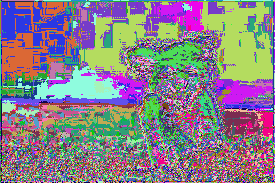

0 / 1000 |  label num : 100  | loss : 3.4991939067840576


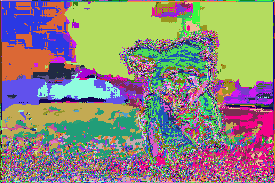

1 / 1000 |  label num : 98  | loss : 3.2407782077789307


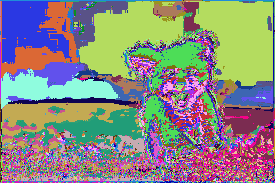

2 / 1000 |  label num : 95  | loss : 3.0269205570220947


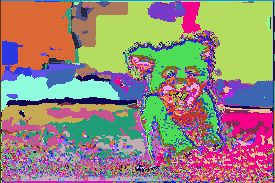

3 / 1000 |  label num : 94  | loss : 2.9299941062927246


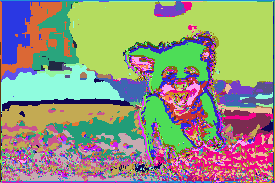

4 / 1000 |  label num : 81  | loss : 2.7566463947296143


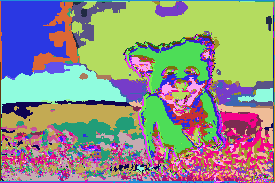

5 / 1000 |  label num : 77  | loss : 2.6091341972351074


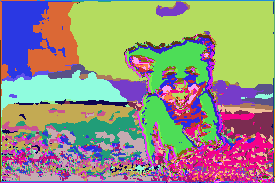

6 / 1000 |  label num : 67  | loss : 2.4416041374206543


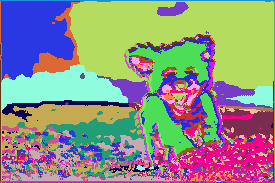

7 / 1000 |  label num : 60  | loss : 2.203890800476074


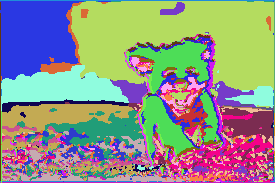

8 / 1000 |  label num : 52  | loss : 1.990220546722412


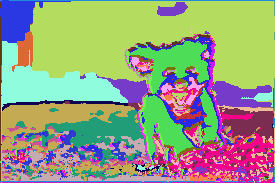

9 / 1000 |  label num : 45  | loss : 1.854921817779541


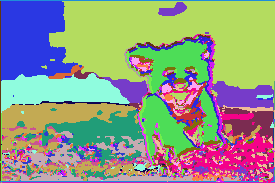

10 / 1000 |  label num : 47  | loss : 1.71848726272583


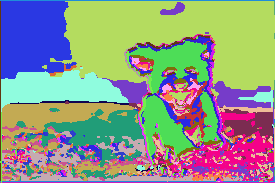

11 / 1000 |  label num : 37  | loss : 1.4724304676055908


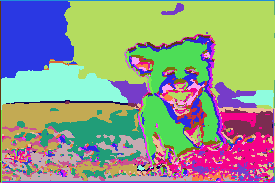

12 / 1000 |  label num : 35  | loss : 1.332647442817688


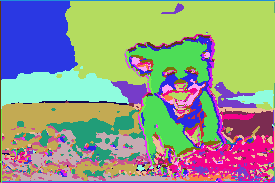

13 / 1000 |  label num : 31  | loss : 1.1756682395935059


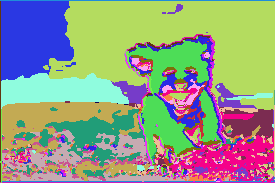

14 / 1000 |  label num : 31  | loss : 1.022155523300171


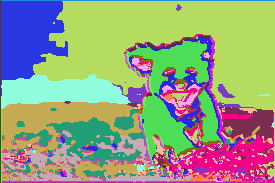

15 / 1000 |  label num : 28  | loss : 0.9098830223083496


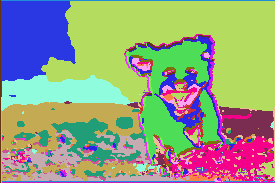

16 / 1000 |  label num : 28  | loss : 0.7961691617965698


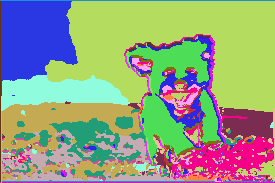

17 / 1000 |  label num : 28  | loss : 0.702623724937439


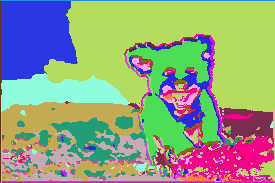

18 / 1000 |  label num : 27  | loss : 0.6270604729652405


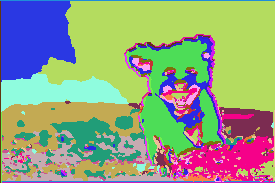

19 / 1000 |  label num : 25  | loss : 0.5571319460868835


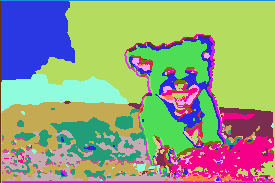

20 / 1000 |  label num : 25  | loss : 0.50636887550354


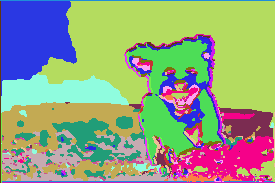

21 / 1000 |  label num : 25  | loss : 0.4567345976829529


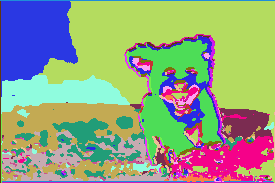

22 / 1000 |  label num : 25  | loss : 0.41545045375823975


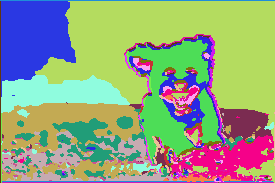

23 / 1000 |  label num : 25  | loss : 0.38091257214546204


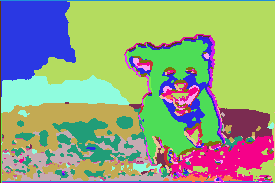

24 / 1000 |  label num : 25  | loss : 0.35343223810195923


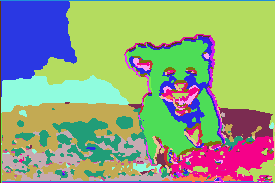

25 / 1000 |  label num : 24  | loss : 0.3293765187263489


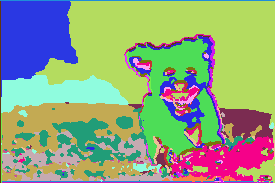

26 / 1000 |  label num : 24  | loss : 0.3085740804672241


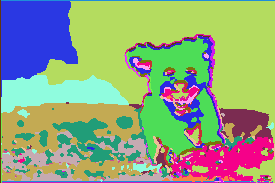

27 / 1000 |  label num : 24  | loss : 0.29224902391433716


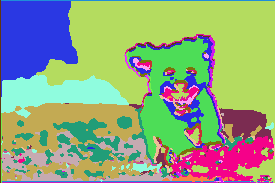

28 / 1000 |  label num : 24  | loss : 0.27641546726226807


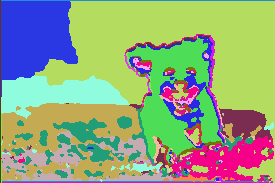

29 / 1000 |  label num : 24  | loss : 0.26138946413993835


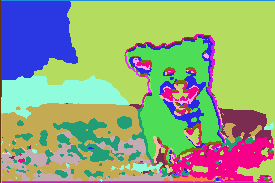

30 / 1000 |  label num : 24  | loss : 0.24844636023044586


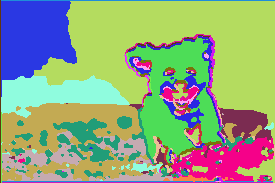

31 / 1000 |  label num : 24  | loss : 0.23886720836162567


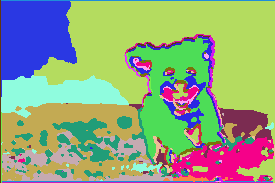

32 / 1000 |  label num : 24  | loss : 0.23032589256763458


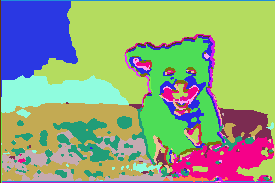

33 / 1000 |  label num : 24  | loss : 0.2224159836769104


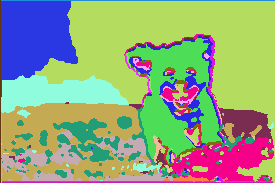

34 / 1000 |  label num : 23  | loss : 0.21525508165359497


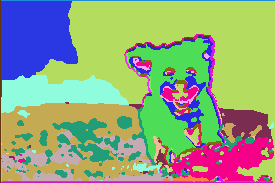

35 / 1000 |  label num : 23  | loss : 0.2091130018234253


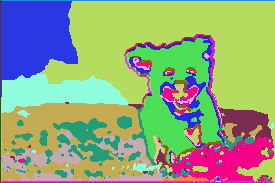

36 / 1000 |  label num : 23  | loss : 0.20402534306049347


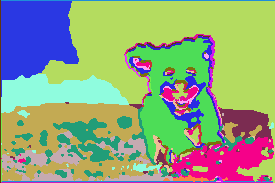

37 / 1000 |  label num : 23  | loss : 0.19891200959682465


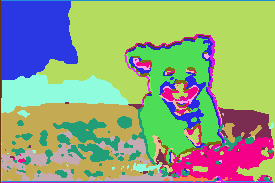

38 / 1000 |  label num : 23  | loss : 0.19431619346141815


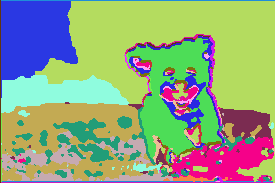

39 / 1000 |  label num : 23  | loss : 0.19073820114135742


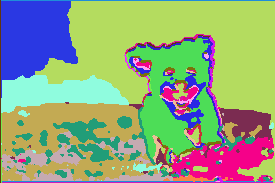

40 / 1000 |  label num : 23  | loss : 0.1875205785036087


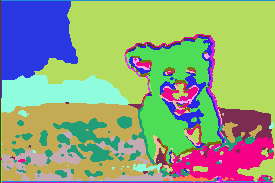

41 / 1000 |  label num : 23  | loss : 0.1843714714050293


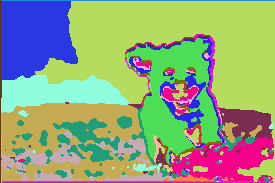

42 / 1000 |  label num : 23  | loss : 0.18111160397529602


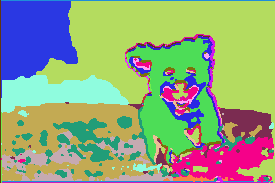

43 / 1000 |  label num : 23  | loss : 0.17826947569847107


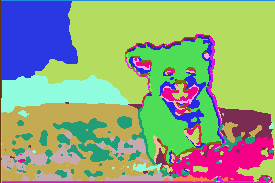

44 / 1000 |  label num : 23  | loss : 0.1756647229194641


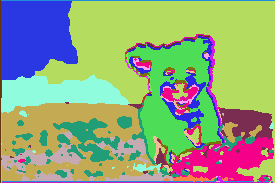

45 / 1000 |  label num : 23  | loss : 0.17316372692584991


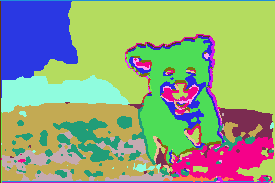

46 / 1000 |  label num : 23  | loss : 0.17098979651927948


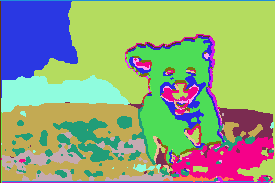

47 / 1000 |  label num : 23  | loss : 0.16883787512779236


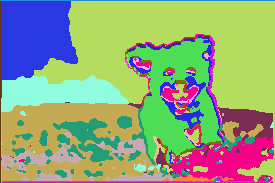

48 / 1000 |  label num : 23  | loss : 0.1667778044939041


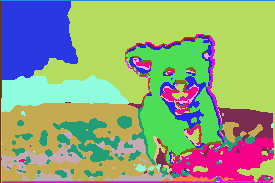

49 / 1000 |  label num : 23  | loss : 0.16502080857753754


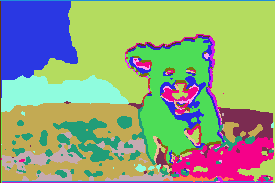

50 / 1000 |  label num : 23  | loss : 0.16285258531570435


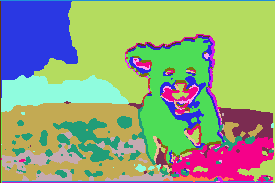

51 / 1000 |  label num : 23  | loss : 0.16105696558952332


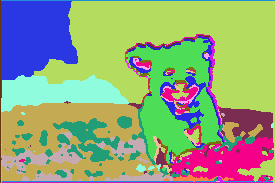

52 / 1000 |  label num : 23  | loss : 0.15938901901245117


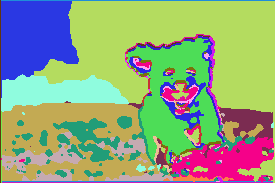

53 / 1000 |  label num : 23  | loss : 0.15806478261947632


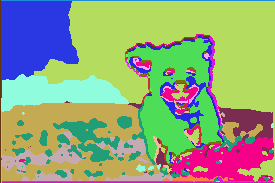

54 / 1000 |  label num : 23  | loss : 0.15670599043369293


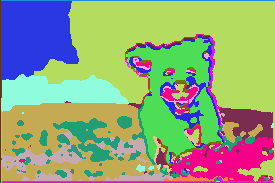

55 / 1000 |  label num : 23  | loss : 0.1550481766462326


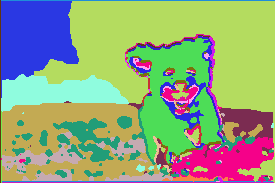

56 / 1000 |  label num : 23  | loss : 0.1537957787513733


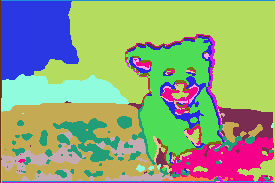

57 / 1000 |  label num : 23  | loss : 0.15248994529247284


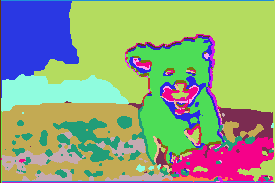

58 / 1000 |  label num : 23  | loss : 0.15131200850009918


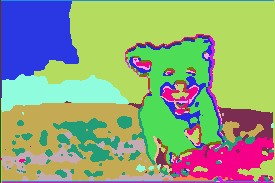

59 / 1000 |  label num : 23  | loss : 0.15055225789546967


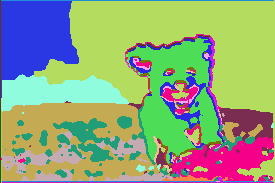

60 / 1000 |  label num : 23  | loss : 0.14970196783542633


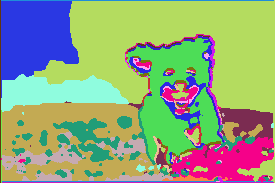

61 / 1000 |  label num : 23  | loss : 0.14816240966320038


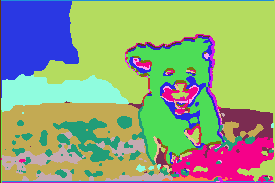

62 / 1000 |  label num : 23  | loss : 0.14735563099384308


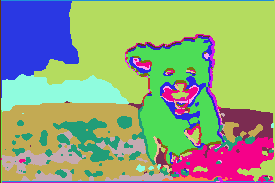

63 / 1000 |  label num : 23  | loss : 0.1464649885892868


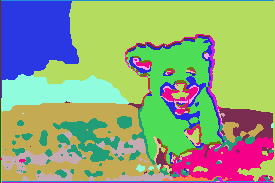

64 / 1000 |  label num : 23  | loss : 0.14524376392364502


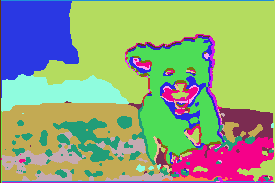

65 / 1000 |  label num : 23  | loss : 0.14429496228694916


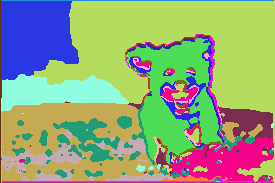

66 / 1000 |  label num : 23  | loss : 0.14347416162490845


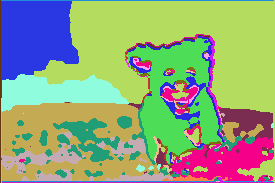

67 / 1000 |  label num : 23  | loss : 0.14257103204727173


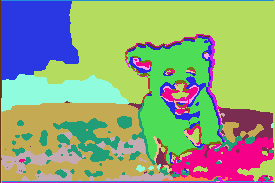

68 / 1000 |  label num : 23  | loss : 0.14174796640872955


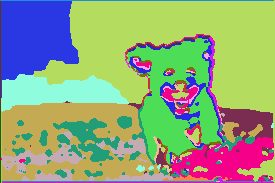

69 / 1000 |  label num : 23  | loss : 0.14095038175582886


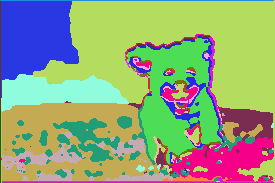

70 / 1000 |  label num : 23  | loss : 0.14049002528190613


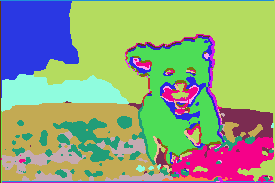

71 / 1000 |  label num : 23  | loss : 0.1397501528263092


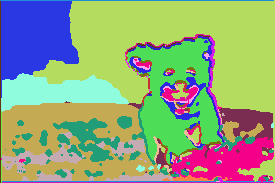

72 / 1000 |  label num : 23  | loss : 0.1391046643257141


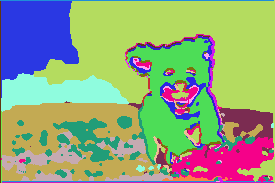

73 / 1000 |  label num : 23  | loss : 0.13868778944015503


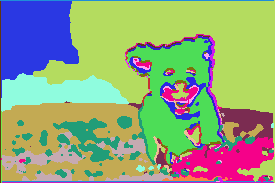

74 / 1000 |  label num : 23  | loss : 0.13727477192878723


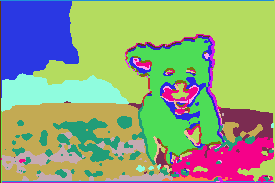

75 / 1000 |  label num : 23  | loss : 0.13738518953323364


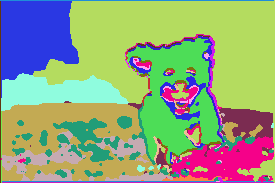

76 / 1000 |  label num : 23  | loss : 0.13738054037094116


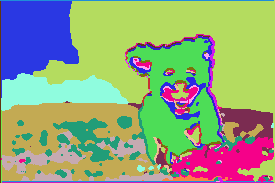

77 / 1000 |  label num : 23  | loss : 0.13575878739356995


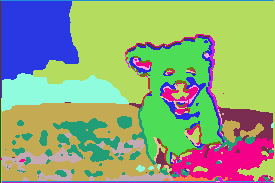

78 / 1000 |  label num : 23  | loss : 0.13922733068466187


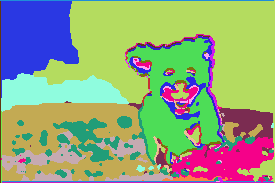

79 / 1000 |  label num : 23  | loss : 0.13521823287010193


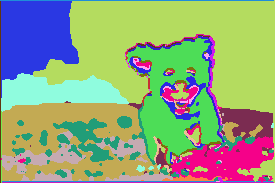

80 / 1000 |  label num : 23  | loss : 0.13540878891944885


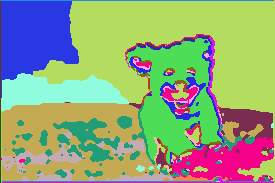

81 / 1000 |  label num : 23  | loss : 0.13339152932167053


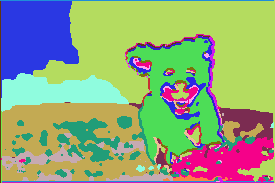

82 / 1000 |  label num : 23  | loss : 0.13360939919948578


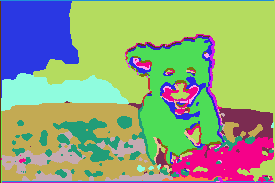

83 / 1000 |  label num : 23  | loss : 0.13265150785446167


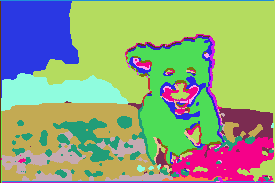

84 / 1000 |  label num : 23  | loss : 0.13217990100383759


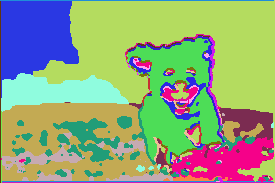

85 / 1000 |  label num : 23  | loss : 0.1317632496356964


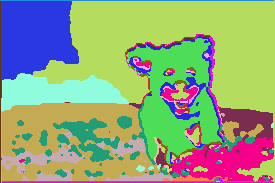

86 / 1000 |  label num : 23  | loss : 0.1304207444190979


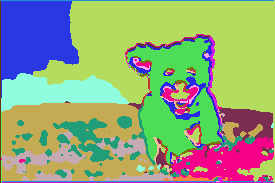

87 / 1000 |  label num : 23  | loss : 0.13021856546401978


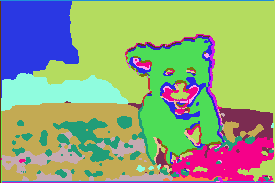

88 / 1000 |  label num : 23  | loss : 0.12936078011989594


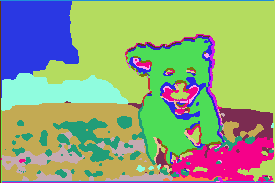

89 / 1000 |  label num : 23  | loss : 0.1289185732603073


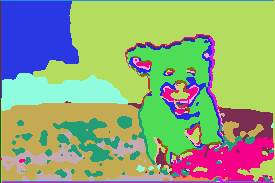

90 / 1000 |  label num : 23  | loss : 0.12830650806427002


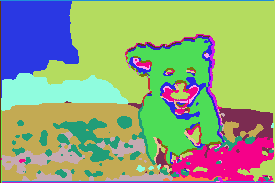

91 / 1000 |  label num : 23  | loss : 0.1279376745223999


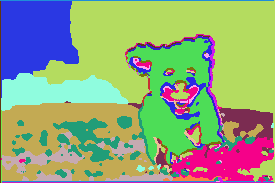

92 / 1000 |  label num : 23  | loss : 0.12732914090156555


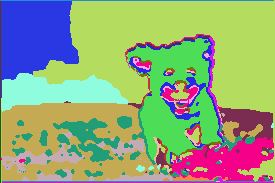

93 / 1000 |  label num : 23  | loss : 0.12720805406570435


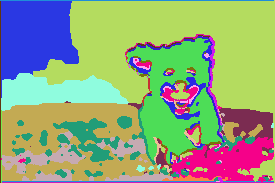

94 / 1000 |  label num : 23  | loss : 0.12704864144325256


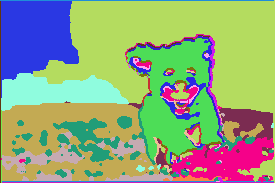

95 / 1000 |  label num : 23  | loss : 0.12601174414157867


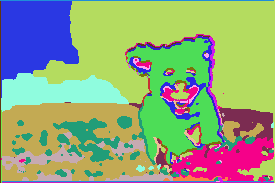

96 / 1000 |  label num : 23  | loss : 0.1260707527399063


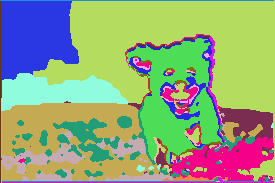

97 / 1000 |  label num : 23  | loss : 0.12571600079536438


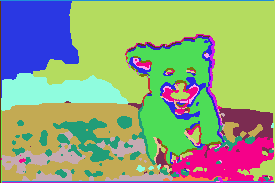

98 / 1000 |  label num : 23  | loss : 0.12479716539382935


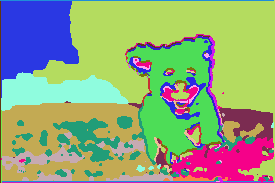

99 / 1000 |  label num : 23  | loss : 0.12541955709457397


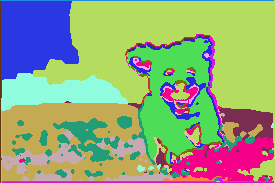

100 / 1000 |  label num : 23  | loss : 0.12466534972190857


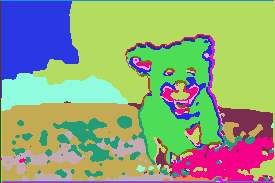

101 / 1000 |  label num : 23  | loss : 0.12409846484661102


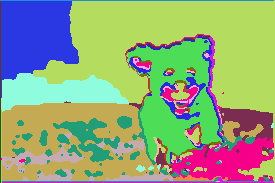

102 / 1000 |  label num : 23  | loss : 0.12434571981430054


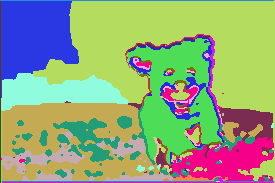

103 / 1000 |  label num : 23  | loss : 0.1226976215839386


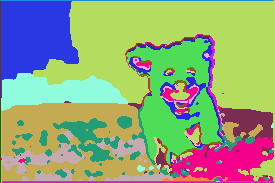

104 / 1000 |  label num : 23  | loss : 0.123338982462883


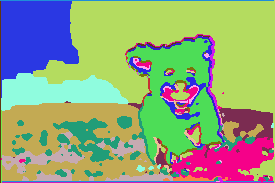

105 / 1000 |  label num : 23  | loss : 0.12186764180660248


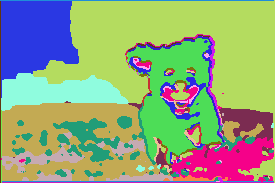

106 / 1000 |  label num : 23  | loss : 0.1220180094242096


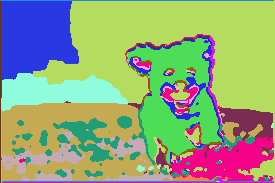

107 / 1000 |  label num : 23  | loss : 0.12148402631282806


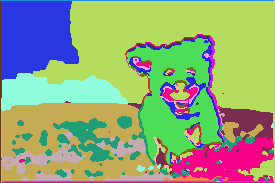

108 / 1000 |  label num : 23  | loss : 0.12063629925251007


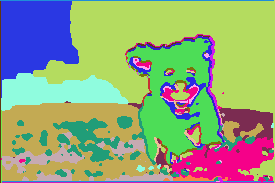

109 / 1000 |  label num : 23  | loss : 0.12059549987316132


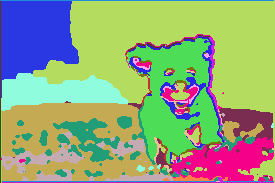

110 / 1000 |  label num : 23  | loss : 0.1200273334980011


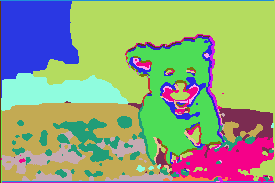

111 / 1000 |  label num : 23  | loss : 0.12005928158760071


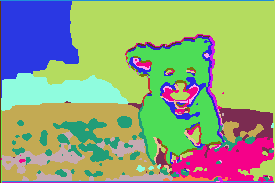

112 / 1000 |  label num : 23  | loss : 0.119366854429245


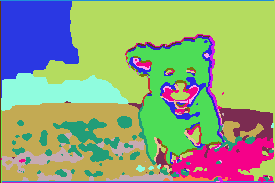

113 / 1000 |  label num : 23  | loss : 0.12023065984249115


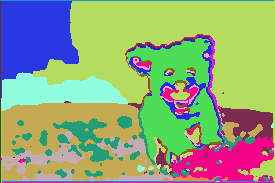

114 / 1000 |  label num : 23  | loss : 0.11915247142314911


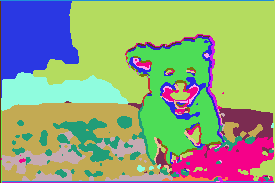

115 / 1000 |  label num : 23  | loss : 0.11898010969161987


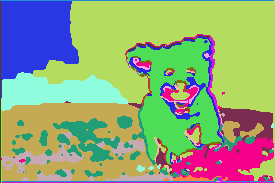

116 / 1000 |  label num : 23  | loss : 0.11851388961076736


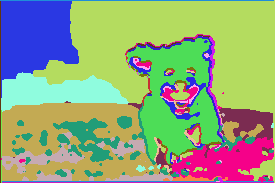

117 / 1000 |  label num : 23  | loss : 0.11773045361042023


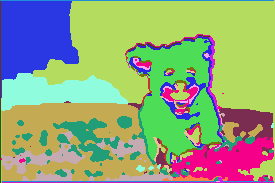

118 / 1000 |  label num : 23  | loss : 0.11767736077308655


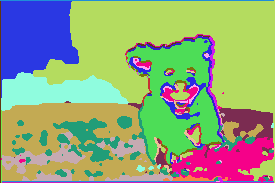

119 / 1000 |  label num : 23  | loss : 0.11707593500614166


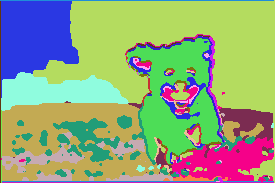

120 / 1000 |  label num : 23  | loss : 0.11701501905918121


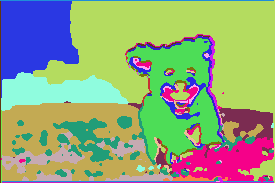

121 / 1000 |  label num : 23  | loss : 0.11626012623310089


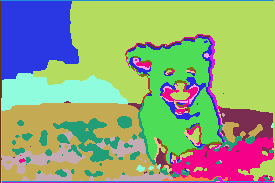

122 / 1000 |  label num : 23  | loss : 0.11647813767194748


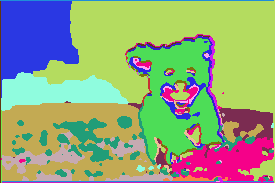

123 / 1000 |  label num : 23  | loss : 0.11569797992706299


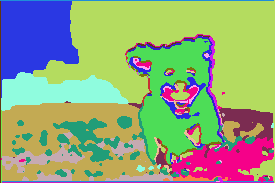

124 / 1000 |  label num : 23  | loss : 0.11579009145498276


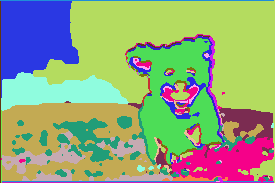

125 / 1000 |  label num : 23  | loss : 0.1151440441608429


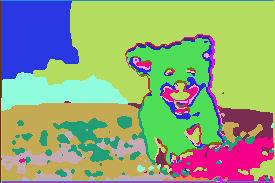

126 / 1000 |  label num : 23  | loss : 0.1153271347284317


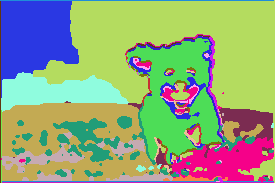

127 / 1000 |  label num : 23  | loss : 0.11490470170974731


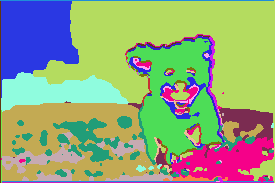

128 / 1000 |  label num : 23  | loss : 0.11435790359973907


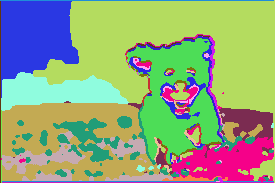

129 / 1000 |  label num : 23  | loss : 0.1144566684961319


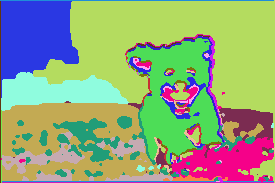

130 / 1000 |  label num : 23  | loss : 0.11356999725103378


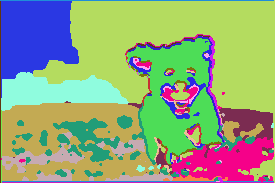

131 / 1000 |  label num : 23  | loss : 0.11365033686161041


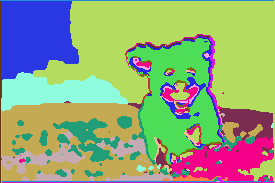

132 / 1000 |  label num : 23  | loss : 0.11309032142162323


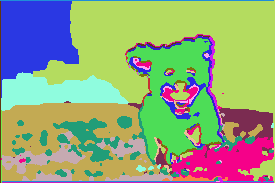

133 / 1000 |  label num : 23  | loss : 0.11304279416799545


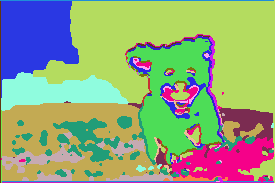

134 / 1000 |  label num : 23  | loss : 0.1131853461265564


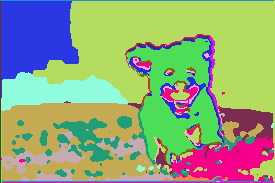

135 / 1000 |  label num : 23  | loss : 0.1123424768447876


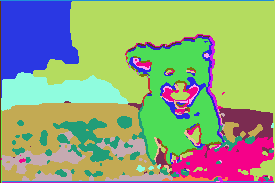

136 / 1000 |  label num : 23  | loss : 0.11279725283384323


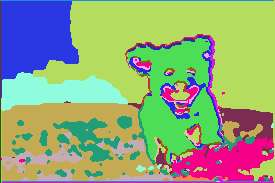

137 / 1000 |  label num : 23  | loss : 0.11233086884021759


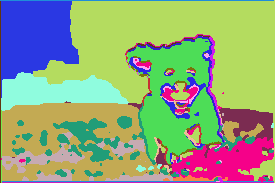

138 / 1000 |  label num : 23  | loss : 0.11160498857498169


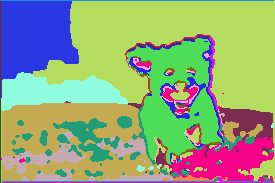

139 / 1000 |  label num : 23  | loss : 0.11175566911697388


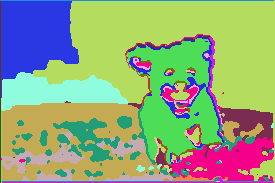

140 / 1000 |  label num : 23  | loss : 0.11095333099365234


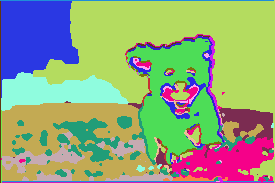

141 / 1000 |  label num : 23  | loss : 0.1107960194349289


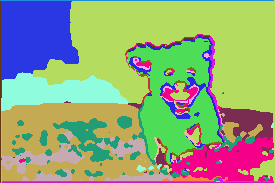

142 / 1000 |  label num : 23  | loss : 0.1106293648481369


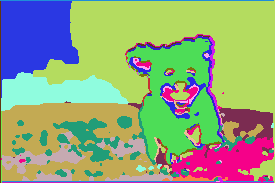

143 / 1000 |  label num : 23  | loss : 0.11014655232429504


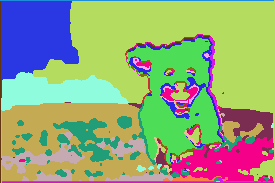

144 / 1000 |  label num : 23  | loss : 0.11011428385972977


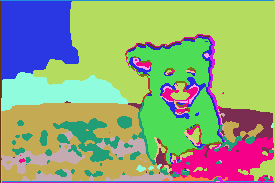

145 / 1000 |  label num : 23  | loss : 0.1096978709101677


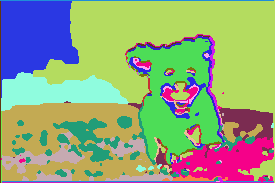

146 / 1000 |  label num : 23  | loss : 0.10951822996139526


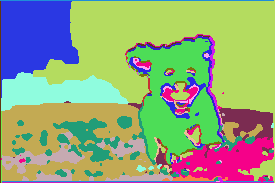

147 / 1000 |  label num : 23  | loss : 0.10914185643196106


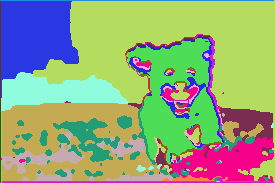

148 / 1000 |  label num : 23  | loss : 0.10888315737247467


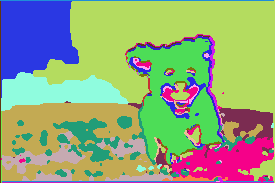

149 / 1000 |  label num : 23  | loss : 0.10891960561275482


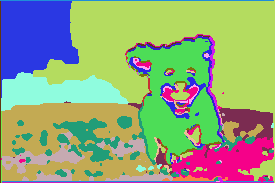

150 / 1000 |  label num : 23  | loss : 0.10842706263065338


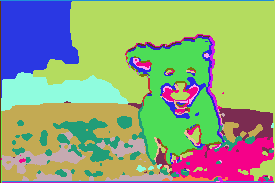

151 / 1000 |  label num : 23  | loss : 0.10826210677623749


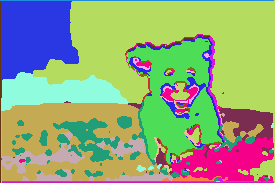

152 / 1000 |  label num : 23  | loss : 0.1079590916633606


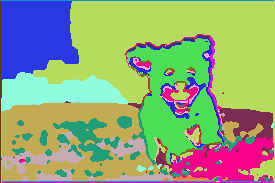

153 / 1000 |  label num : 23  | loss : 0.10774166882038116


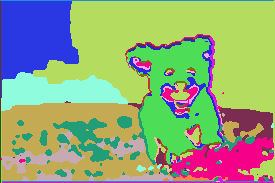

154 / 1000 |  label num : 23  | loss : 0.10751915723085403


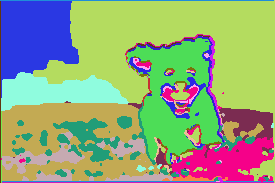

155 / 1000 |  label num : 23  | loss : 0.10727201402187347


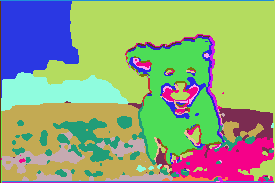

156 / 1000 |  label num : 23  | loss : 0.10699030011892319


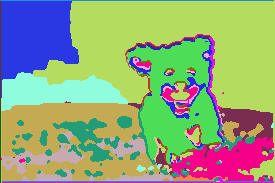

157 / 1000 |  label num : 23  | loss : 0.1069524735212326


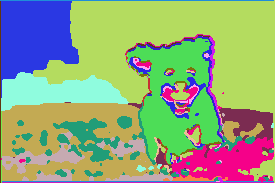

158 / 1000 |  label num : 23  | loss : 0.10673500597476959


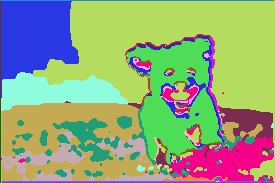

159 / 1000 |  label num : 23  | loss : 0.10738421976566315


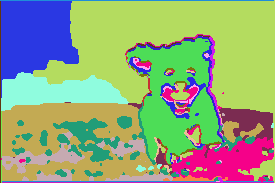

160 / 1000 |  label num : 23  | loss : 0.1063622534275055


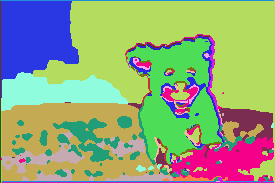

161 / 1000 |  label num : 23  | loss : 0.10610789805650711


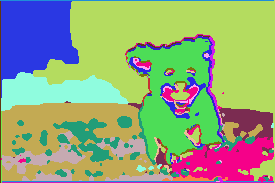

162 / 1000 |  label num : 23  | loss : 0.10643959045410156


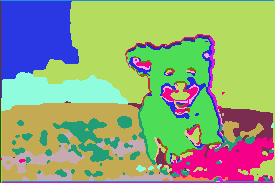

163 / 1000 |  label num : 23  | loss : 0.10574962943792343


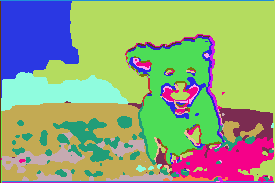

164 / 1000 |  label num : 23  | loss : 0.10569140315055847


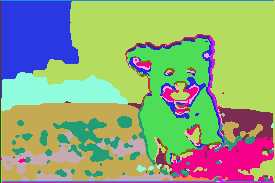

165 / 1000 |  label num : 23  | loss : 0.10552200675010681


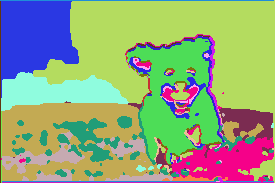

166 / 1000 |  label num : 23  | loss : 0.1049799770116806


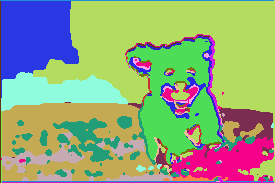

167 / 1000 |  label num : 23  | loss : 0.10512405633926392


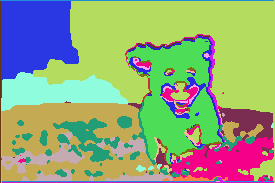

168 / 1000 |  label num : 23  | loss : 0.10470937192440033


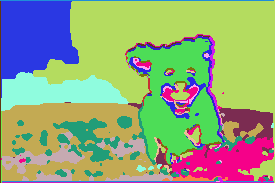

169 / 1000 |  label num : 23  | loss : 0.10446128249168396


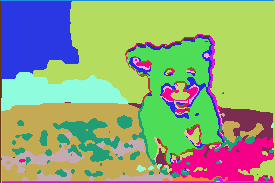

170 / 1000 |  label num : 23  | loss : 0.10469044744968414


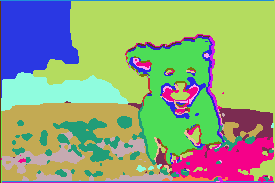

171 / 1000 |  label num : 23  | loss : 0.10418853908777237


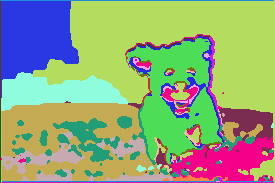

172 / 1000 |  label num : 23  | loss : 0.10397489368915558


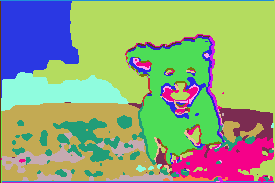

173 / 1000 |  label num : 23  | loss : 0.10427374392747879


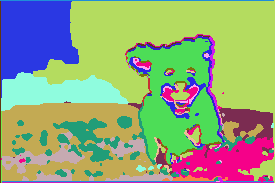

174 / 1000 |  label num : 23  | loss : 0.10352599620819092


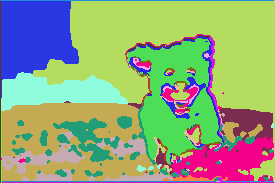

175 / 1000 |  label num : 23  | loss : 0.10383404046297073


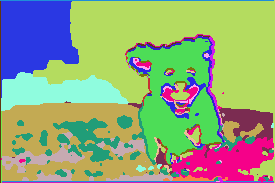

176 / 1000 |  label num : 23  | loss : 0.10351940989494324


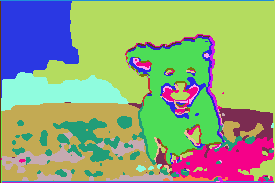

177 / 1000 |  label num : 23  | loss : 0.10336191952228546


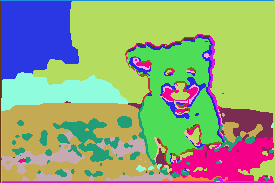

178 / 1000 |  label num : 23  | loss : 0.10328008234500885


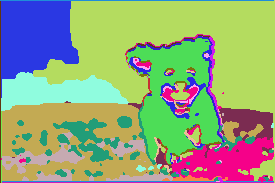

179 / 1000 |  label num : 23  | loss : 0.10286395996809006


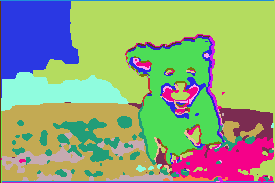

180 / 1000 |  label num : 23  | loss : 0.10283556580543518


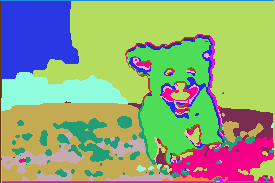

181 / 1000 |  label num : 23  | loss : 0.10236460715532303


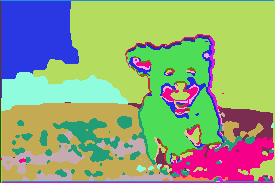

182 / 1000 |  label num : 23  | loss : 0.10242640972137451


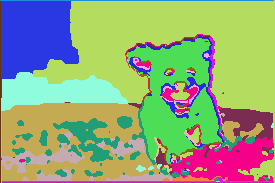

183 / 1000 |  label num : 23  | loss : 0.10229574143886566


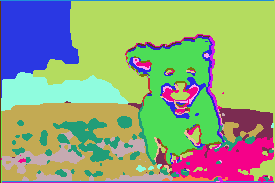

184 / 1000 |  label num : 23  | loss : 0.1020648330450058


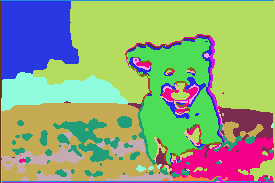

185 / 1000 |  label num : 23  | loss : 0.10187630355358124


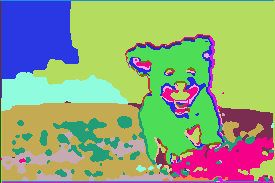

186 / 1000 |  label num : 23  | loss : 0.10152441263198853


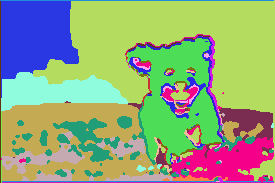

187 / 1000 |  label num : 23  | loss : 0.1015661433339119


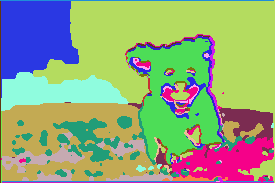

188 / 1000 |  label num : 23  | loss : 0.1013793796300888


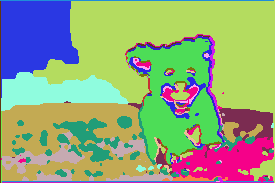

189 / 1000 |  label num : 23  | loss : 0.10118158906698227


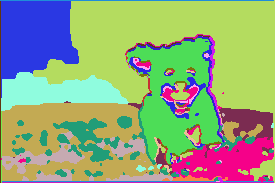

190 / 1000 |  label num : 23  | loss : 0.10097233951091766


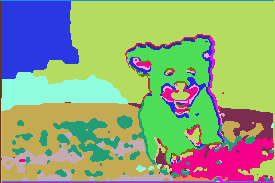

191 / 1000 |  label num : 23  | loss : 0.10156872123479843


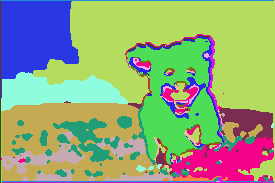

192 / 1000 |  label num : 23  | loss : 0.10121159255504608


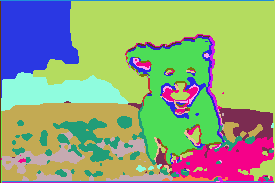

193 / 1000 |  label num : 23  | loss : 0.10055014491081238


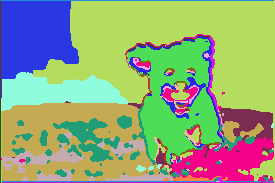

194 / 1000 |  label num : 23  | loss : 0.10080598294734955


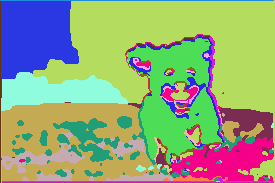

195 / 1000 |  label num : 23  | loss : 0.10030646622180939


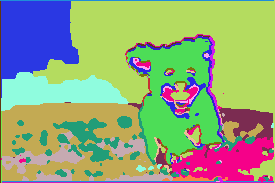

196 / 1000 |  label num : 23  | loss : 0.1002749651670456


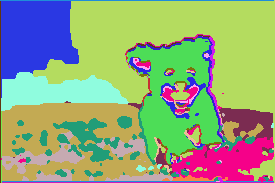

197 / 1000 |  label num : 23  | loss : 0.10000848025083542


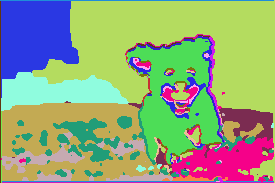

198 / 1000 |  label num : 23  | loss : 0.10012055933475494


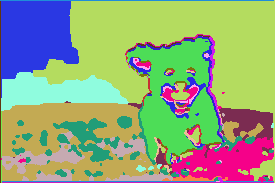

199 / 1000 |  label num : 23  | loss : 0.09981997311115265


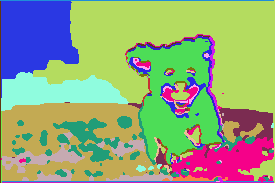

200 / 1000 |  label num : 23  | loss : 0.09972677379846573


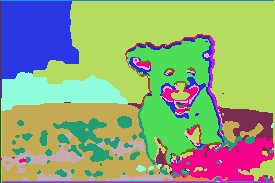

201 / 1000 |  label num : 23  | loss : 0.09964660555124283


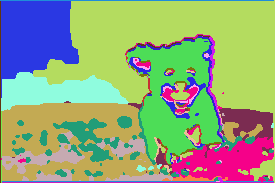

202 / 1000 |  label num : 23  | loss : 0.09974666684865952


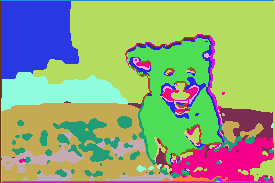

203 / 1000 |  label num : 23  | loss : 0.09915061295032501


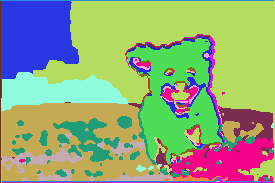

204 / 1000 |  label num : 23  | loss : 0.10045531392097473


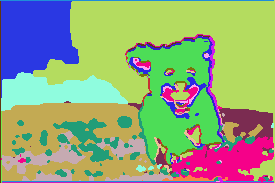

205 / 1000 |  label num : 23  | loss : 0.10053171217441559


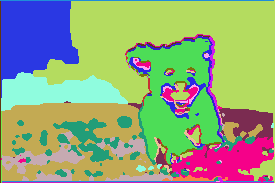

206 / 1000 |  label num : 23  | loss : 0.09947612136602402


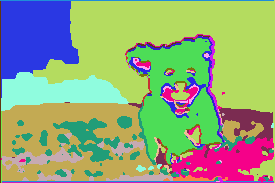

207 / 1000 |  label num : 23  | loss : 0.1005026251077652


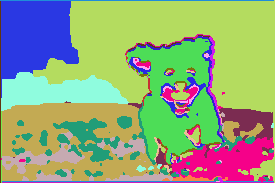

208 / 1000 |  label num : 23  | loss : 0.09912269562482834


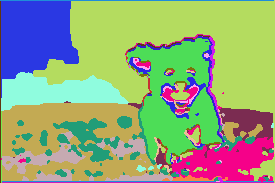

209 / 1000 |  label num : 23  | loss : 0.09877894818782806


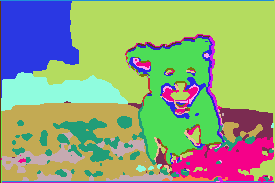

210 / 1000 |  label num : 23  | loss : 0.0984782874584198


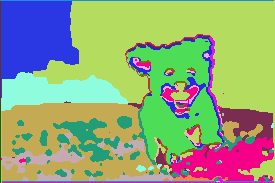

211 / 1000 |  label num : 23  | loss : 0.09840910881757736


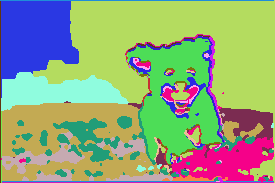

212 / 1000 |  label num : 23  | loss : 0.09780840575695038


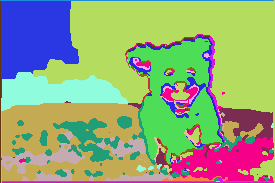

213 / 1000 |  label num : 23  | loss : 0.09808792173862457


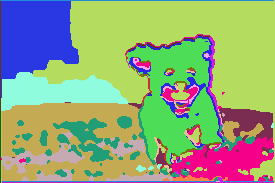

214 / 1000 |  label num : 23  | loss : 0.09745719283819199


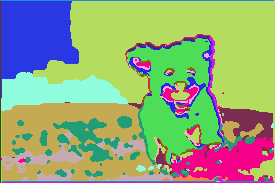

215 / 1000 |  label num : 23  | loss : 0.09751958400011063


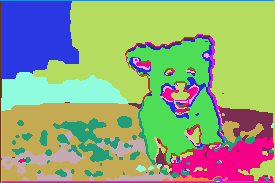

216 / 1000 |  label num : 23  | loss : 0.09730779379606247


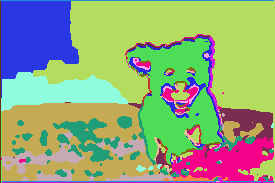

217 / 1000 |  label num : 23  | loss : 0.09711409360170364


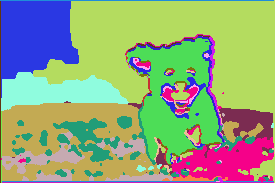

218 / 1000 |  label num : 23  | loss : 0.09707879275083542


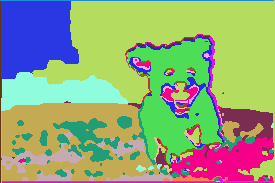

219 / 1000 |  label num : 23  | loss : 0.09687287360429764


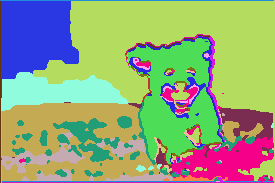

220 / 1000 |  label num : 23  | loss : 0.09670017659664154


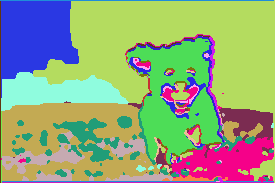

221 / 1000 |  label num : 23  | loss : 0.09661760181188583


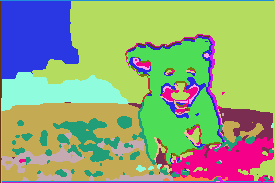

222 / 1000 |  label num : 23  | loss : 0.09675385057926178


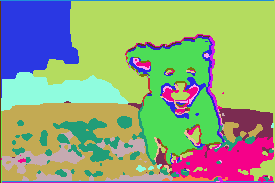

223 / 1000 |  label num : 23  | loss : 0.09654133021831512


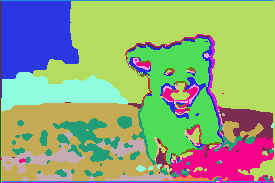

224 / 1000 |  label num : 23  | loss : 0.09614401310682297


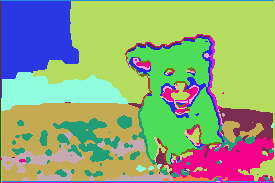

225 / 1000 |  label num : 23  | loss : 0.09629961848258972


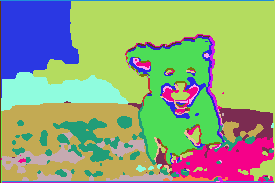

226 / 1000 |  label num : 23  | loss : 0.09600500762462616


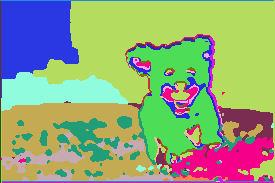

227 / 1000 |  label num : 23  | loss : 0.09606324136257172


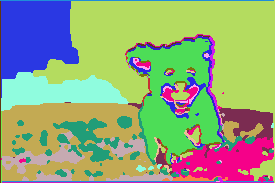

228 / 1000 |  label num : 23  | loss : 0.09560810029506683


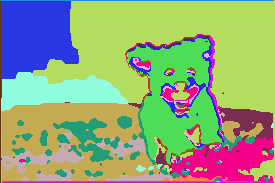

229 / 1000 |  label num : 23  | loss : 0.09597808867692947


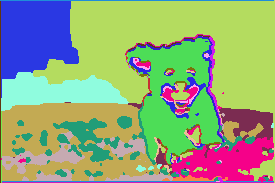

230 / 1000 |  label num : 23  | loss : 0.09544771164655685


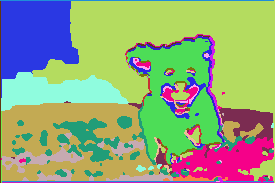

231 / 1000 |  label num : 23  | loss : 0.09615194797515869


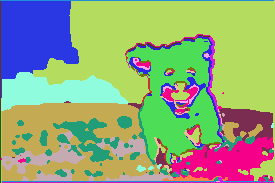

232 / 1000 |  label num : 23  | loss : 0.0961364358663559


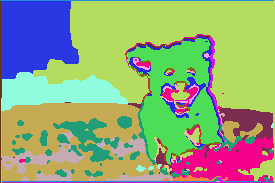

233 / 1000 |  label num : 23  | loss : 0.0952426865696907


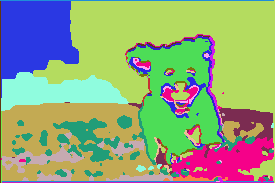

234 / 1000 |  label num : 23  | loss : 0.09577347338199615


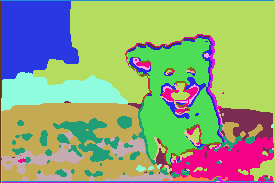

235 / 1000 |  label num : 23  | loss : 0.09546522051095963


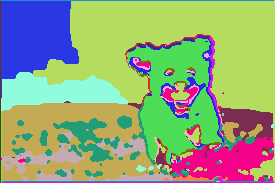

236 / 1000 |  label num : 23  | loss : 0.09486524015665054


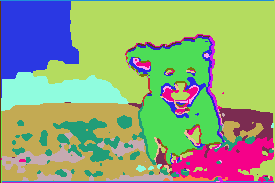

237 / 1000 |  label num : 23  | loss : 0.09511997550725937


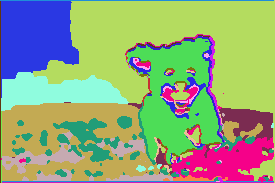

238 / 1000 |  label num : 23  | loss : 0.09454095363616943


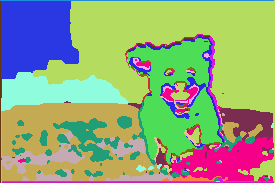

239 / 1000 |  label num : 23  | loss : 0.09471874684095383


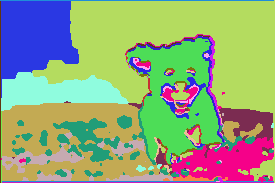

240 / 1000 |  label num : 23  | loss : 0.09462520480155945


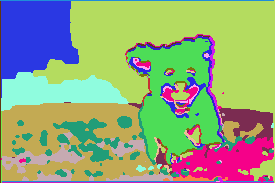

241 / 1000 |  label num : 23  | loss : 0.09416081011295319


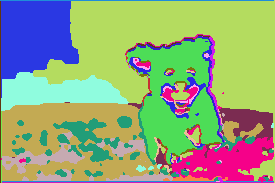

242 / 1000 |  label num : 23  | loss : 0.09414514154195786


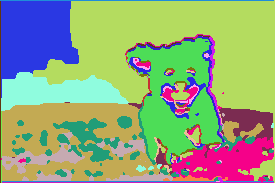

243 / 1000 |  label num : 23  | loss : 0.09380155056715012


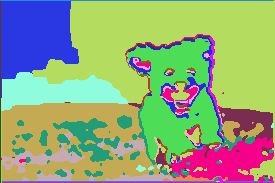

244 / 1000 |  label num : 23  | loss : 0.09410088509321213


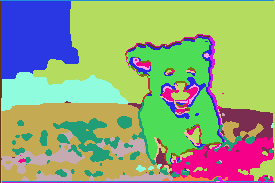

245 / 1000 |  label num : 23  | loss : 0.09377974271774292


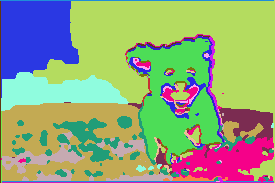

246 / 1000 |  label num : 23  | loss : 0.09351891279220581


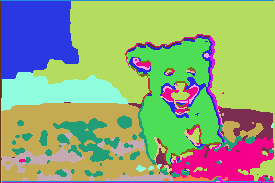

247 / 1000 |  label num : 23  | loss : 0.09383807331323624


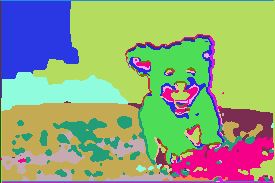

248 / 1000 |  label num : 23  | loss : 0.09360156208276749


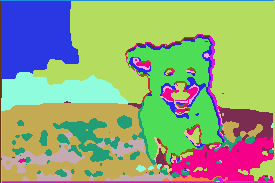

249 / 1000 |  label num : 23  | loss : 0.09323255717754364


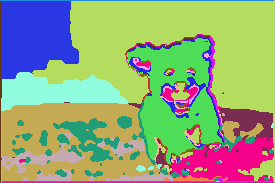

250 / 1000 |  label num : 23  | loss : 0.09309328347444534


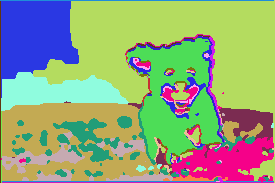

251 / 1000 |  label num : 23  | loss : 0.09297733008861542


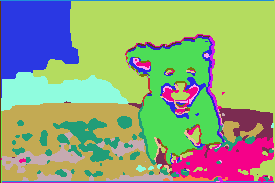

252 / 1000 |  label num : 23  | loss : 0.09283111989498138


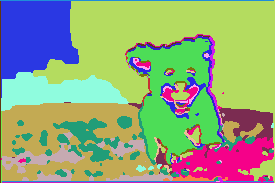

253 / 1000 |  label num : 23  | loss : 0.09259681403636932


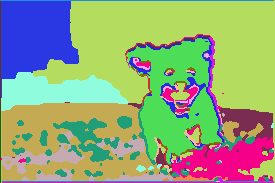

254 / 1000 |  label num : 23  | loss : 0.09278301894664764


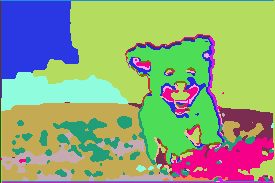

255 / 1000 |  label num : 23  | loss : 0.09253743290901184


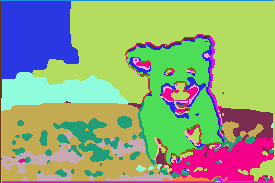

256 / 1000 |  label num : 23  | loss : 0.09260225296020508


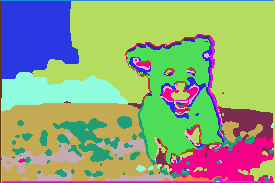

257 / 1000 |  label num : 23  | loss : 0.09226109832525253


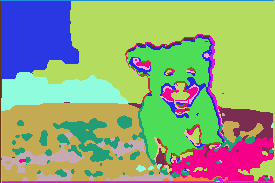

258 / 1000 |  label num : 23  | loss : 0.09224240481853485


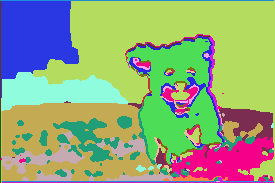

259 / 1000 |  label num : 23  | loss : 0.09207400679588318


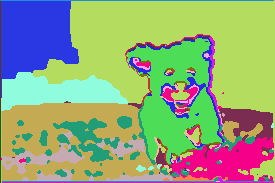

260 / 1000 |  label num : 23  | loss : 0.09186798334121704


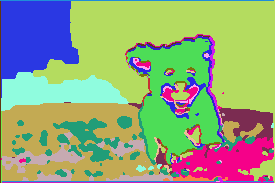

261 / 1000 |  label num : 23  | loss : 0.09165916591882706


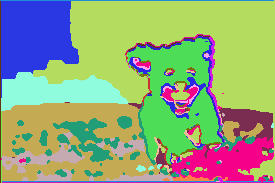

262 / 1000 |  label num : 23  | loss : 0.09157899022102356


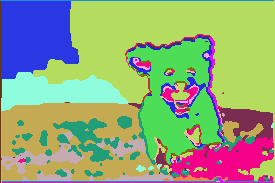

263 / 1000 |  label num : 23  | loss : 0.09153507649898529


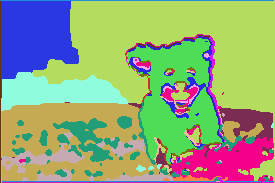

264 / 1000 |  label num : 23  | loss : 0.0914829671382904


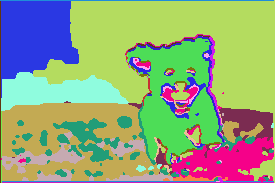

265 / 1000 |  label num : 23  | loss : 0.09136778116226196


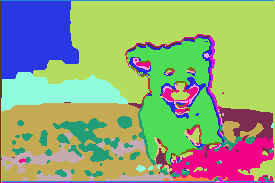

266 / 1000 |  label num : 23  | loss : 0.09115780889987946


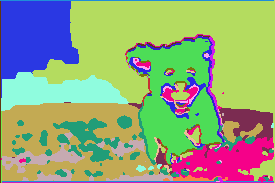

267 / 1000 |  label num : 23  | loss : 0.09105328470468521


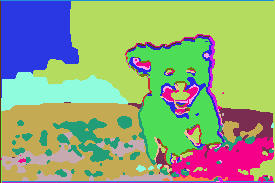

268 / 1000 |  label num : 23  | loss : 0.09095682203769684


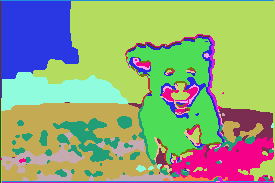

269 / 1000 |  label num : 23  | loss : 0.0908341258764267


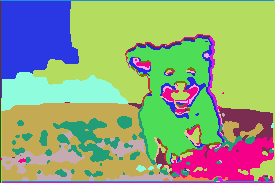

270 / 1000 |  label num : 23  | loss : 0.09074819087982178


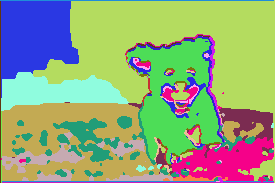

271 / 1000 |  label num : 23  | loss : 0.09090030938386917


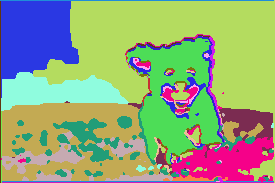

272 / 1000 |  label num : 23  | loss : 0.09094315022230148


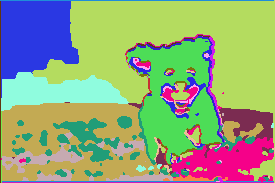

273 / 1000 |  label num : 23  | loss : 0.09067406505346298


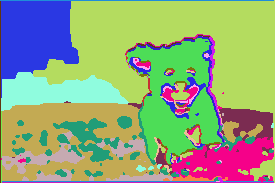

274 / 1000 |  label num : 23  | loss : 0.09067563712596893


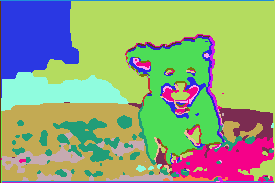

275 / 1000 |  label num : 23  | loss : 0.09040727466344833


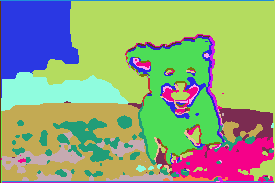

276 / 1000 |  label num : 23  | loss : 0.09042301028966904


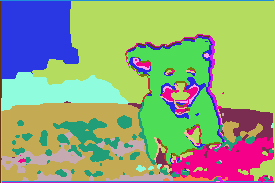

277 / 1000 |  label num : 23  | loss : 0.09017696231603622


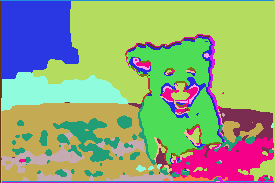

278 / 1000 |  label num : 23  | loss : 0.09022536128759384


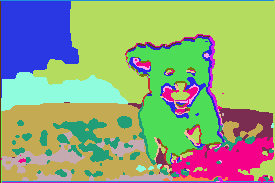

279 / 1000 |  label num : 23  | loss : 0.0901079922914505


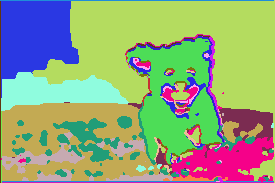

280 / 1000 |  label num : 23  | loss : 0.08987449109554291


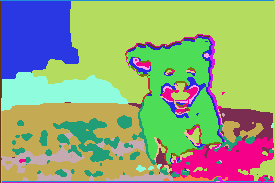

281 / 1000 |  label num : 23  | loss : 0.09036663919687271


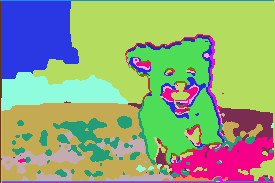

282 / 1000 |  label num : 23  | loss : 0.09045332670211792


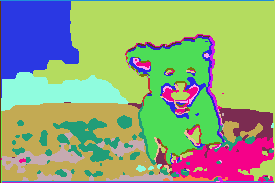

283 / 1000 |  label num : 23  | loss : 0.08952079713344574


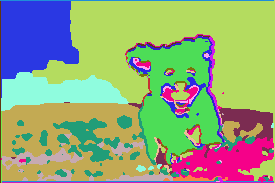

284 / 1000 |  label num : 23  | loss : 0.09174496680498123


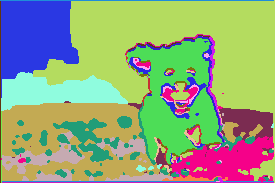

285 / 1000 |  label num : 23  | loss : 0.09202080965042114


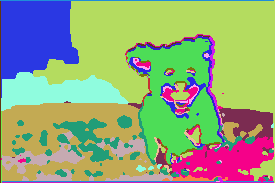

286 / 1000 |  label num : 23  | loss : 0.09072317183017731


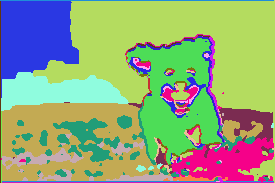

287 / 1000 |  label num : 23  | loss : 0.09226392209529877


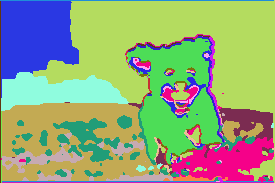

288 / 1000 |  label num : 23  | loss : 0.09043572843074799


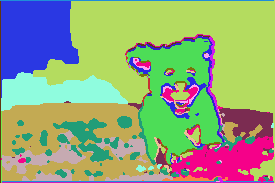

289 / 1000 |  label num : 23  | loss : 0.09256498515605927


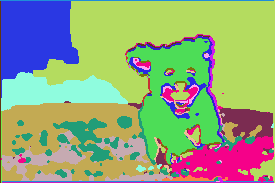

290 / 1000 |  label num : 23  | loss : 0.09342219680547714


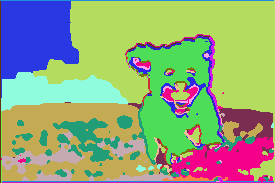

291 / 1000 |  label num : 23  | loss : 0.09013431519269943


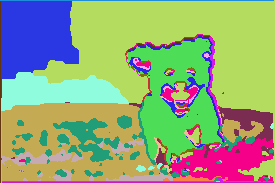

292 / 1000 |  label num : 23  | loss : 0.09456443786621094


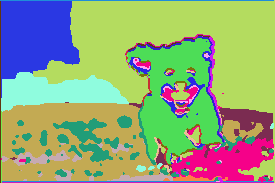

293 / 1000 |  label num : 23  | loss : 0.09289023280143738


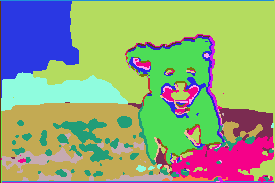

294 / 1000 |  label num : 23  | loss : 0.09168761968612671


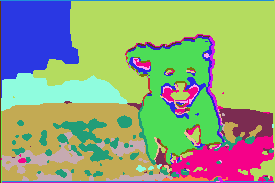

295 / 1000 |  label num : 23  | loss : 0.09490129351615906


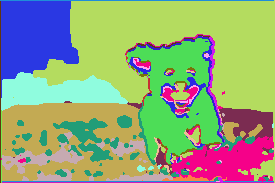

296 / 1000 |  label num : 23  | loss : 0.09348470717668533


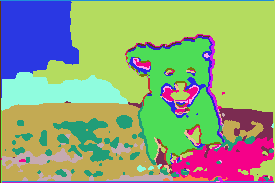

297 / 1000 |  label num : 23  | loss : 0.0928335189819336


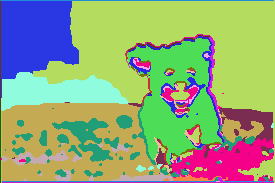

298 / 1000 |  label num : 23  | loss : 0.09317965805530548


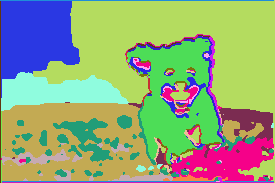

299 / 1000 |  label num : 23  | loss : 0.09120945632457733


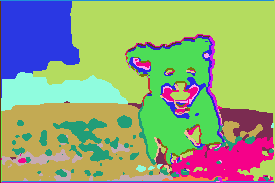

300 / 1000 |  label num : 23  | loss : 0.09138868004083633


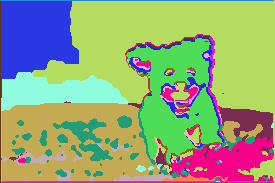

301 / 1000 |  label num : 23  | loss : 0.08977268636226654


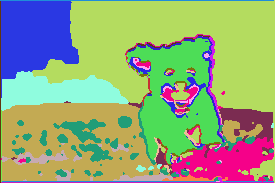

302 / 1000 |  label num : 23  | loss : 0.08984161913394928


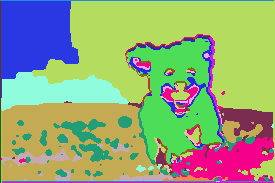

303 / 1000 |  label num : 23  | loss : 0.09002208709716797


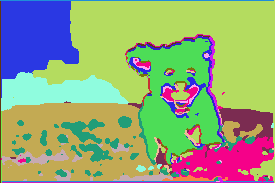

304 / 1000 |  label num : 23  | loss : 0.08881068974733353


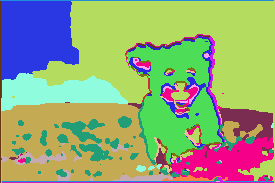

305 / 1000 |  label num : 23  | loss : 0.08897682279348373


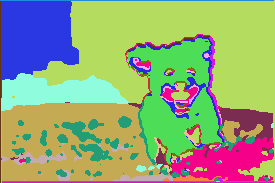

306 / 1000 |  label num : 23  | loss : 0.08879700303077698


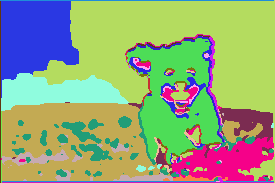

307 / 1000 |  label num : 23  | loss : 0.08832249790430069


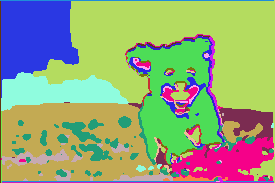

308 / 1000 |  label num : 23  | loss : 0.08876445144414902


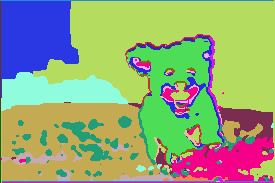

309 / 1000 |  label num : 23  | loss : 0.08752693235874176


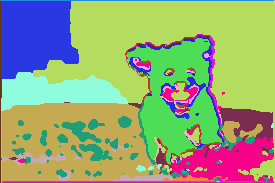

310 / 1000 |  label num : 23  | loss : 0.08778271079063416


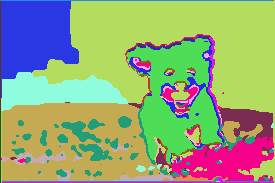

311 / 1000 |  label num : 23  | loss : 0.086959108710289


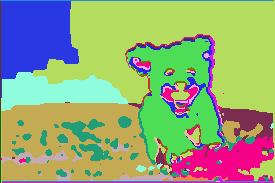

312 / 1000 |  label num : 23  | loss : 0.08705709874629974


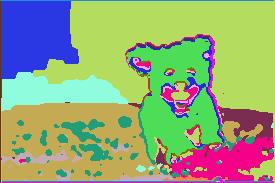

313 / 1000 |  label num : 23  | loss : 0.08707176148891449


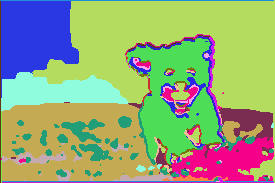

314 / 1000 |  label num : 23  | loss : 0.08625219762325287


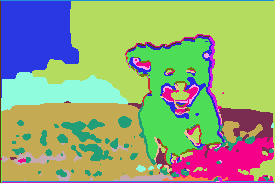

315 / 1000 |  label num : 23  | loss : 0.08635664731264114


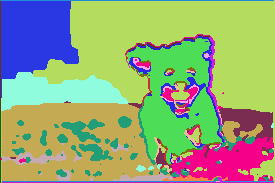

316 / 1000 |  label num : 23  | loss : 0.08587247133255005


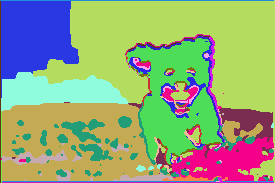

317 / 1000 |  label num : 23  | loss : 0.08604586124420166


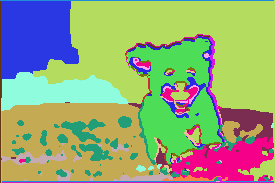

318 / 1000 |  label num : 23  | loss : 0.08561263978481293


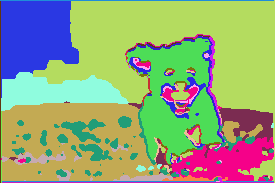

319 / 1000 |  label num : 23  | loss : 0.08576638996601105


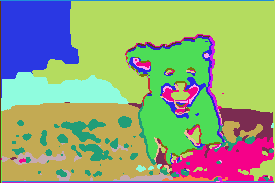

320 / 1000 |  label num : 23  | loss : 0.08523022383451462


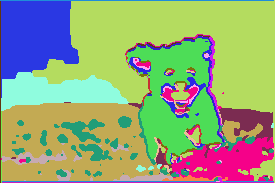

321 / 1000 |  label num : 23  | loss : 0.08521702140569687


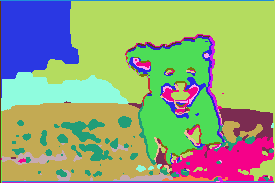

322 / 1000 |  label num : 23  | loss : 0.0848320722579956


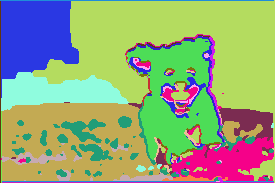

323 / 1000 |  label num : 23  | loss : 0.08503538370132446


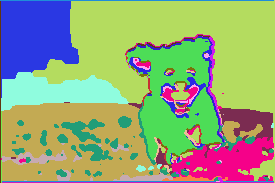

324 / 1000 |  label num : 23  | loss : 0.08445572853088379


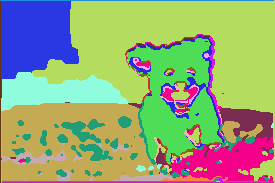

325 / 1000 |  label num : 23  | loss : 0.08445192128419876


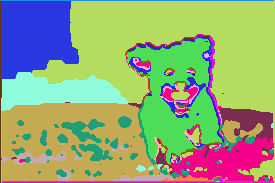

326 / 1000 |  label num : 23  | loss : 0.08467557281255722


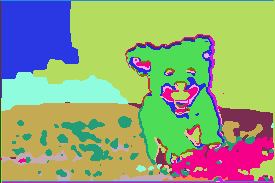

327 / 1000 |  label num : 23  | loss : 0.08435966074466705


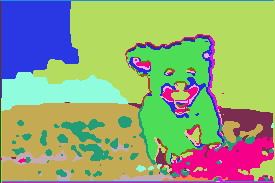

328 / 1000 |  label num : 23  | loss : 0.08414234966039658


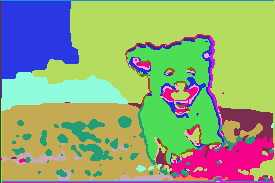

329 / 1000 |  label num : 23  | loss : 0.084140844643116


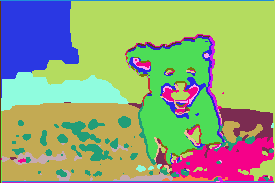

330 / 1000 |  label num : 23  | loss : 0.0839499831199646


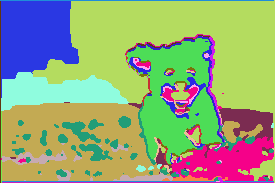

331 / 1000 |  label num : 23  | loss : 0.0837424099445343


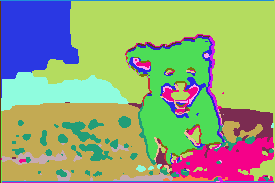

332 / 1000 |  label num : 23  | loss : 0.08362069725990295


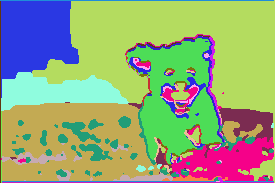

333 / 1000 |  label num : 23  | loss : 0.08353668451309204


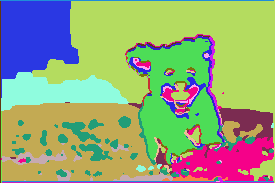

334 / 1000 |  label num : 23  | loss : 0.08332614600658417


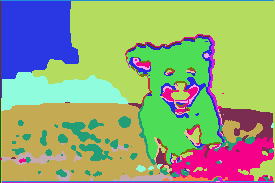

335 / 1000 |  label num : 23  | loss : 0.08346885442733765


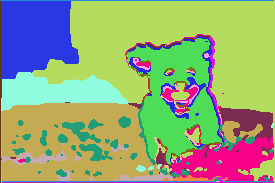

336 / 1000 |  label num : 23  | loss : 0.08318603038787842


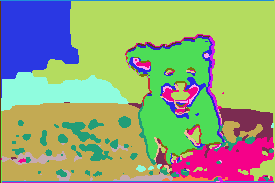

337 / 1000 |  label num : 23  | loss : 0.0830438956618309


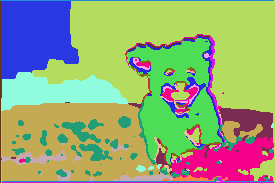

338 / 1000 |  label num : 23  | loss : 0.08283281326293945


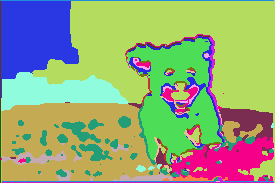

339 / 1000 |  label num : 23  | loss : 0.08280748873949051


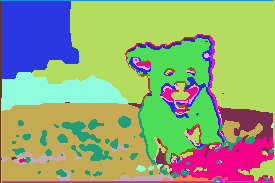

340 / 1000 |  label num : 23  | loss : 0.08300349861383438


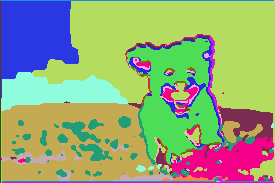

341 / 1000 |  label num : 23  | loss : 0.08261096477508545


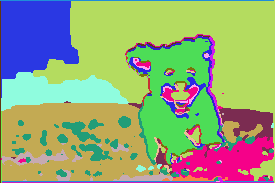

342 / 1000 |  label num : 23  | loss : 0.08298629522323608


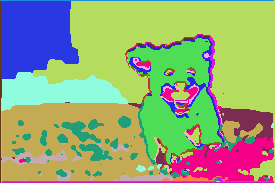

343 / 1000 |  label num : 23  | loss : 0.08274661004543304


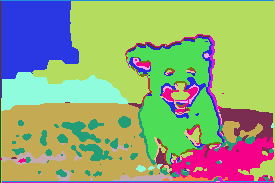

344 / 1000 |  label num : 23  | loss : 0.08247363567352295


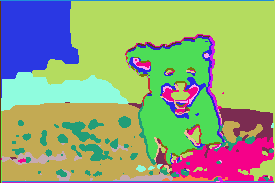

345 / 1000 |  label num : 23  | loss : 0.08236884325742722


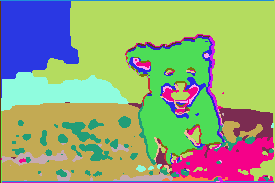

346 / 1000 |  label num : 23  | loss : 0.08246048539876938


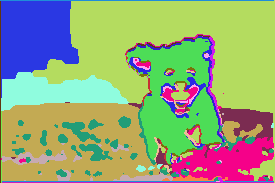

347 / 1000 |  label num : 23  | loss : 0.08204801380634308


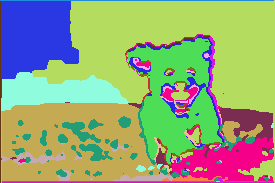

348 / 1000 |  label num : 23  | loss : 0.08229352533817291


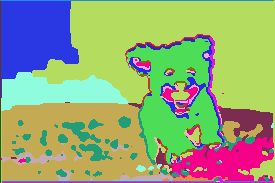

349 / 1000 |  label num : 23  | loss : 0.08183317631483078


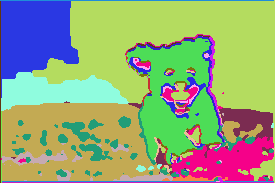

350 / 1000 |  label num : 23  | loss : 0.08212172985076904


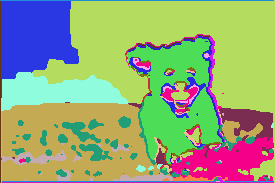

351 / 1000 |  label num : 23  | loss : 0.08183342218399048


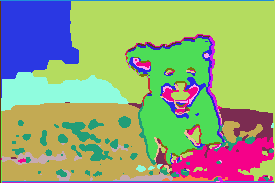

352 / 1000 |  label num : 23  | loss : 0.08167171478271484


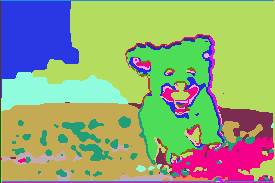

353 / 1000 |  label num : 23  | loss : 0.0815703496336937


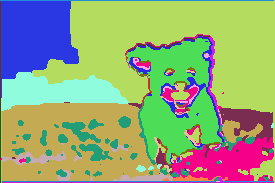

354 / 1000 |  label num : 23  | loss : 0.08169087022542953


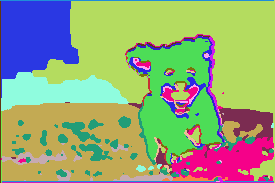

355 / 1000 |  label num : 23  | loss : 0.08115210384130478


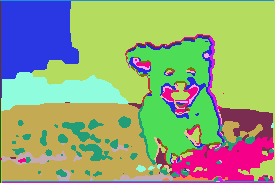

356 / 1000 |  label num : 23  | loss : 0.08129563927650452


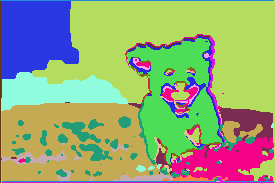

357 / 1000 |  label num : 23  | loss : 0.08116112649440765


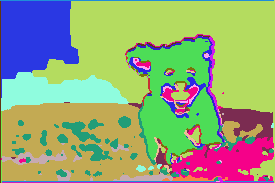

358 / 1000 |  label num : 23  | loss : 0.08108848333358765


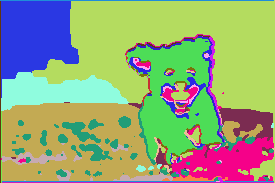

359 / 1000 |  label num : 23  | loss : 0.08077527582645416


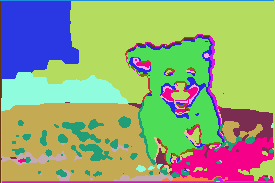

360 / 1000 |  label num : 23  | loss : 0.08093001693487167


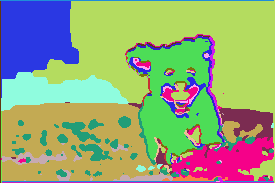

361 / 1000 |  label num : 23  | loss : 0.08062015473842621


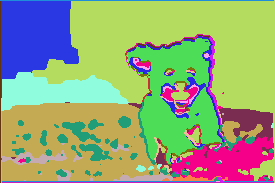

362 / 1000 |  label num : 23  | loss : 0.08065679669380188


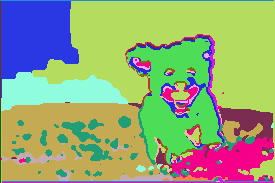

363 / 1000 |  label num : 23  | loss : 0.08084786683320999


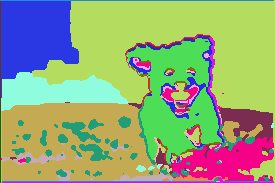

364 / 1000 |  label num : 23  | loss : 0.08077036589384079


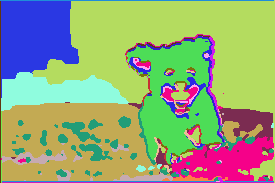

365 / 1000 |  label num : 23  | loss : 0.08078628033399582


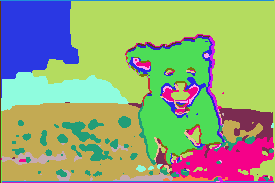

366 / 1000 |  label num : 23  | loss : 0.08086574077606201


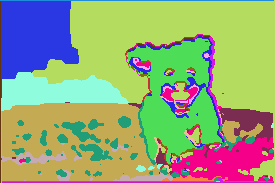

367 / 1000 |  label num : 23  | loss : 0.08042161166667938


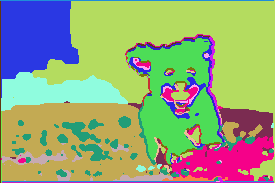

368 / 1000 |  label num : 23  | loss : 0.08177312463521957


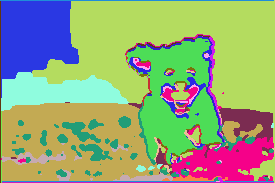

369 / 1000 |  label num : 23  | loss : 0.08011597394943237


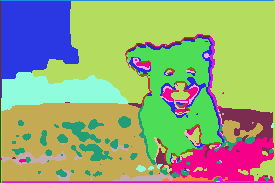

370 / 1000 |  label num : 23  | loss : 0.08069596439599991


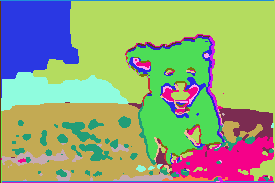

371 / 1000 |  label num : 23  | loss : 0.08065193891525269


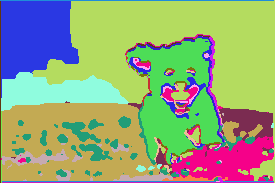

372 / 1000 |  label num : 23  | loss : 0.08104780316352844


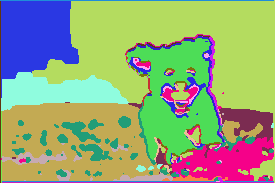

373 / 1000 |  label num : 23  | loss : 0.079963818192482


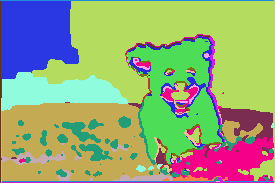

374 / 1000 |  label num : 23  | loss : 0.08011163771152496


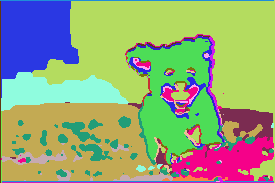

375 / 1000 |  label num : 23  | loss : 0.08005376160144806


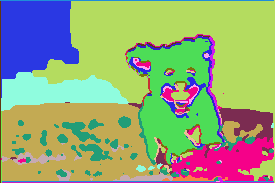

376 / 1000 |  label num : 23  | loss : 0.08000878989696503


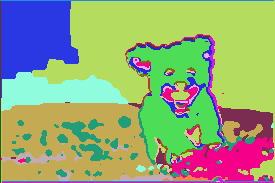

377 / 1000 |  label num : 23  | loss : 0.07954531908035278


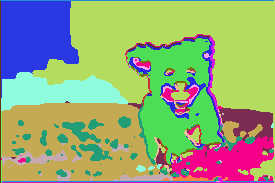

378 / 1000 |  label num : 23  | loss : 0.08037007600069046


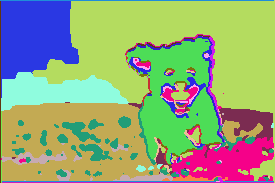

379 / 1000 |  label num : 23  | loss : 0.07938132435083389


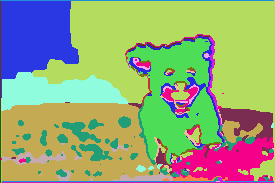

380 / 1000 |  label num : 23  | loss : 0.07937798649072647


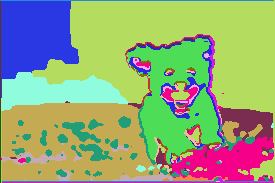

381 / 1000 |  label num : 23  | loss : 0.07985635101795197


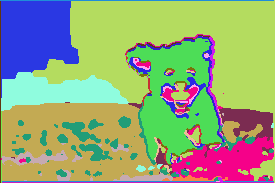

382 / 1000 |  label num : 23  | loss : 0.0795702338218689


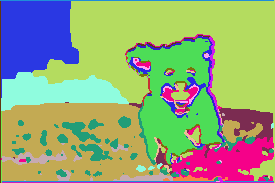

383 / 1000 |  label num : 23  | loss : 0.07981888949871063


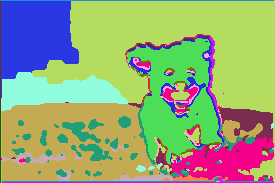

384 / 1000 |  label num : 23  | loss : 0.07954150438308716


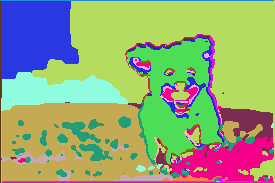

385 / 1000 |  label num : 23  | loss : 0.07931776344776154


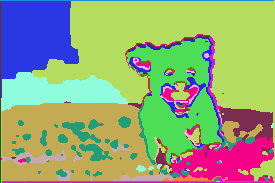

386 / 1000 |  label num : 23  | loss : 0.07926048338413239


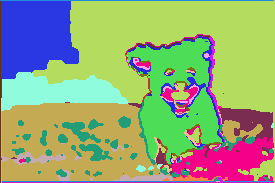

387 / 1000 |  label num : 23  | loss : 0.07943786680698395


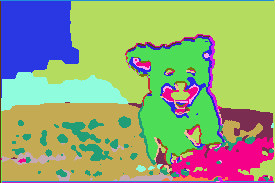

388 / 1000 |  label num : 23  | loss : 0.07906495779752731


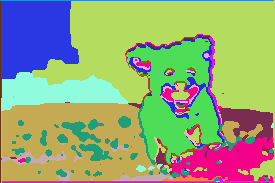

389 / 1000 |  label num : 23  | loss : 0.07896766066551208


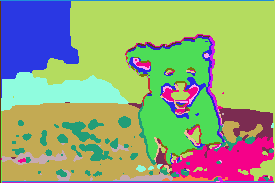

390 / 1000 |  label num : 23  | loss : 0.07881945371627808


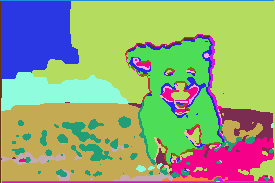

391 / 1000 |  label num : 23  | loss : 0.07917796075344086


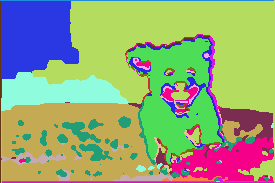

392 / 1000 |  label num : 23  | loss : 0.0787150114774704


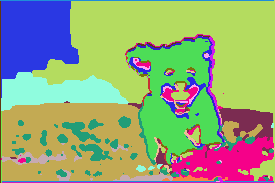

393 / 1000 |  label num : 23  | loss : 0.07870569825172424


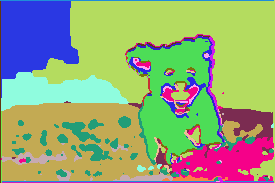

394 / 1000 |  label num : 23  | loss : 0.07881573587656021


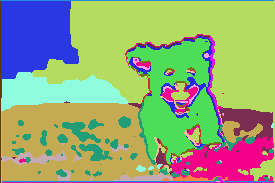

395 / 1000 |  label num : 23  | loss : 0.07837219536304474


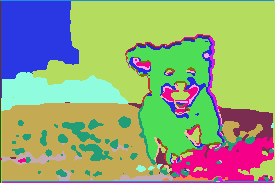

396 / 1000 |  label num : 23  | loss : 0.07852961122989655


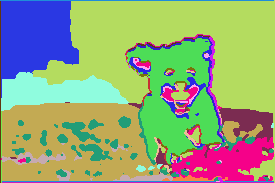

397 / 1000 |  label num : 23  | loss : 0.07850811630487442


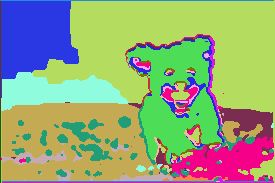

398 / 1000 |  label num : 23  | loss : 0.07828110456466675


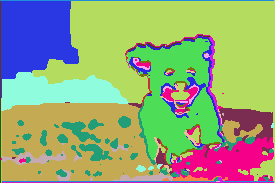

399 / 1000 |  label num : 23  | loss : 0.07837647199630737


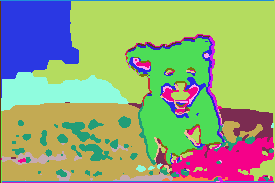

400 / 1000 |  label num : 23  | loss : 0.07788315415382385


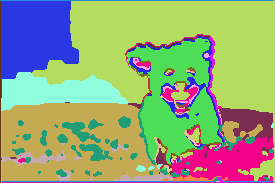

401 / 1000 |  label num : 23  | loss : 0.07808887213468552


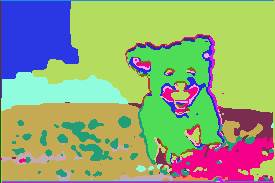

402 / 1000 |  label num : 23  | loss : 0.07797473669052124


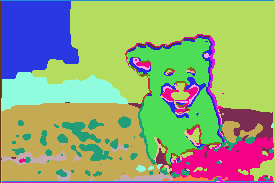

403 / 1000 |  label num : 23  | loss : 0.07762214541435242


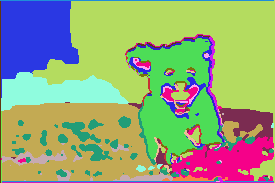

404 / 1000 |  label num : 23  | loss : 0.07824680209159851


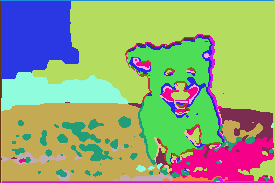

405 / 1000 |  label num : 23  | loss : 0.07809868454933167


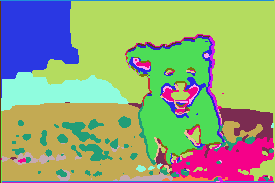

406 / 1000 |  label num : 23  | loss : 0.07781102508306503


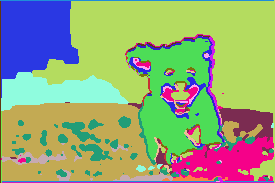

407 / 1000 |  label num : 23  | loss : 0.07776597887277603


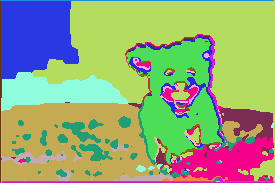

408 / 1000 |  label num : 23  | loss : 0.07750032842159271


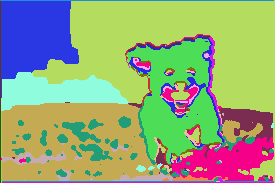

409 / 1000 |  label num : 23  | loss : 0.07761883735656738


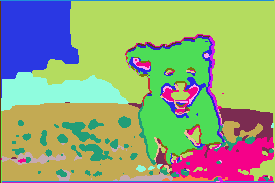

410 / 1000 |  label num : 23  | loss : 0.07742377370595932


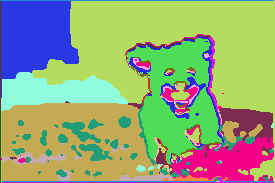

411 / 1000 |  label num : 23  | loss : 0.07813142240047455


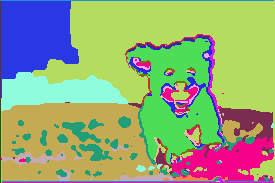

412 / 1000 |  label num : 23  | loss : 0.07746478915214539


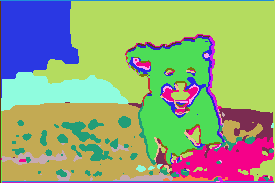

413 / 1000 |  label num : 23  | loss : 0.07799994945526123


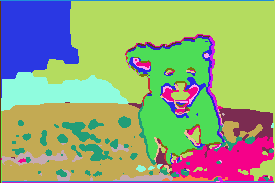

414 / 1000 |  label num : 23  | loss : 0.07766412198543549


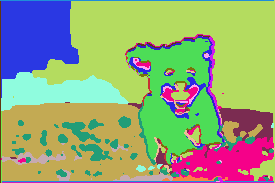

415 / 1000 |  label num : 23  | loss : 0.07757142186164856


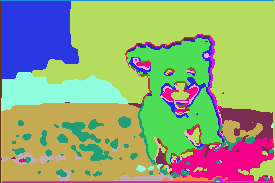

416 / 1000 |  label num : 23  | loss : 0.07761920988559723


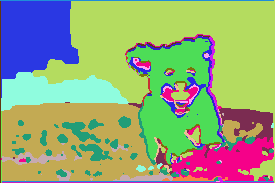

417 / 1000 |  label num : 23  | loss : 0.07720313966274261


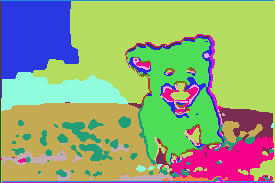

418 / 1000 |  label num : 23  | loss : 0.07780961692333221


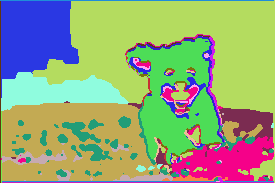

419 / 1000 |  label num : 23  | loss : 0.07727795839309692


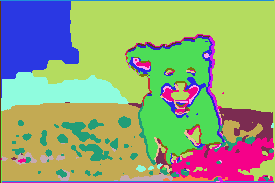

420 / 1000 |  label num : 23  | loss : 0.07817023247480392


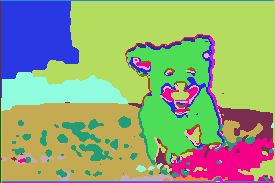

421 / 1000 |  label num : 23  | loss : 0.0778489038348198


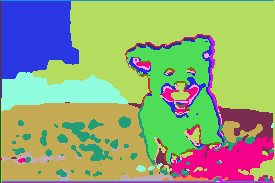

422 / 1000 |  label num : 23  | loss : 0.07709016650915146


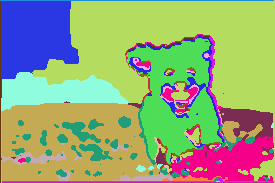

423 / 1000 |  label num : 23  | loss : 0.07739751785993576


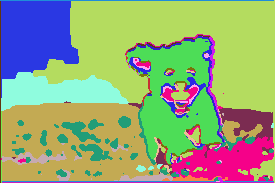

424 / 1000 |  label num : 23  | loss : 0.07743178308010101


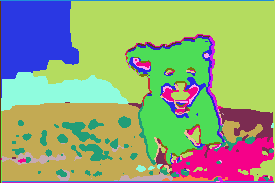

425 / 1000 |  label num : 23  | loss : 0.07666617631912231


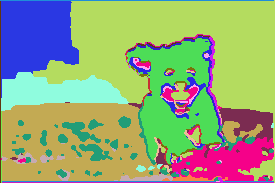

426 / 1000 |  label num : 23  | loss : 0.07722789794206619


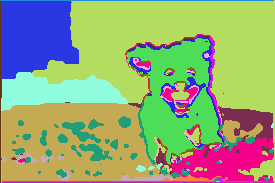

427 / 1000 |  label num : 23  | loss : 0.07709304988384247


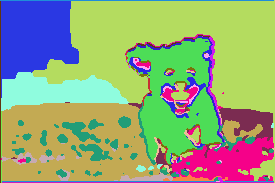

428 / 1000 |  label num : 23  | loss : 0.07649825513362885


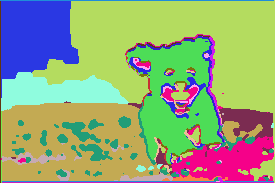

429 / 1000 |  label num : 23  | loss : 0.07675648480653763


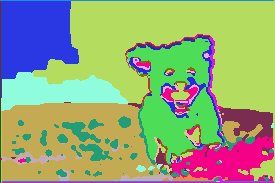

430 / 1000 |  label num : 23  | loss : 0.07660722732543945


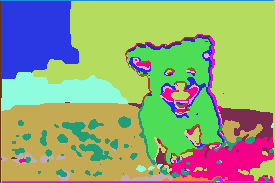

431 / 1000 |  label num : 23  | loss : 0.07621299475431442


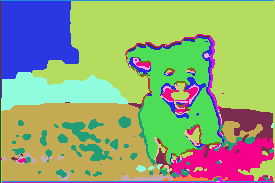

432 / 1000 |  label num : 23  | loss : 0.07659360766410828


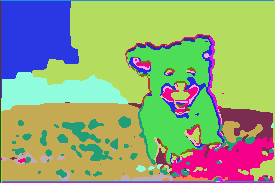

433 / 1000 |  label num : 23  | loss : 0.07599001377820969


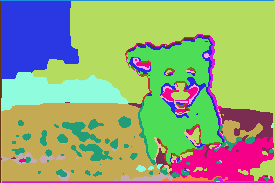

434 / 1000 |  label num : 23  | loss : 0.07607316970825195


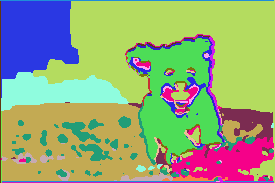

435 / 1000 |  label num : 23  | loss : 0.07596956938505173


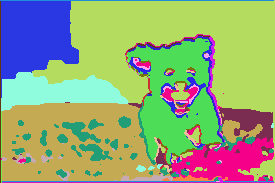

436 / 1000 |  label num : 23  | loss : 0.07643109560012817


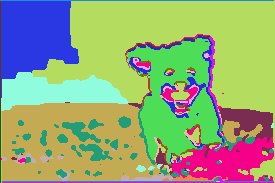

437 / 1000 |  label num : 23  | loss : 0.07565227150917053


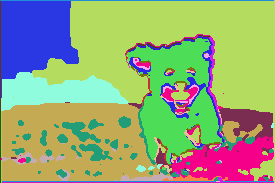

438 / 1000 |  label num : 23  | loss : 0.07611110061407089


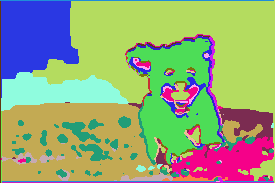

439 / 1000 |  label num : 23  | loss : 0.07577984035015106


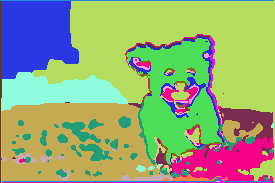

440 / 1000 |  label num : 23  | loss : 0.0753159299492836


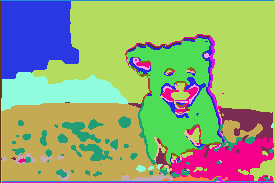

441 / 1000 |  label num : 23  | loss : 0.07547423243522644


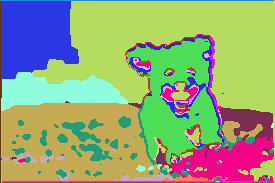

442 / 1000 |  label num : 23  | loss : 0.07556358724832535


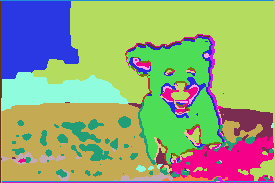

443 / 1000 |  label num : 23  | loss : 0.0754491537809372


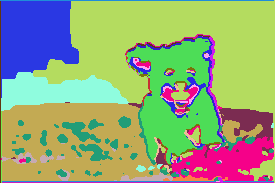

444 / 1000 |  label num : 23  | loss : 0.07541412115097046


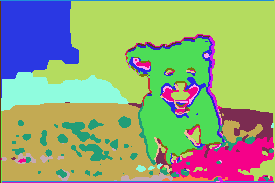

445 / 1000 |  label num : 23  | loss : 0.07493581622838974


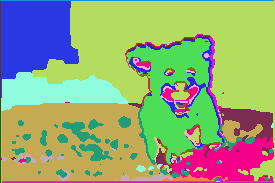

446 / 1000 |  label num : 23  | loss : 0.07490886002779007


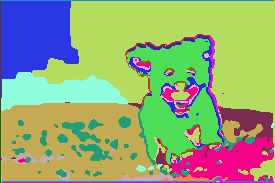

447 / 1000 |  label num : 23  | loss : 0.0749875009059906


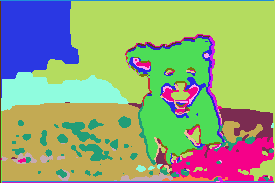

448 / 1000 |  label num : 23  | loss : 0.07478512823581696


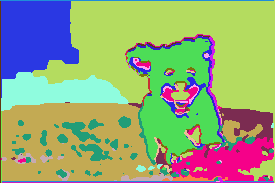

449 / 1000 |  label num : 23  | loss : 0.07486066967248917


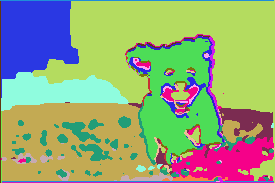

450 / 1000 |  label num : 23  | loss : 0.07450777292251587


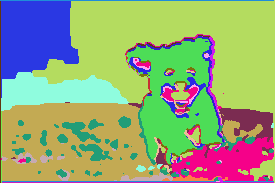

451 / 1000 |  label num : 23  | loss : 0.07455755770206451


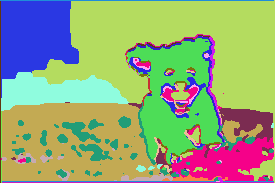

452 / 1000 |  label num : 23  | loss : 0.07446345686912537


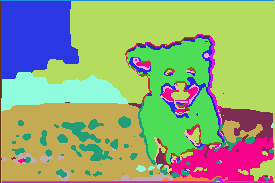

453 / 1000 |  label num : 23  | loss : 0.07424652576446533


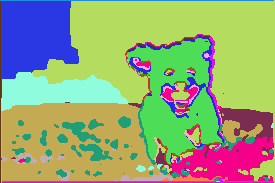

454 / 1000 |  label num : 23  | loss : 0.07425223290920258


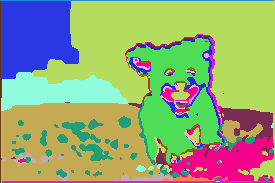

455 / 1000 |  label num : 23  | loss : 0.07409965991973877


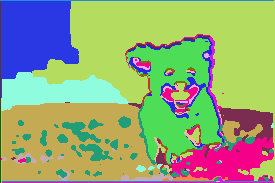

456 / 1000 |  label num : 23  | loss : 0.07408372312784195


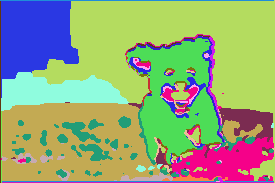

457 / 1000 |  label num : 23  | loss : 0.07402137666940689


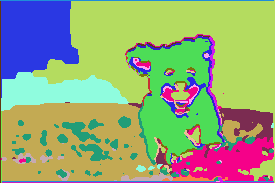

458 / 1000 |  label num : 23  | loss : 0.07387443631887436


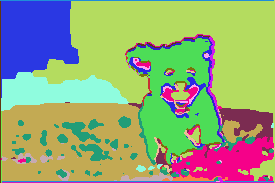

459 / 1000 |  label num : 23  | loss : 0.07391029596328735


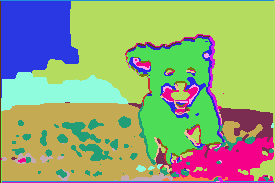

460 / 1000 |  label num : 23  | loss : 0.07380949705839157


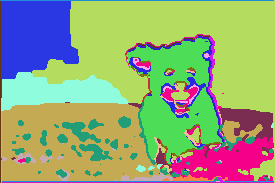

461 / 1000 |  label num : 23  | loss : 0.07366204261779785


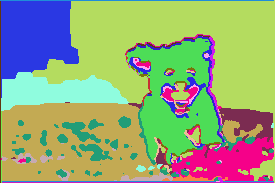

462 / 1000 |  label num : 23  | loss : 0.07368563860654831


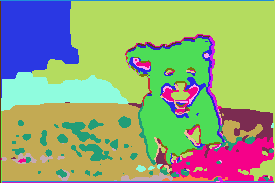

463 / 1000 |  label num : 23  | loss : 0.07345621287822723


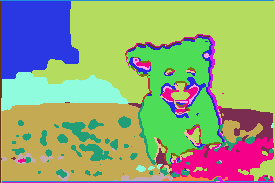

464 / 1000 |  label num : 23  | loss : 0.07379498332738876


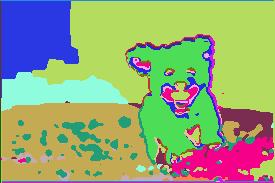

465 / 1000 |  label num : 23  | loss : 0.07396845519542694


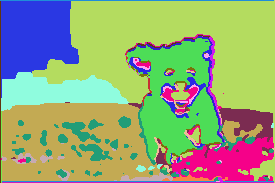

466 / 1000 |  label num : 23  | loss : 0.0733007937669754


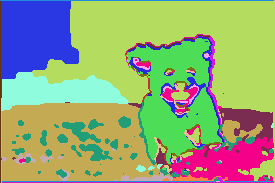

467 / 1000 |  label num : 23  | loss : 0.07386577129364014


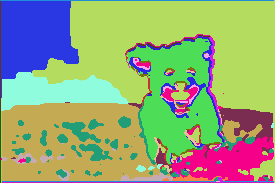

468 / 1000 |  label num : 23  | loss : 0.07363735884428024


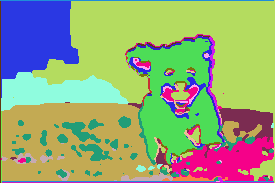

469 / 1000 |  label num : 23  | loss : 0.07353220880031586


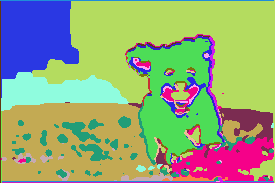

470 / 1000 |  label num : 23  | loss : 0.07341553270816803


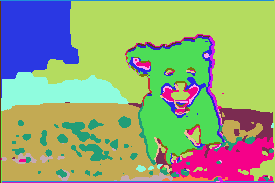

471 / 1000 |  label num : 23  | loss : 0.07343394309282303


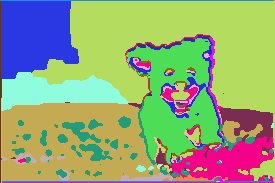

472 / 1000 |  label num : 23  | loss : 0.07339991629123688


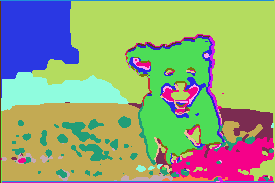

473 / 1000 |  label num : 23  | loss : 0.07372461259365082


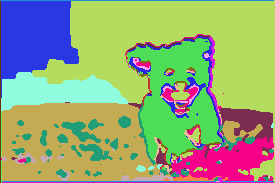

474 / 1000 |  label num : 23  | loss : 0.07330827414989471


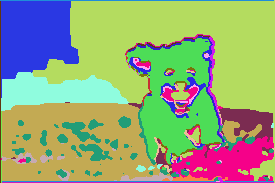

475 / 1000 |  label num : 23  | loss : 0.07344014942646027


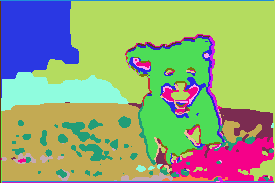

476 / 1000 |  label num : 23  | loss : 0.07304976880550385


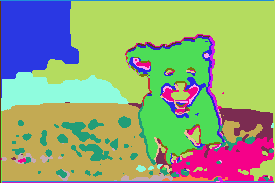

477 / 1000 |  label num : 23  | loss : 0.07324779778718948


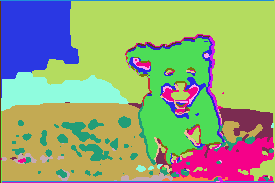

478 / 1000 |  label num : 23  | loss : 0.07316607236862183


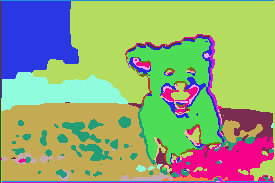

479 / 1000 |  label num : 23  | loss : 0.07278969883918762


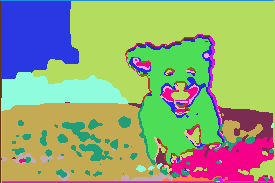

480 / 1000 |  label num : 23  | loss : 0.07281892001628876


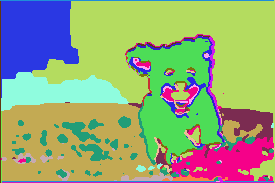

481 / 1000 |  label num : 23  | loss : 0.07261353731155396


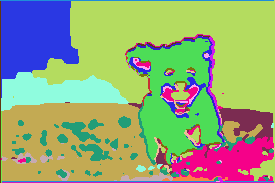

482 / 1000 |  label num : 23  | loss : 0.07283170521259308


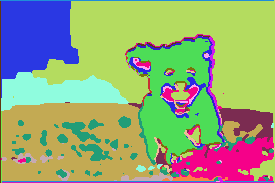

483 / 1000 |  label num : 23  | loss : 0.0724267065525055


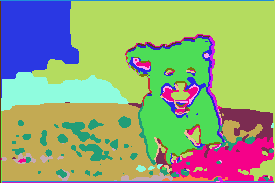

484 / 1000 |  label num : 23  | loss : 0.07255341112613678


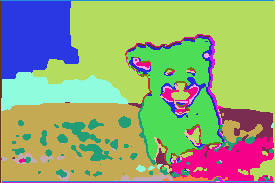

485 / 1000 |  label num : 23  | loss : 0.07279379665851593


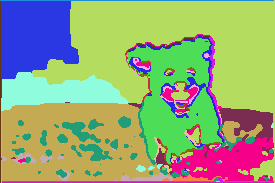

486 / 1000 |  label num : 23  | loss : 0.07226291298866272


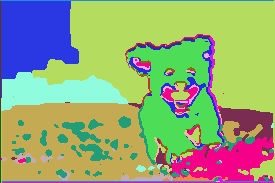

487 / 1000 |  label num : 23  | loss : 0.07236523926258087


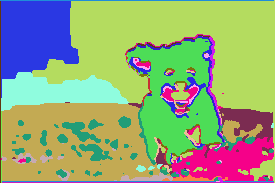

488 / 1000 |  label num : 23  | loss : 0.07212702929973602


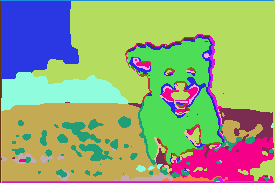

489 / 1000 |  label num : 23  | loss : 0.07247219979763031


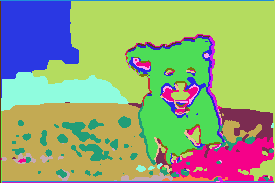

490 / 1000 |  label num : 23  | loss : 0.07228245586156845


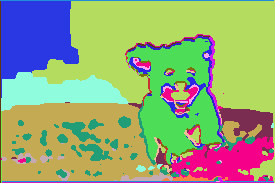

491 / 1000 |  label num : 23  | loss : 0.07216324657201767


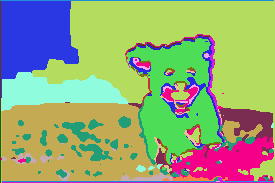

492 / 1000 |  label num : 23  | loss : 0.0719628632068634


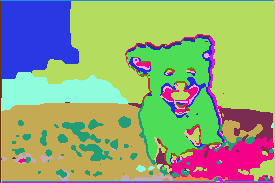

493 / 1000 |  label num : 23  | loss : 0.07217064499855042


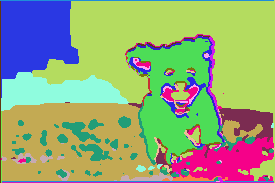

494 / 1000 |  label num : 23  | loss : 0.07192270457744598


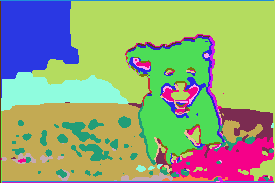

495 / 1000 |  label num : 23  | loss : 0.07174590229988098


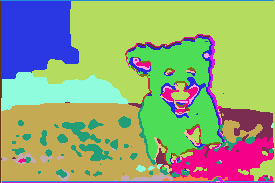

496 / 1000 |  label num : 23  | loss : 0.07164504379034042


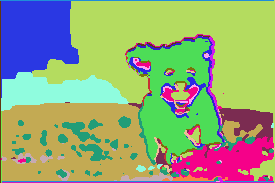

497 / 1000 |  label num : 23  | loss : 0.07180323451757431


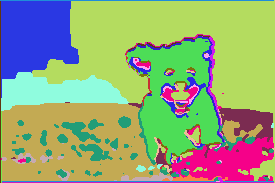

498 / 1000 |  label num : 23  | loss : 0.07171328365802765


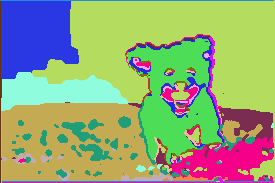

499 / 1000 |  label num : 23  | loss : 0.07159937918186188


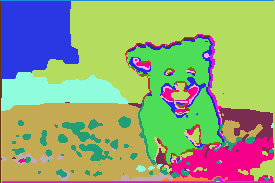

500 / 1000 |  label num : 23  | loss : 0.07155229896306992


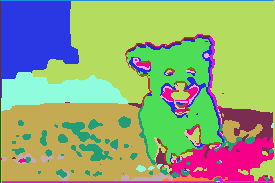

501 / 1000 |  label num : 23  | loss : 0.0715060755610466


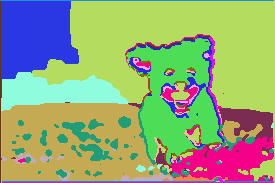

502 / 1000 |  label num : 23  | loss : 0.07148071378469467


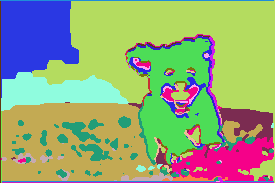

503 / 1000 |  label num : 23  | loss : 0.07153631001710892


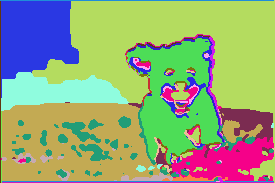

504 / 1000 |  label num : 23  | loss : 0.07128620147705078


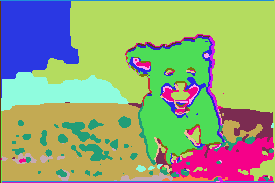

505 / 1000 |  label num : 23  | loss : 0.07178417593240738


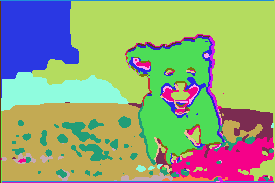

506 / 1000 |  label num : 23  | loss : 0.07148037850856781


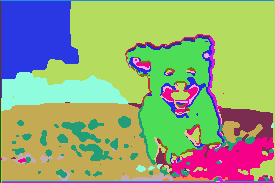

507 / 1000 |  label num : 23  | loss : 0.07162824273109436


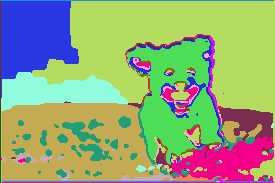

508 / 1000 |  label num : 23  | loss : 0.07134483754634857


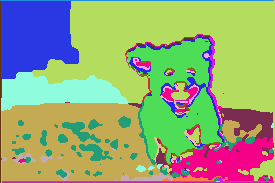

509 / 1000 |  label num : 23  | loss : 0.0717376321554184


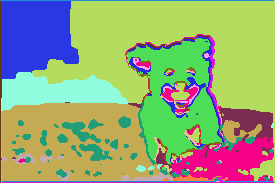

510 / 1000 |  label num : 23  | loss : 0.0709964781999588


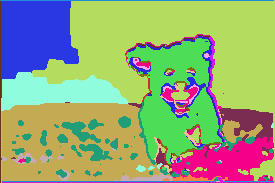

511 / 1000 |  label num : 23  | loss : 0.07119852304458618


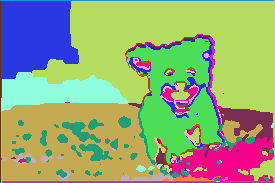

512 / 1000 |  label num : 23  | loss : 0.07088853418827057


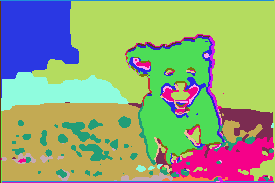

513 / 1000 |  label num : 23  | loss : 0.07085702568292618


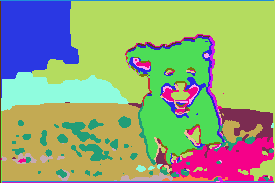

514 / 1000 |  label num : 23  | loss : 0.07092978060245514


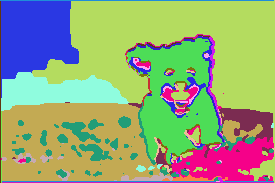

515 / 1000 |  label num : 23  | loss : 0.0709945410490036


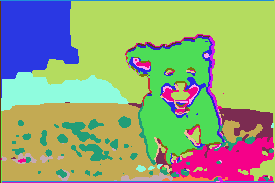

516 / 1000 |  label num : 23  | loss : 0.07065123319625854


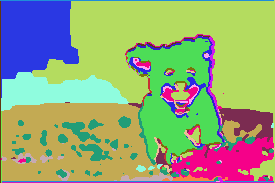

517 / 1000 |  label num : 23  | loss : 0.07064590603113174


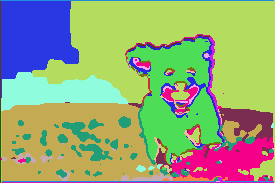

518 / 1000 |  label num : 23  | loss : 0.07070238888263702


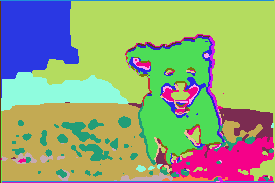

519 / 1000 |  label num : 23  | loss : 0.07087665796279907


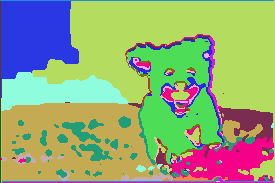

520 / 1000 |  label num : 23  | loss : 0.07052478939294815


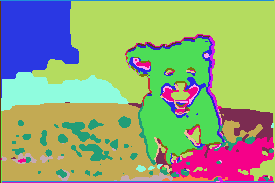

521 / 1000 |  label num : 23  | loss : 0.07039328664541245


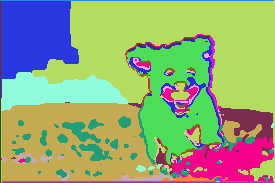

522 / 1000 |  label num : 23  | loss : 0.07042184472084045


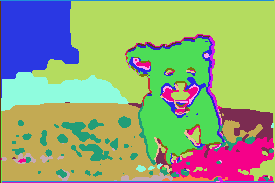

523 / 1000 |  label num : 23  | loss : 0.0706208273768425


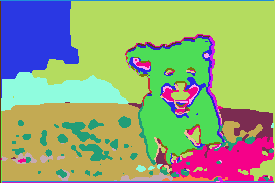

524 / 1000 |  label num : 23  | loss : 0.07077160477638245


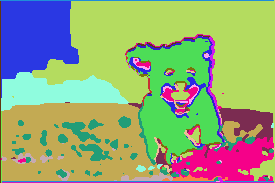

525 / 1000 |  label num : 23  | loss : 0.07046066969633102


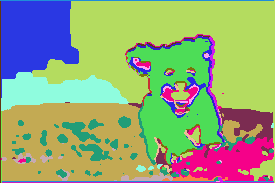

526 / 1000 |  label num : 23  | loss : 0.07056570798158646


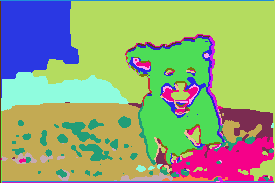

527 / 1000 |  label num : 23  | loss : 0.07078703492879868


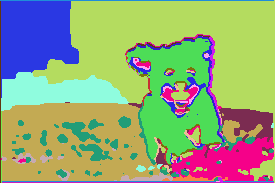

528 / 1000 |  label num : 23  | loss : 0.07045069336891174


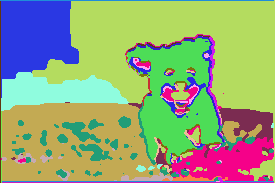

529 / 1000 |  label num : 23  | loss : 0.07056291401386261


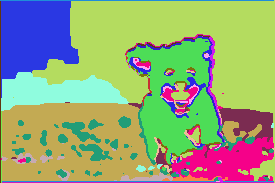

530 / 1000 |  label num : 23  | loss : 0.07060763984918594


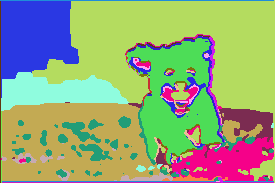

531 / 1000 |  label num : 23  | loss : 0.0707535520195961


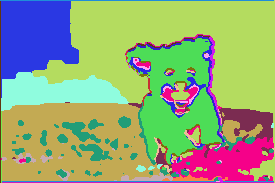

532 / 1000 |  label num : 23  | loss : 0.07071258127689362


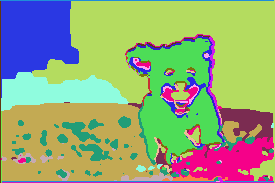

533 / 1000 |  label num : 23  | loss : 0.07055982202291489


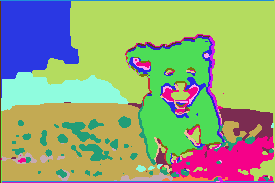

534 / 1000 |  label num : 23  | loss : 0.07090718299150467


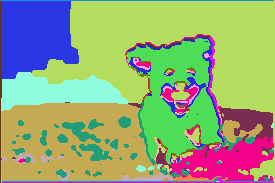

535 / 1000 |  label num : 23  | loss : 0.07014051824808121


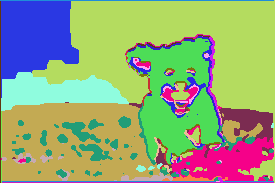

536 / 1000 |  label num : 23  | loss : 0.07048819214105606


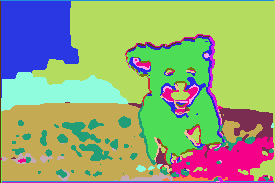

537 / 1000 |  label num : 23  | loss : 0.07002091407775879


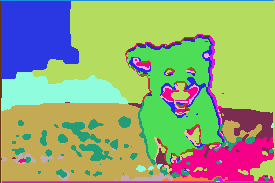

538 / 1000 |  label num : 23  | loss : 0.07029369473457336


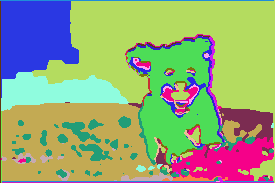

539 / 1000 |  label num : 23  | loss : 0.0699380487203598


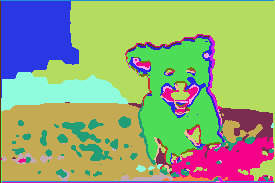

540 / 1000 |  label num : 23  | loss : 0.06987879425287247


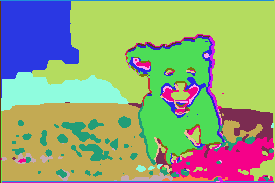

541 / 1000 |  label num : 23  | loss : 0.0702052116394043


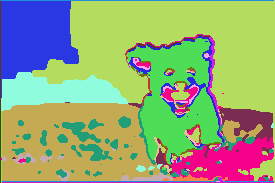

542 / 1000 |  label num : 23  | loss : 0.0694669783115387


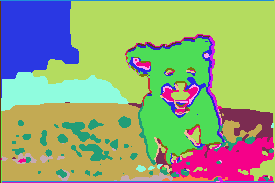

543 / 1000 |  label num : 23  | loss : 0.06974788010120392


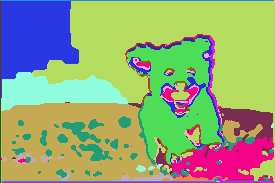

544 / 1000 |  label num : 23  | loss : 0.06971016526222229


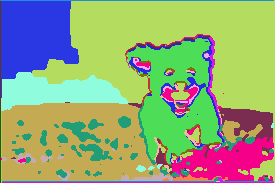

545 / 1000 |  label num : 23  | loss : 0.06980437785387039


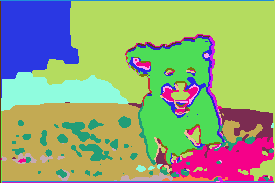

546 / 1000 |  label num : 23  | loss : 0.06943568587303162


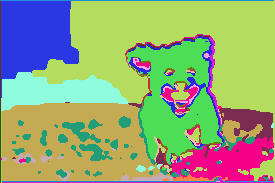

547 / 1000 |  label num : 23  | loss : 0.069788858294487


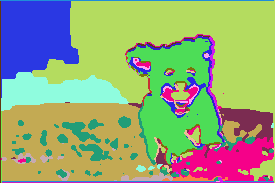

548 / 1000 |  label num : 23  | loss : 0.0693352073431015


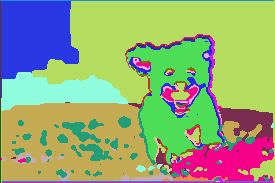

549 / 1000 |  label num : 23  | loss : 0.0693146362900734


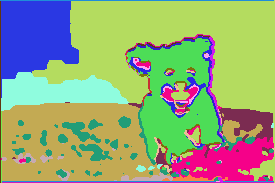

550 / 1000 |  label num : 23  | loss : 0.06942104548215866


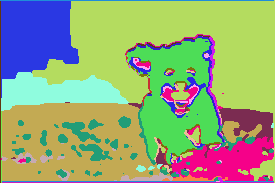

551 / 1000 |  label num : 23  | loss : 0.06934423744678497


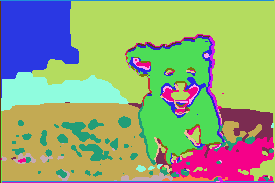

552 / 1000 |  label num : 23  | loss : 0.06938764452934265


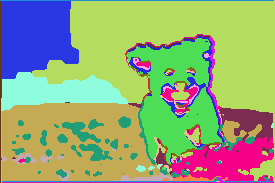

553 / 1000 |  label num : 23  | loss : 0.06914176046848297


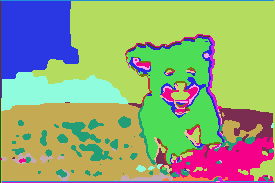

554 / 1000 |  label num : 23  | loss : 0.06919613480567932


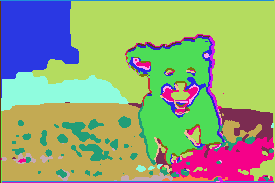

555 / 1000 |  label num : 23  | loss : 0.06942315399646759


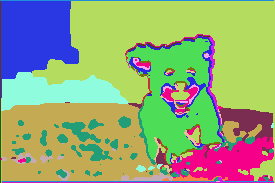

556 / 1000 |  label num : 23  | loss : 0.06932056695222855


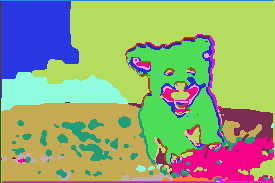

557 / 1000 |  label num : 23  | loss : 0.06896506994962692


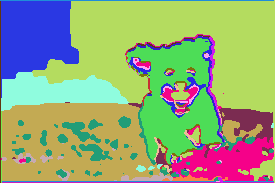

558 / 1000 |  label num : 23  | loss : 0.06929030269384384


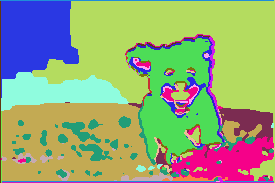

559 / 1000 |  label num : 23  | loss : 0.06954941153526306


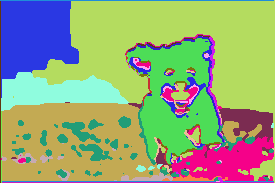

560 / 1000 |  label num : 23  | loss : 0.06926585733890533


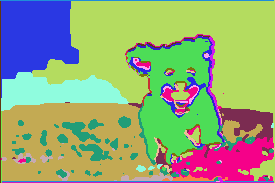

561 / 1000 |  label num : 23  | loss : 0.06969037652015686


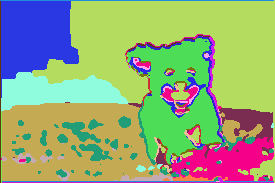

562 / 1000 |  label num : 23  | loss : 0.0694521814584732


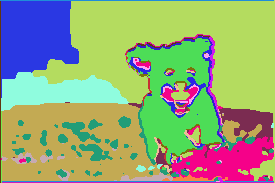

563 / 1000 |  label num : 23  | loss : 0.06972137093544006


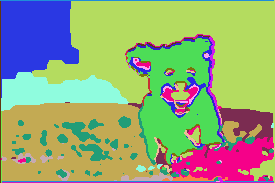

564 / 1000 |  label num : 23  | loss : 0.06913533806800842


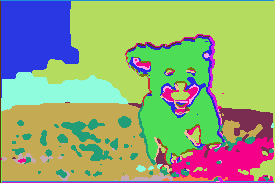

565 / 1000 |  label num : 23  | loss : 0.06969676911830902


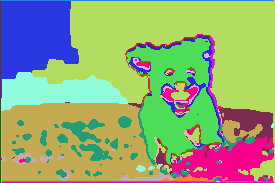

566 / 1000 |  label num : 23  | loss : 0.06958509236574173


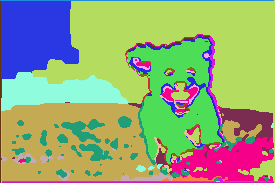

567 / 1000 |  label num : 23  | loss : 0.06919664144515991


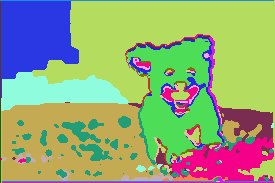

568 / 1000 |  label num : 23  | loss : 0.06975213438272476


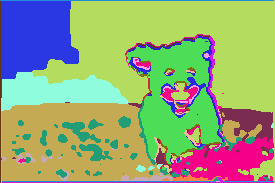

569 / 1000 |  label num : 23  | loss : 0.06957080960273743


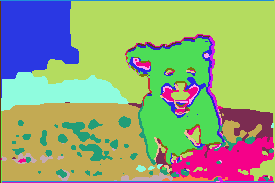

570 / 1000 |  label num : 23  | loss : 0.06901109218597412


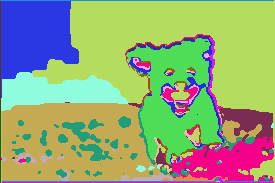

571 / 1000 |  label num : 23  | loss : 0.06898336112499237


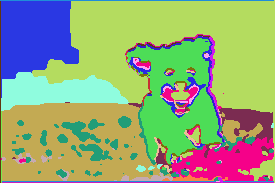

572 / 1000 |  label num : 23  | loss : 0.07011503726243973


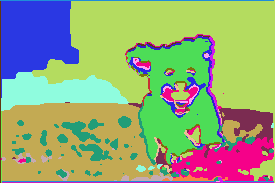

573 / 1000 |  label num : 23  | loss : 0.06954582035541534


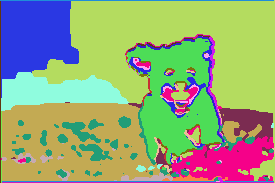

574 / 1000 |  label num : 23  | loss : 0.06888498365879059


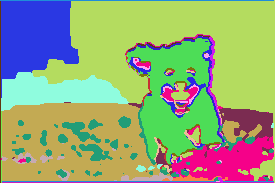

575 / 1000 |  label num : 23  | loss : 0.06951665878295898


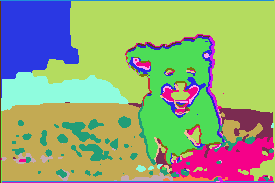

576 / 1000 |  label num : 23  | loss : 0.06960242241621017


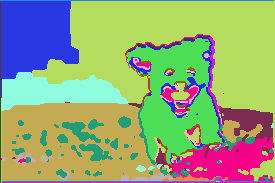

577 / 1000 |  label num : 23  | loss : 0.06956806778907776


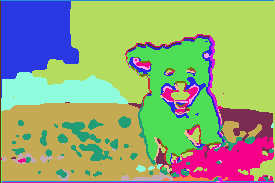

578 / 1000 |  label num : 23  | loss : 0.06935063004493713


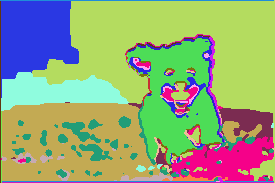

579 / 1000 |  label num : 23  | loss : 0.06917400658130646


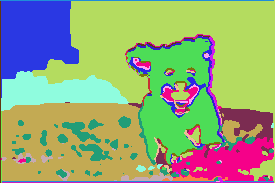

580 / 1000 |  label num : 23  | loss : 0.06894883513450623


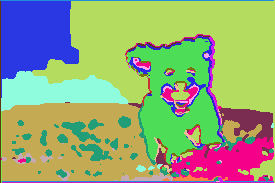

581 / 1000 |  label num : 23  | loss : 0.06941986083984375


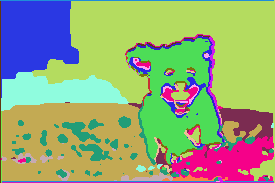

582 / 1000 |  label num : 23  | loss : 0.06931018829345703


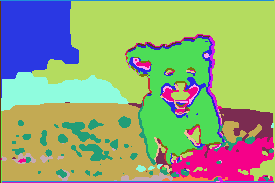

583 / 1000 |  label num : 23  | loss : 0.06891001015901566


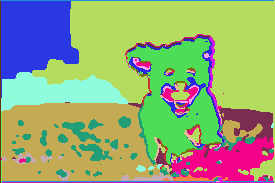

584 / 1000 |  label num : 23  | loss : 0.06998922675848007


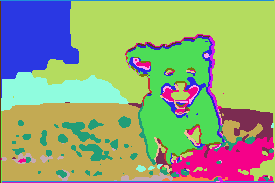

585 / 1000 |  label num : 23  | loss : 0.07001727819442749


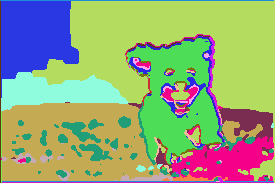

586 / 1000 |  label num : 23  | loss : 0.0703217163681984


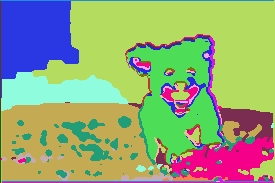

587 / 1000 |  label num : 23  | loss : 0.07001074403524399


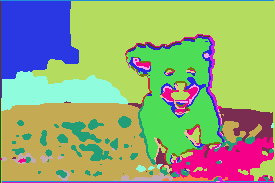

588 / 1000 |  label num : 23  | loss : 0.06967835128307343


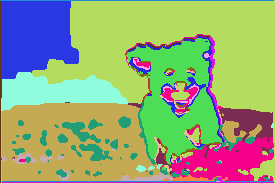

589 / 1000 |  label num : 23  | loss : 0.06913797557353973


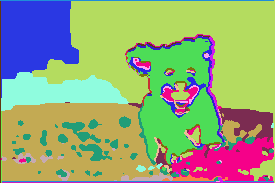

590 / 1000 |  label num : 23  | loss : 0.07017390429973602


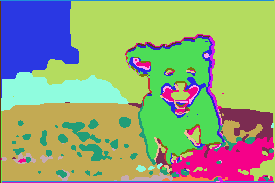

591 / 1000 |  label num : 23  | loss : 0.06970496475696564


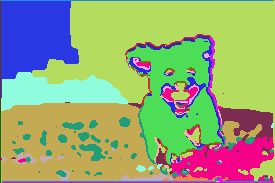

592 / 1000 |  label num : 23  | loss : 0.07273788750171661


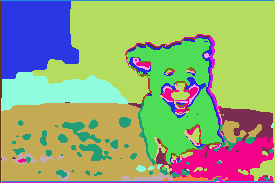

593 / 1000 |  label num : 23  | loss : 0.06949900090694427


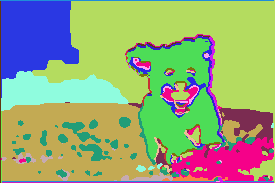

594 / 1000 |  label num : 23  | loss : 0.06974489241838455


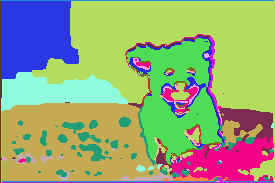

595 / 1000 |  label num : 23  | loss : 0.0709904208779335


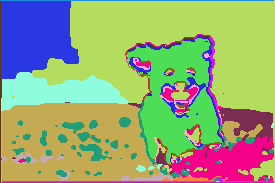

596 / 1000 |  label num : 23  | loss : 0.07016923278570175


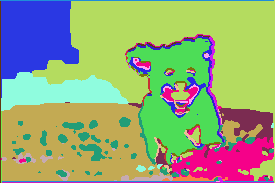

597 / 1000 |  label num : 23  | loss : 0.06990842521190643


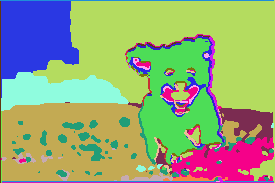

598 / 1000 |  label num : 23  | loss : 0.07051286846399307


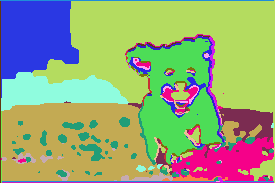

599 / 1000 |  label num : 23  | loss : 0.06931618601083755


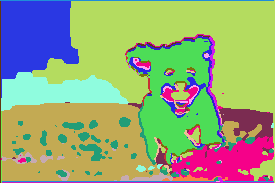

600 / 1000 |  label num : 23  | loss : 0.06975752860307693


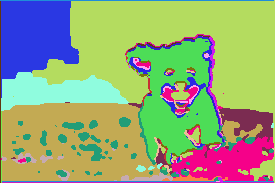

601 / 1000 |  label num : 23  | loss : 0.06916318088769913


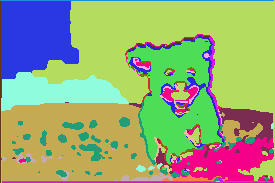

602 / 1000 |  label num : 23  | loss : 0.0691608265042305


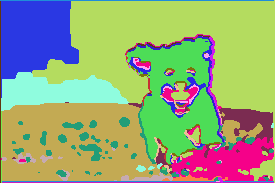

603 / 1000 |  label num : 23  | loss : 0.06864427775144577


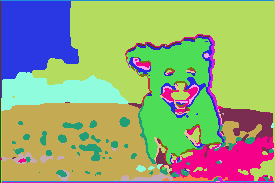

604 / 1000 |  label num : 23  | loss : 0.06964229047298431


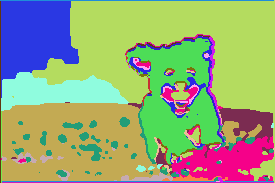

605 / 1000 |  label num : 23  | loss : 0.06868993490934372


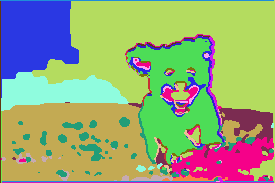

606 / 1000 |  label num : 23  | loss : 0.06870594620704651


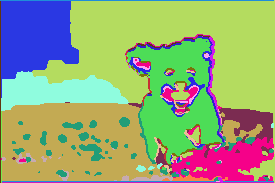

607 / 1000 |  label num : 23  | loss : 0.06898379325866699


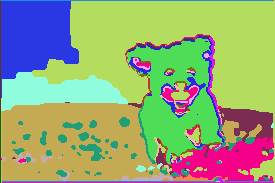

608 / 1000 |  label num : 23  | loss : 0.06806410849094391


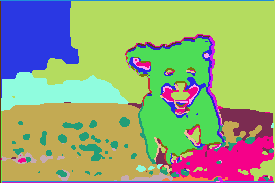

609 / 1000 |  label num : 23  | loss : 0.0687243640422821


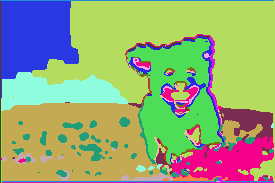

610 / 1000 |  label num : 23  | loss : 0.06770123541355133


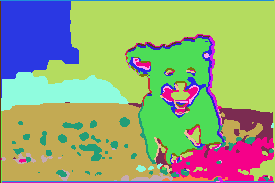

611 / 1000 |  label num : 23  | loss : 0.06825626641511917


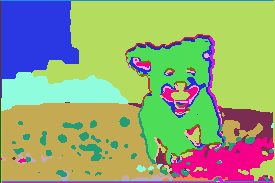

612 / 1000 |  label num : 23  | loss : 0.06815682351589203


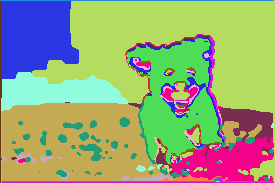

613 / 1000 |  label num : 23  | loss : 0.06785722821950912


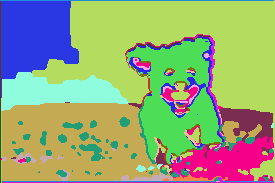

614 / 1000 |  label num : 23  | loss : 0.06724265217781067


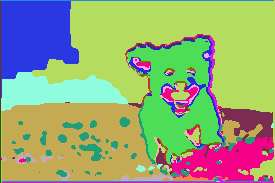

615 / 1000 |  label num : 23  | loss : 0.06743836402893066


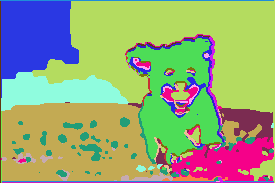

616 / 1000 |  label num : 23  | loss : 0.06730782985687256


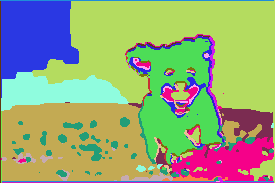

617 / 1000 |  label num : 23  | loss : 0.06698711216449738


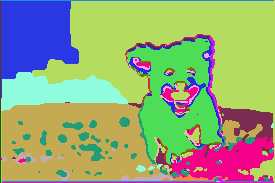

618 / 1000 |  label num : 23  | loss : 0.06698882579803467


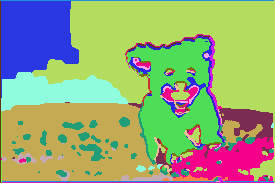

619 / 1000 |  label num : 23  | loss : 0.06744755804538727


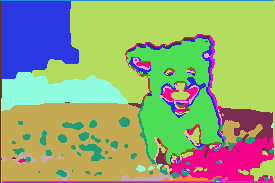

620 / 1000 |  label num : 23  | loss : 0.06683684140443802


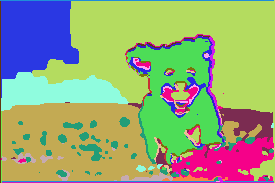

621 / 1000 |  label num : 23  | loss : 0.06672876328229904


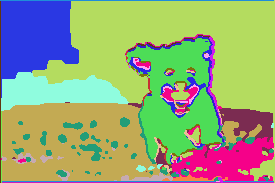

622 / 1000 |  label num : 23  | loss : 0.0668778344988823


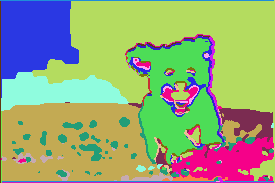

623 / 1000 |  label num : 23  | loss : 0.0665932223200798


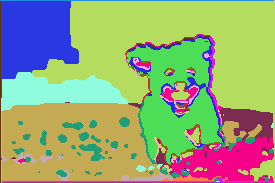

624 / 1000 |  label num : 23  | loss : 0.06660797446966171


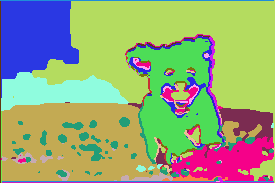

625 / 1000 |  label num : 23  | loss : 0.06683126091957092


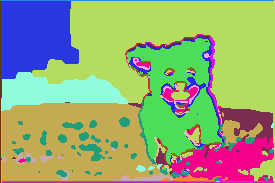

626 / 1000 |  label num : 23  | loss : 0.0665767714381218


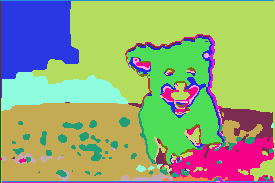

627 / 1000 |  label num : 23  | loss : 0.06665918231010437


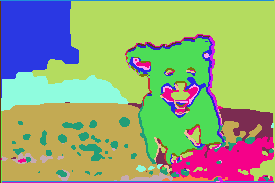

628 / 1000 |  label num : 23  | loss : 0.06700505316257477


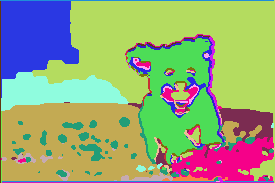

629 / 1000 |  label num : 23  | loss : 0.06682539731264114


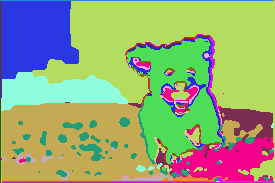

630 / 1000 |  label num : 23  | loss : 0.06710724532604218


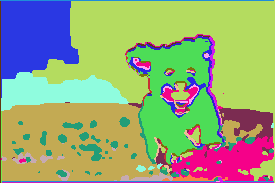

631 / 1000 |  label num : 23  | loss : 0.06685280054807663


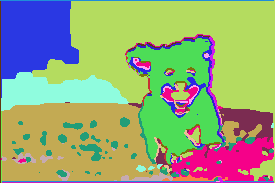

632 / 1000 |  label num : 23  | loss : 0.06644397974014282


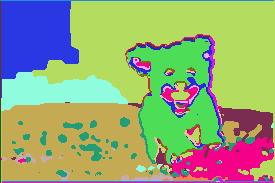

633 / 1000 |  label num : 23  | loss : 0.06678421795368195


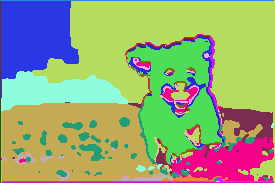

634 / 1000 |  label num : 23  | loss : 0.06666961312294006


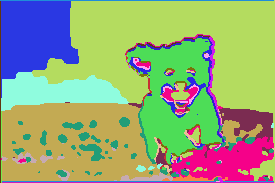

635 / 1000 |  label num : 23  | loss : 0.06684619188308716


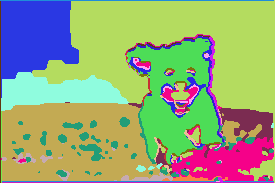

636 / 1000 |  label num : 23  | loss : 0.06616000831127167


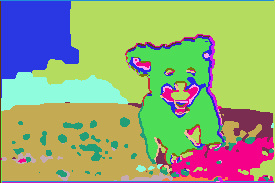

637 / 1000 |  label num : 23  | loss : 0.06619873642921448


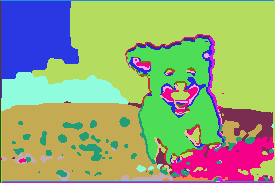

638 / 1000 |  label num : 23  | loss : 0.06617458164691925


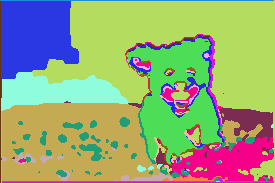

639 / 1000 |  label num : 23  | loss : 0.06610766053199768


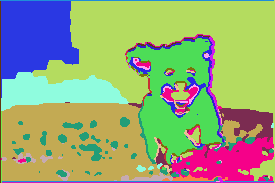

640 / 1000 |  label num : 23  | loss : 0.06603114306926727


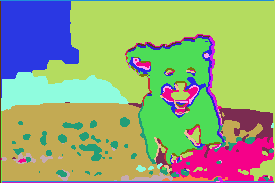

641 / 1000 |  label num : 23  | loss : 0.06571568548679352


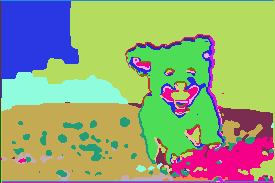

642 / 1000 |  label num : 23  | loss : 0.06613622605800629


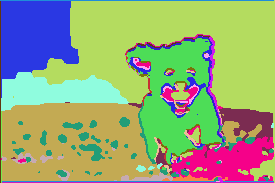

643 / 1000 |  label num : 23  | loss : 0.06621933728456497


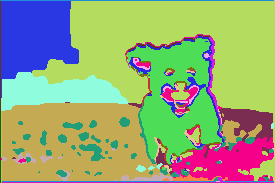

644 / 1000 |  label num : 23  | loss : 0.06570418179035187


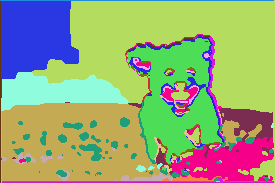

645 / 1000 |  label num : 23  | loss : 0.06638273596763611


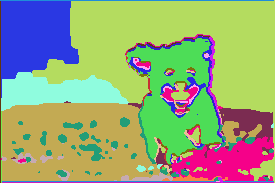

646 / 1000 |  label num : 23  | loss : 0.06641596555709839


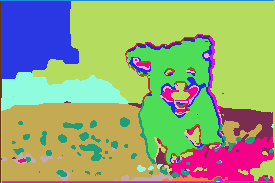

647 / 1000 |  label num : 23  | loss : 0.06667746603488922


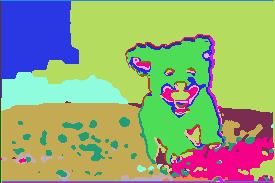

648 / 1000 |  label num : 23  | loss : 0.06630045920610428


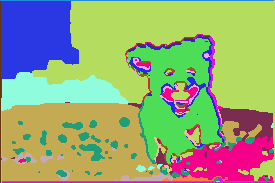

649 / 1000 |  label num : 23  | loss : 0.0665549486875534


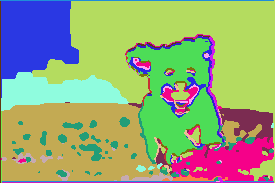

650 / 1000 |  label num : 23  | loss : 0.06574633717536926


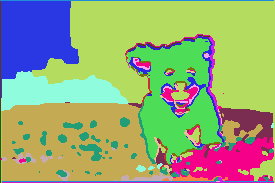

651 / 1000 |  label num : 23  | loss : 0.0665224939584732


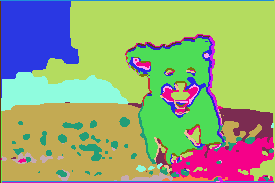

652 / 1000 |  label num : 23  | loss : 0.06581930816173553


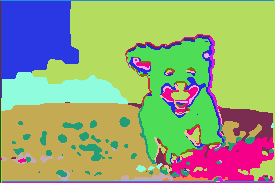

653 / 1000 |  label num : 23  | loss : 0.06592775136232376


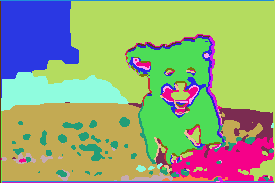

654 / 1000 |  label num : 23  | loss : 0.06598128378391266


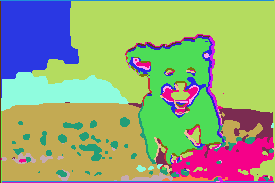

655 / 1000 |  label num : 23  | loss : 0.06540225446224213


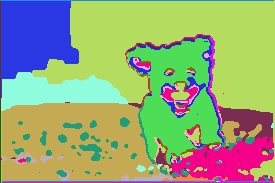

656 / 1000 |  label num : 23  | loss : 0.06580541282892227


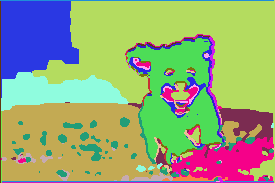

657 / 1000 |  label num : 23  | loss : 0.06626760959625244


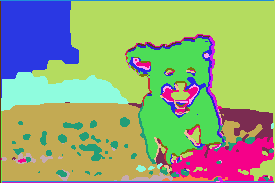

658 / 1000 |  label num : 23  | loss : 0.06538424640893936


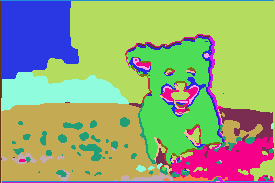

659 / 1000 |  label num : 23  | loss : 0.0665614902973175


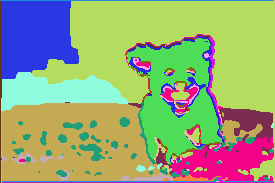

660 / 1000 |  label num : 23  | loss : 0.06572167575359344


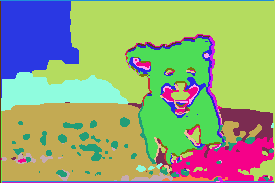

661 / 1000 |  label num : 23  | loss : 0.06637993454933167


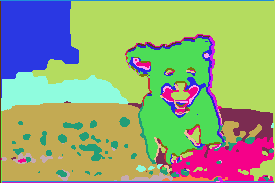

662 / 1000 |  label num : 23  | loss : 0.06571827828884125


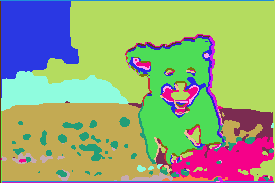

663 / 1000 |  label num : 23  | loss : 0.06555846333503723


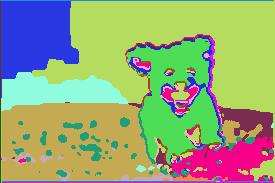

664 / 1000 |  label num : 23  | loss : 0.06519599258899689


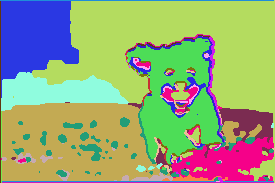

665 / 1000 |  label num : 23  | loss : 0.06571183353662491


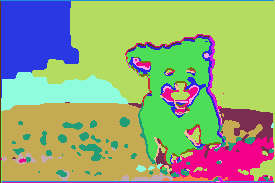

666 / 1000 |  label num : 23  | loss : 0.06499990820884705


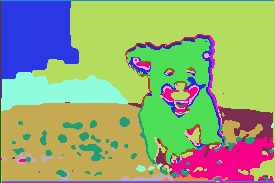

667 / 1000 |  label num : 23  | loss : 0.0652114599943161


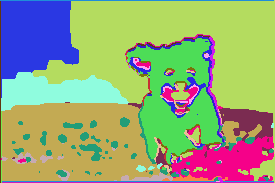

668 / 1000 |  label num : 23  | loss : 0.0653063952922821


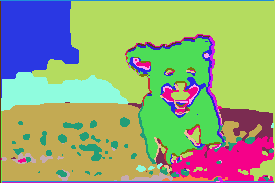

669 / 1000 |  label num : 23  | loss : 0.06549621373414993


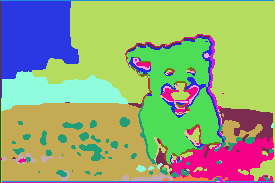

670 / 1000 |  label num : 23  | loss : 0.06532672792673111


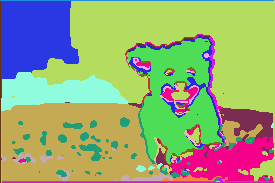

671 / 1000 |  label num : 23  | loss : 0.06654958426952362


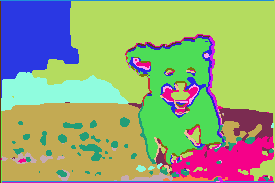

672 / 1000 |  label num : 23  | loss : 0.06659134477376938


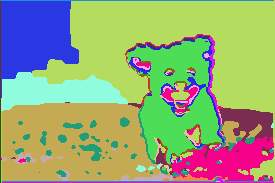

673 / 1000 |  label num : 23  | loss : 0.0677727460861206


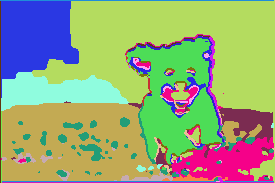

674 / 1000 |  label num : 23  | loss : 0.066862091422081


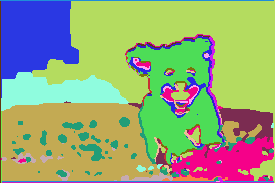

675 / 1000 |  label num : 23  | loss : 0.06678447127342224


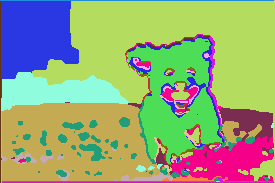

676 / 1000 |  label num : 23  | loss : 0.06665211915969849


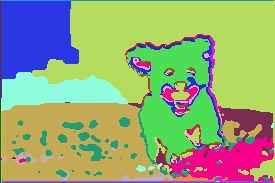

677 / 1000 |  label num : 23  | loss : 0.06592756509780884


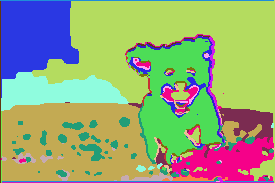

678 / 1000 |  label num : 23  | loss : 0.06640204042196274


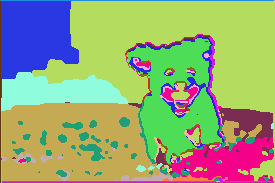

679 / 1000 |  label num : 23  | loss : 0.06548432260751724


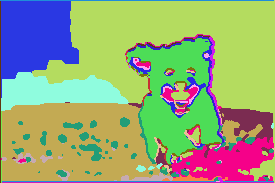

680 / 1000 |  label num : 23  | loss : 0.06566018611192703


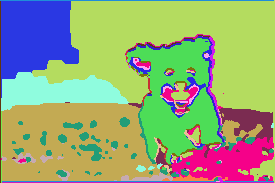

681 / 1000 |  label num : 23  | loss : 0.06519345939159393


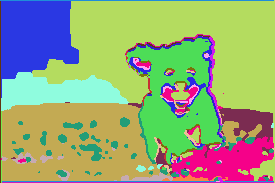

682 / 1000 |  label num : 23  | loss : 0.06542540341615677


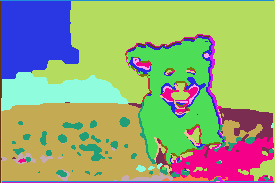

683 / 1000 |  label num : 23  | loss : 0.06573175638914108


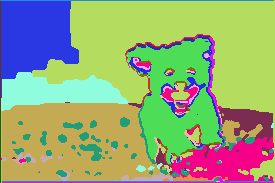

684 / 1000 |  label num : 23  | loss : 0.0652756318449974


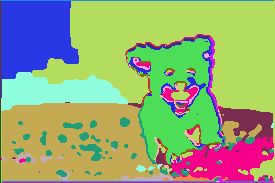

685 / 1000 |  label num : 23  | loss : 0.06529790908098221


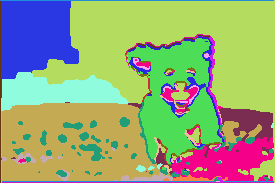

686 / 1000 |  label num : 23  | loss : 0.06480485945940018


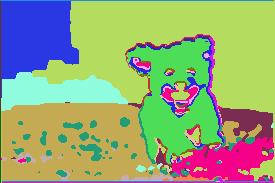

687 / 1000 |  label num : 23  | loss : 0.0650816485285759


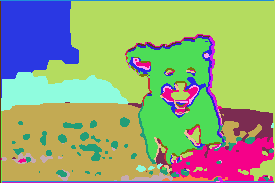

688 / 1000 |  label num : 23  | loss : 0.06466490030288696


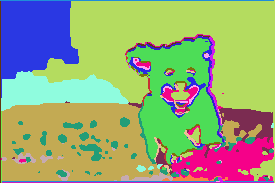

689 / 1000 |  label num : 23  | loss : 0.06515590101480484


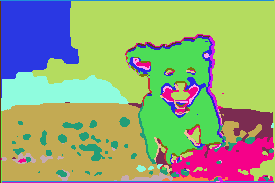

690 / 1000 |  label num : 23  | loss : 0.06481719762086868


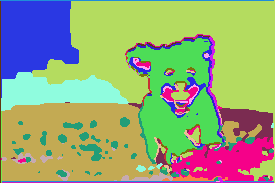

691 / 1000 |  label num : 23  | loss : 0.06474057585000992


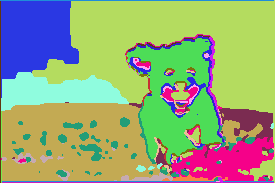

692 / 1000 |  label num : 23  | loss : 0.06434837728738785


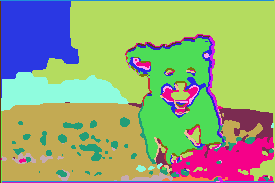

693 / 1000 |  label num : 23  | loss : 0.06436634063720703


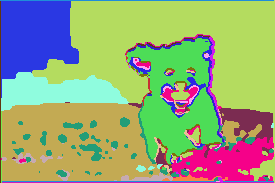

694 / 1000 |  label num : 23  | loss : 0.06396613270044327


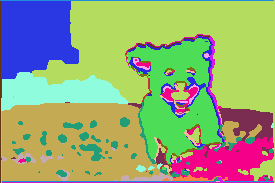

695 / 1000 |  label num : 23  | loss : 0.06409142911434174


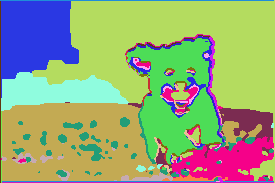

696 / 1000 |  label num : 23  | loss : 0.06397655606269836


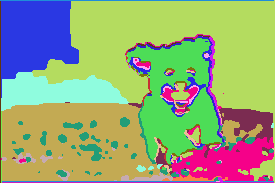

697 / 1000 |  label num : 23  | loss : 0.06412291526794434


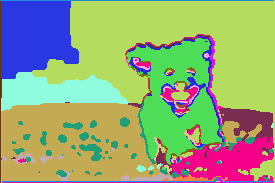

698 / 1000 |  label num : 23  | loss : 0.06376273185014725


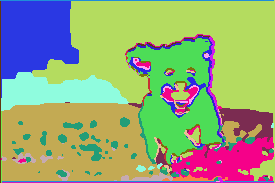

699 / 1000 |  label num : 23  | loss : 0.06349850445985794


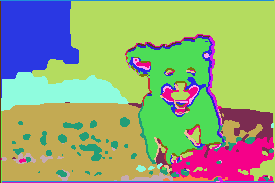

700 / 1000 |  label num : 23  | loss : 0.06348404288291931


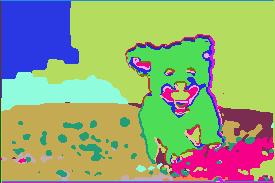

701 / 1000 |  label num : 23  | loss : 0.06337766349315643


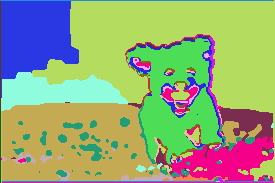

702 / 1000 |  label num : 23  | loss : 0.06352613866329193


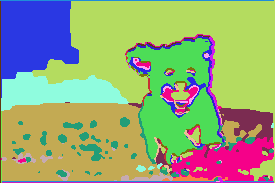

703 / 1000 |  label num : 23  | loss : 0.06347820907831192


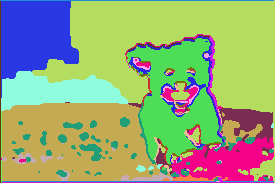

704 / 1000 |  label num : 23  | loss : 0.06392846256494522


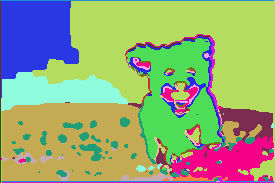

705 / 1000 |  label num : 23  | loss : 0.06396085768938065


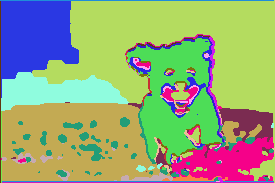

706 / 1000 |  label num : 23  | loss : 0.0634600818157196


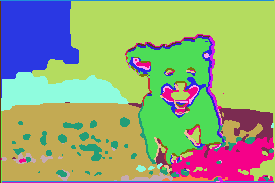

707 / 1000 |  label num : 23  | loss : 0.06353341042995453


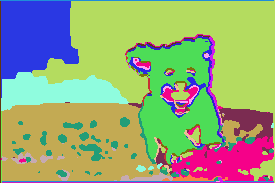

708 / 1000 |  label num : 23  | loss : 0.06407393515110016


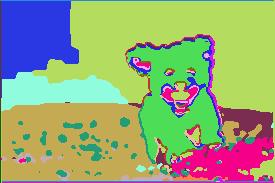

709 / 1000 |  label num : 23  | loss : 0.06327013671398163


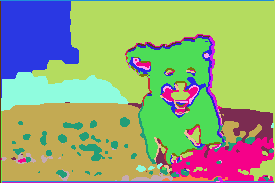

710 / 1000 |  label num : 23  | loss : 0.06424471735954285


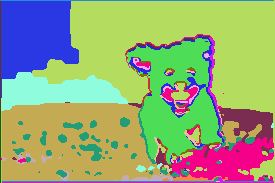

711 / 1000 |  label num : 23  | loss : 0.06379744410514832


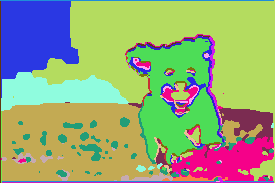

712 / 1000 |  label num : 23  | loss : 0.06420443952083588


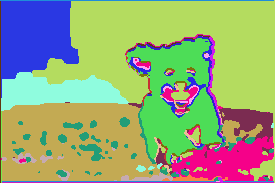

713 / 1000 |  label num : 23  | loss : 0.06478831171989441


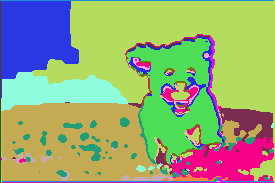

714 / 1000 |  label num : 23  | loss : 0.06547120213508606


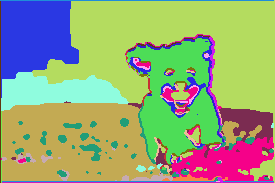

715 / 1000 |  label num : 23  | loss : 0.0661192536354065


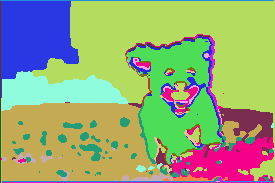

716 / 1000 |  label num : 23  | loss : 0.06581851840019226


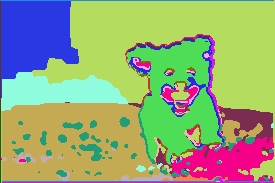

717 / 1000 |  label num : 23  | loss : 0.06429564207792282


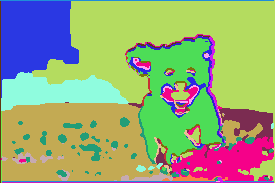

718 / 1000 |  label num : 23  | loss : 0.06927503645420074


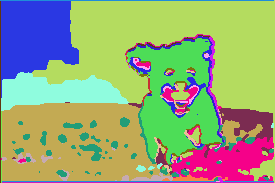

719 / 1000 |  label num : 23  | loss : 0.06648318469524384


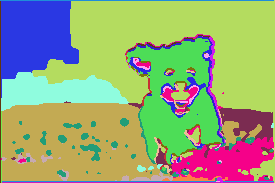

720 / 1000 |  label num : 23  | loss : 0.07088244706392288


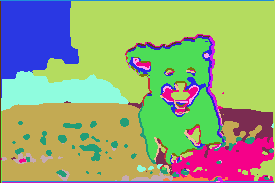

721 / 1000 |  label num : 23  | loss : 0.06845399737358093


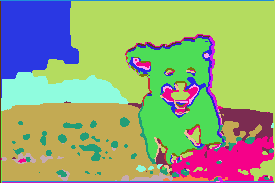

722 / 1000 |  label num : 23  | loss : 0.06705450266599655


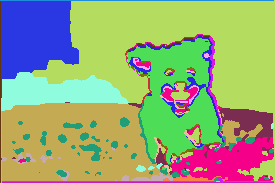

723 / 1000 |  label num : 23  | loss : 0.06778135895729065


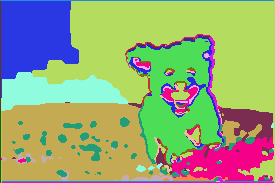

724 / 1000 |  label num : 23  | loss : 0.06680917739868164


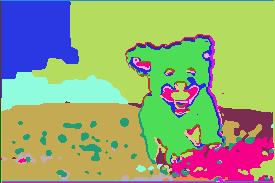

725 / 1000 |  label num : 23  | loss : 0.0662674754858017


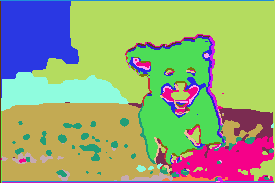

726 / 1000 |  label num : 23  | loss : 0.06679843366146088


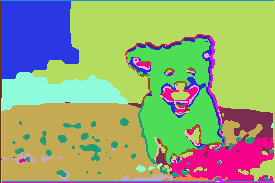

727 / 1000 |  label num : 23  | loss : 0.06564633548259735


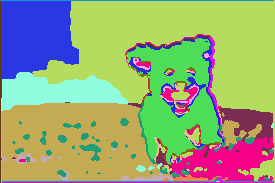

728 / 1000 |  label num : 23  | loss : 0.0658733993768692


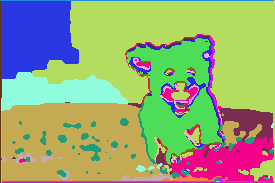

729 / 1000 |  label num : 23  | loss : 0.06459753960371017


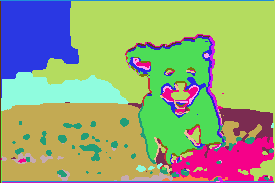

730 / 1000 |  label num : 23  | loss : 0.06461385637521744


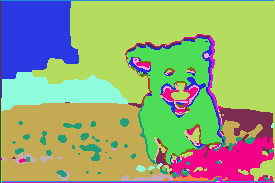

731 / 1000 |  label num : 23  | loss : 0.06488396972417831


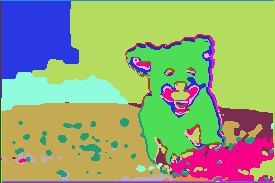

732 / 1000 |  label num : 23  | loss : 0.06439964473247528


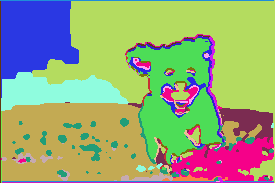

733 / 1000 |  label num : 23  | loss : 0.06438258290290833


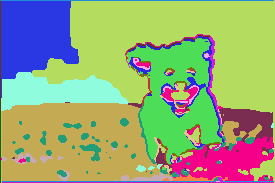

734 / 1000 |  label num : 23  | loss : 0.06406010687351227


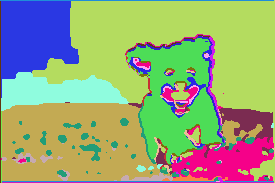

735 / 1000 |  label num : 23  | loss : 0.06382248550653458


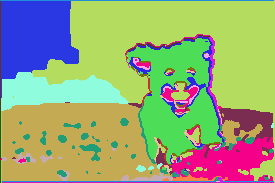

736 / 1000 |  label num : 23  | loss : 0.06385380029678345


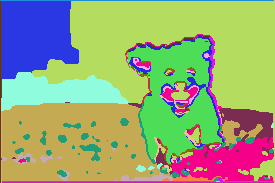

737 / 1000 |  label num : 23  | loss : 0.06325159966945648


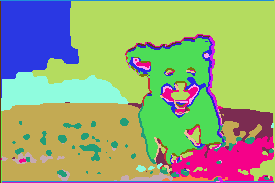

738 / 1000 |  label num : 23  | loss : 0.06377926468849182


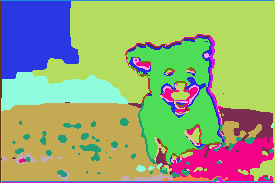

739 / 1000 |  label num : 23  | loss : 0.06334154307842255


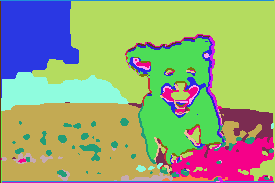

740 / 1000 |  label num : 23  | loss : 0.06325921416282654


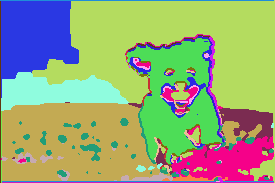

741 / 1000 |  label num : 23  | loss : 0.06348371505737305


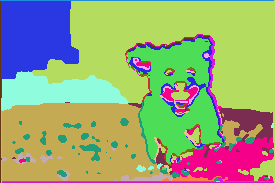

742 / 1000 |  label num : 23  | loss : 0.06288734078407288


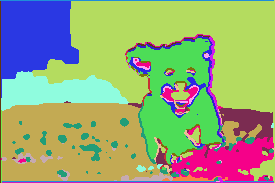

743 / 1000 |  label num : 23  | loss : 0.06290888041257858


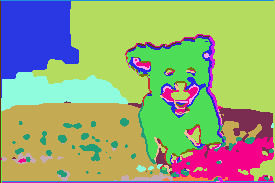

744 / 1000 |  label num : 23  | loss : 0.06261440366506577


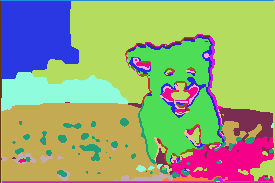

745 / 1000 |  label num : 23  | loss : 0.06253203004598618


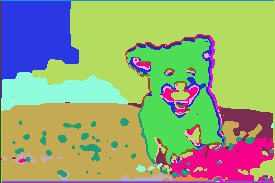

746 / 1000 |  label num : 23  | loss : 0.06251746416091919


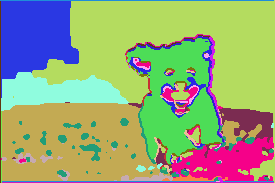

747 / 1000 |  label num : 23  | loss : 0.06250554323196411


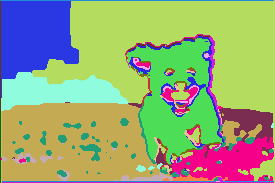

748 / 1000 |  label num : 23  | loss : 0.06241001933813095


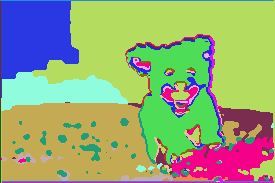

749 / 1000 |  label num : 23  | loss : 0.062229275703430176


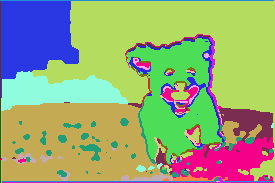

750 / 1000 |  label num : 23  | loss : 0.062497541308403015


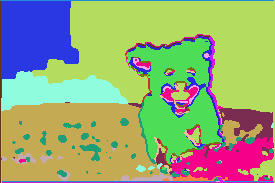

751 / 1000 |  label num : 23  | loss : 0.06235254555940628


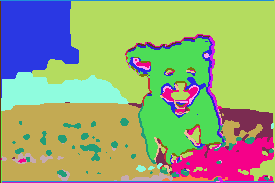

752 / 1000 |  label num : 23  | loss : 0.06247296929359436


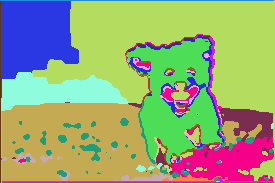

753 / 1000 |  label num : 23  | loss : 0.06207574903964996


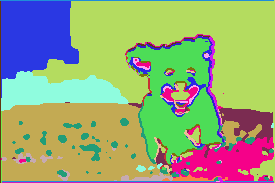

754 / 1000 |  label num : 23  | loss : 0.0626150593161583


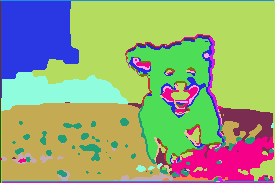

755 / 1000 |  label num : 23  | loss : 0.06201735883951187


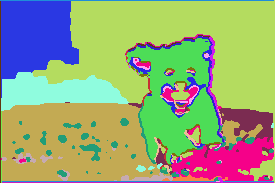

756 / 1000 |  label num : 23  | loss : 0.06221427768468857


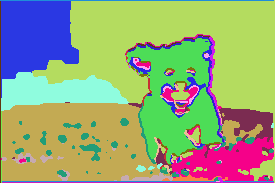

757 / 1000 |  label num : 23  | loss : 0.061868246644735336


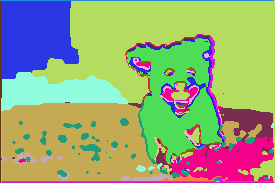

758 / 1000 |  label num : 23  | loss : 0.06207038089632988


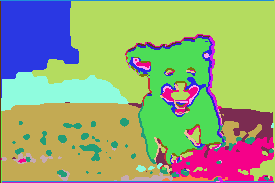

759 / 1000 |  label num : 23  | loss : 0.06226096302270889


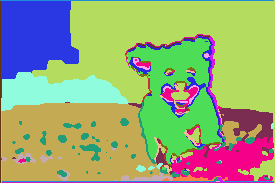

760 / 1000 |  label num : 23  | loss : 0.061936140060424805


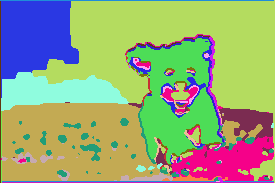

761 / 1000 |  label num : 23  | loss : 0.06256919354200363


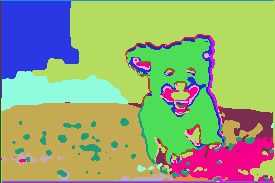

762 / 1000 |  label num : 23  | loss : 0.06256844103336334


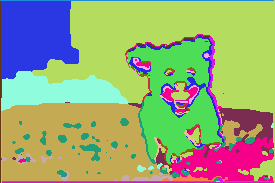

763 / 1000 |  label num : 23  | loss : 0.06252439320087433


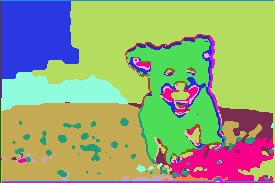

764 / 1000 |  label num : 23  | loss : 0.06360231339931488


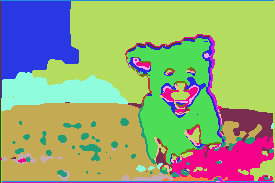

765 / 1000 |  label num : 23  | loss : 0.062333136796951294


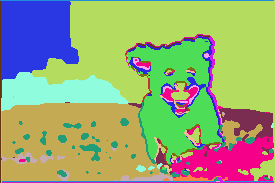

766 / 1000 |  label num : 23  | loss : 0.06316345185041428


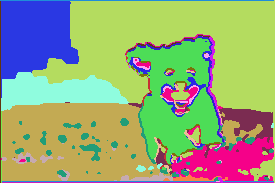

767 / 1000 |  label num : 23  | loss : 0.06278017163276672


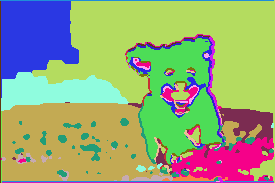

768 / 1000 |  label num : 23  | loss : 0.06224733591079712


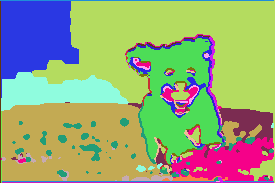

769 / 1000 |  label num : 23  | loss : 0.06302846968173981


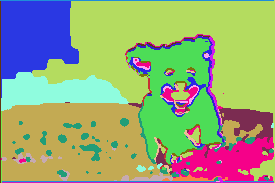

770 / 1000 |  label num : 23  | loss : 0.06222214922308922


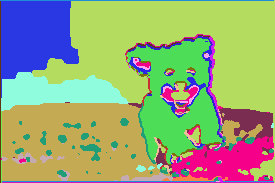

771 / 1000 |  label num : 23  | loss : 0.06260976940393448


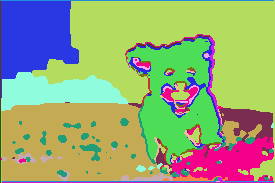

772 / 1000 |  label num : 23  | loss : 0.06195507198572159


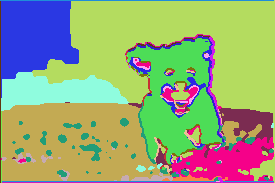

773 / 1000 |  label num : 23  | loss : 0.06194137781858444


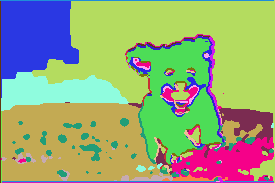

774 / 1000 |  label num : 23  | loss : 0.062353089451789856


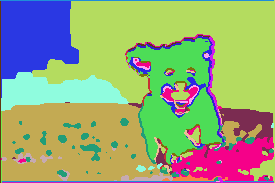

775 / 1000 |  label num : 23  | loss : 0.06135846674442291


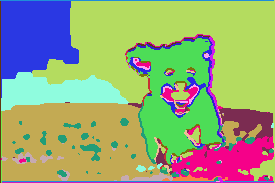

776 / 1000 |  label num : 23  | loss : 0.06197677552700043


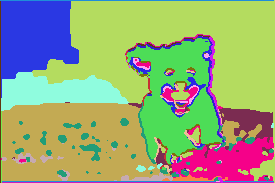

777 / 1000 |  label num : 23  | loss : 0.06149565428495407


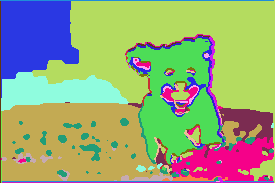

778 / 1000 |  label num : 23  | loss : 0.061501119285821915


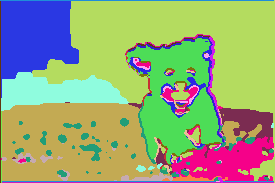

779 / 1000 |  label num : 23  | loss : 0.061245229095220566


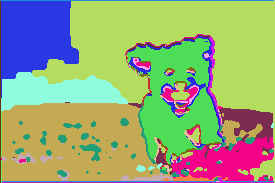

780 / 1000 |  label num : 23  | loss : 0.06124492362141609


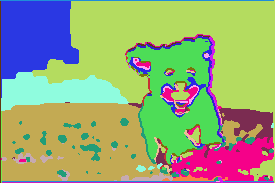

781 / 1000 |  label num : 23  | loss : 0.06160146743059158


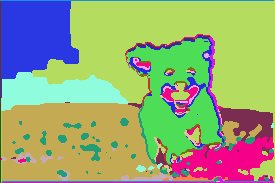

782 / 1000 |  label num : 23  | loss : 0.06136935576796532


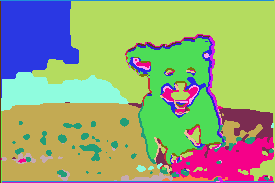

783 / 1000 |  label num : 23  | loss : 0.061408303678035736


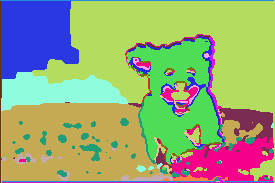

784 / 1000 |  label num : 23  | loss : 0.0616985522210598


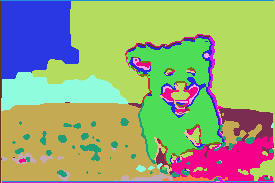

785 / 1000 |  label num : 23  | loss : 0.061508260667324066


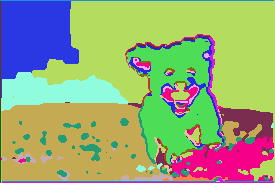

786 / 1000 |  label num : 23  | loss : 0.06159070134162903


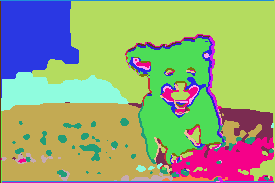

787 / 1000 |  label num : 23  | loss : 0.061220649629831314


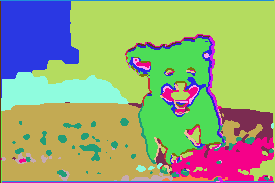

788 / 1000 |  label num : 23  | loss : 0.06193193420767784


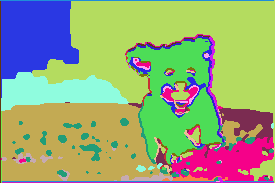

789 / 1000 |  label num : 23  | loss : 0.06089569628238678


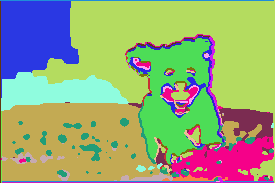

790 / 1000 |  label num : 23  | loss : 0.06193007901310921


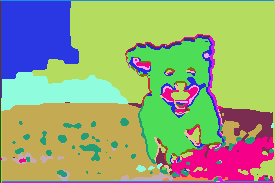

791 / 1000 |  label num : 23  | loss : 0.061367813497781754


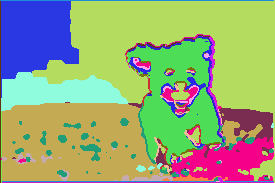

792 / 1000 |  label num : 23  | loss : 0.061402320861816406


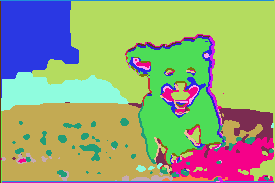

793 / 1000 |  label num : 23  | loss : 0.06181250885128975


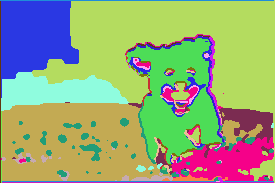

794 / 1000 |  label num : 23  | loss : 0.061250779777765274


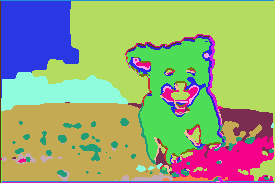

795 / 1000 |  label num : 23  | loss : 0.06132669001817703


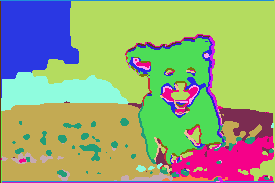

796 / 1000 |  label num : 23  | loss : 0.06143100932240486


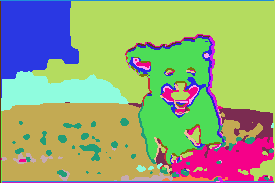

797 / 1000 |  label num : 23  | loss : 0.061468880623579025


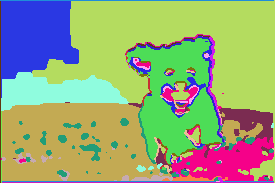

798 / 1000 |  label num : 23  | loss : 0.06129760295152664


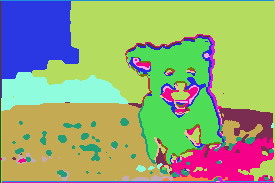

799 / 1000 |  label num : 23  | loss : 0.061633430421352386


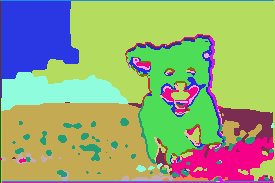

800 / 1000 |  label num : 23  | loss : 0.061123382300138474


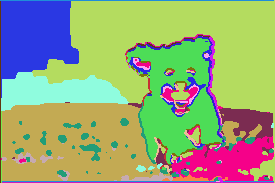

801 / 1000 |  label num : 23  | loss : 0.06118553876876831


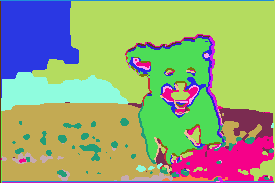

802 / 1000 |  label num : 23  | loss : 0.061087992042303085


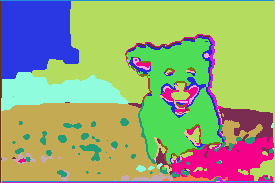

803 / 1000 |  label num : 23  | loss : 0.06085864081978798


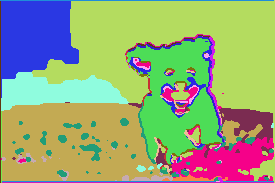

804 / 1000 |  label num : 23  | loss : 0.061310574412345886


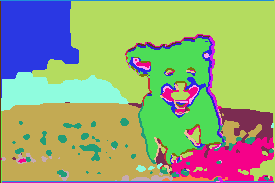

805 / 1000 |  label num : 23  | loss : 0.06083262711763382


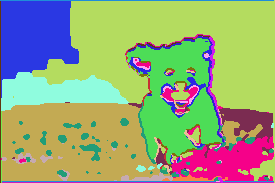

806 / 1000 |  label num : 23  | loss : 0.06064411997795105


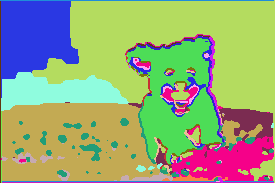

807 / 1000 |  label num : 23  | loss : 0.061549216508865356


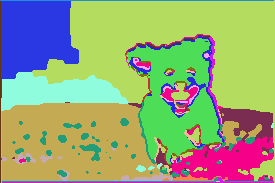

808 / 1000 |  label num : 23  | loss : 0.060444191098213196


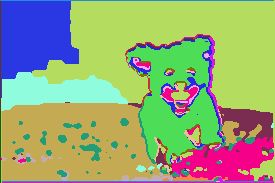

809 / 1000 |  label num : 23  | loss : 0.061077602207660675


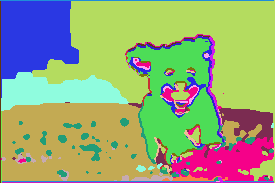

810 / 1000 |  label num : 23  | loss : 0.0607466958463192


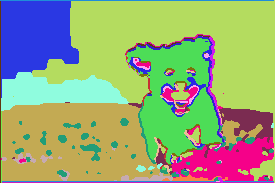

811 / 1000 |  label num : 23  | loss : 0.06075189635157585


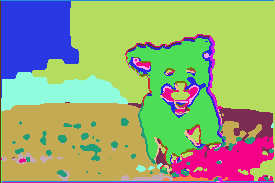

812 / 1000 |  label num : 23  | loss : 0.06064184010028839


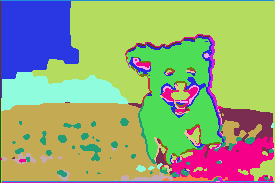

813 / 1000 |  label num : 23  | loss : 0.06068595498800278


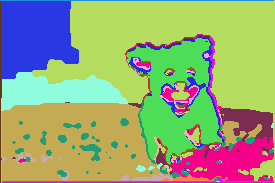

814 / 1000 |  label num : 23  | loss : 0.060305263847112656


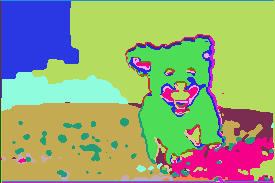

815 / 1000 |  label num : 23  | loss : 0.06066201627254486


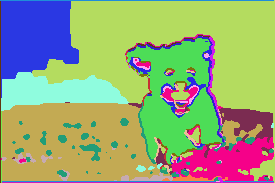

816 / 1000 |  label num : 23  | loss : 0.06007660925388336


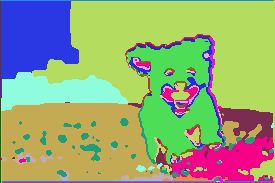

817 / 1000 |  label num : 23  | loss : 0.06065051257610321


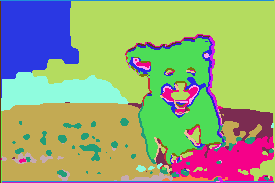

818 / 1000 |  label num : 23  | loss : 0.060277584940195084


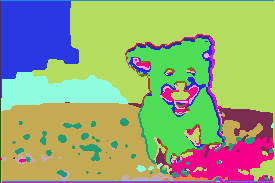

819 / 1000 |  label num : 23  | loss : 0.06069121137261391


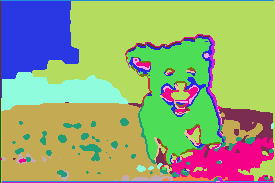

820 / 1000 |  label num : 23  | loss : 0.06124088168144226


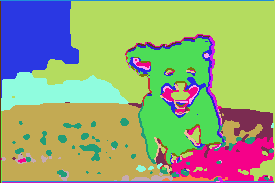

821 / 1000 |  label num : 23  | loss : 0.060846179723739624


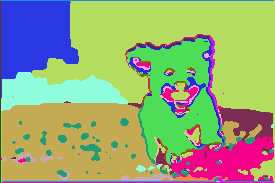

822 / 1000 |  label num : 23  | loss : 0.06108063459396362


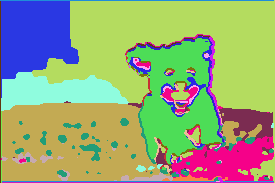

823 / 1000 |  label num : 23  | loss : 0.060917772352695465


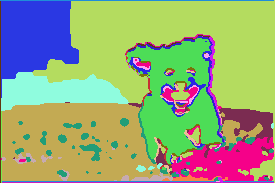

824 / 1000 |  label num : 23  | loss : 0.06130017340183258


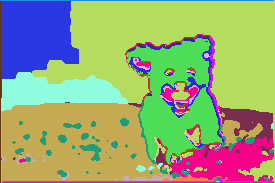

825 / 1000 |  label num : 23  | loss : 0.06129985675215721


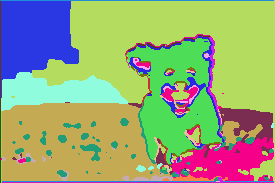

826 / 1000 |  label num : 23  | loss : 0.0622808113694191


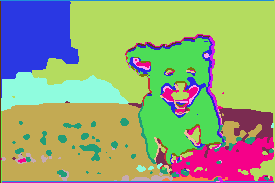

827 / 1000 |  label num : 23  | loss : 0.061809636652469635


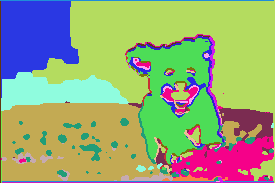

828 / 1000 |  label num : 23  | loss : 0.06050124019384384


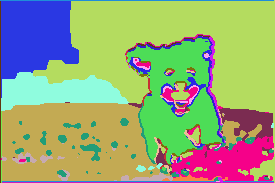

829 / 1000 |  label num : 23  | loss : 0.06302116066217422


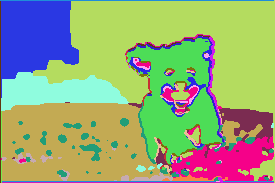

830 / 1000 |  label num : 23  | loss : 0.06160139665007591


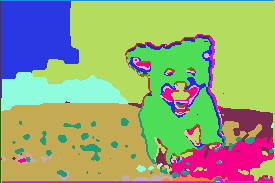

831 / 1000 |  label num : 23  | loss : 0.062011294066905975


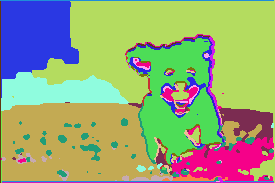

832 / 1000 |  label num : 23  | loss : 0.06280890107154846


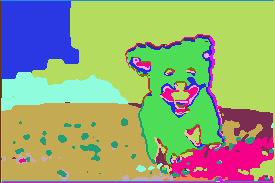

833 / 1000 |  label num : 23  | loss : 0.06160549819469452


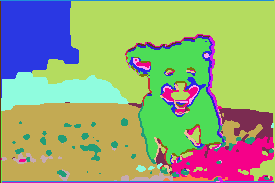

834 / 1000 |  label num : 23  | loss : 0.06178024411201477


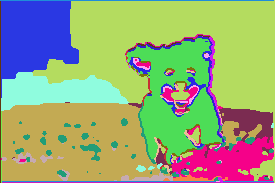

835 / 1000 |  label num : 23  | loss : 0.06194338947534561


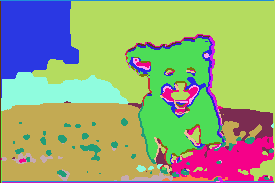

836 / 1000 |  label num : 23  | loss : 0.06107824295759201


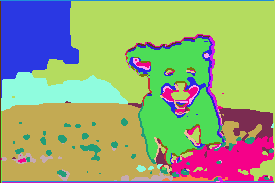

837 / 1000 |  label num : 23  | loss : 0.061565324664115906


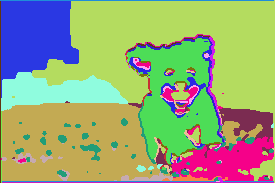

838 / 1000 |  label num : 23  | loss : 0.06147514283657074


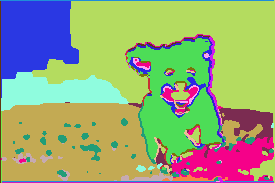

839 / 1000 |  label num : 23  | loss : 0.06080221012234688


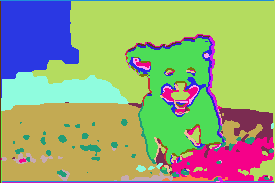

840 / 1000 |  label num : 23  | loss : 0.06126919761300087


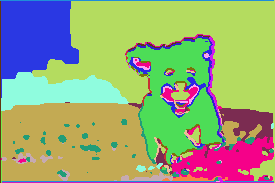

841 / 1000 |  label num : 23  | loss : 0.061061106622219086


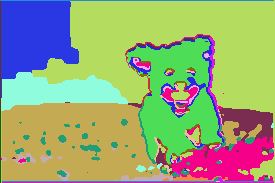

842 / 1000 |  label num : 23  | loss : 0.06079549342393875


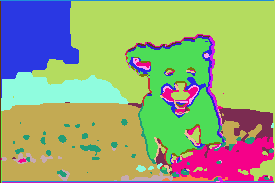

843 / 1000 |  label num : 23  | loss : 0.060660406947135925


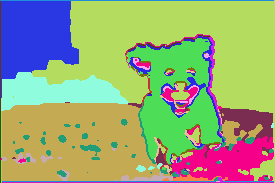

844 / 1000 |  label num : 23  | loss : 0.060861654579639435


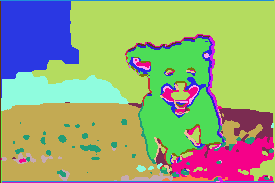

845 / 1000 |  label num : 23  | loss : 0.060289166867733


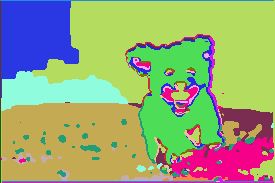

846 / 1000 |  label num : 23  | loss : 0.06068853288888931


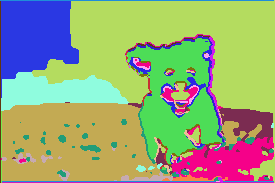

847 / 1000 |  label num : 23  | loss : 0.060102254152297974


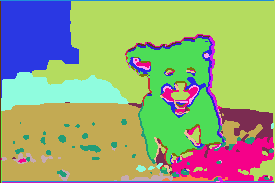

848 / 1000 |  label num : 23  | loss : 0.060725606977939606


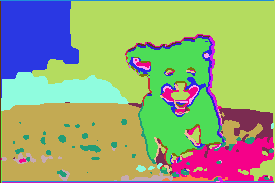

849 / 1000 |  label num : 23  | loss : 0.06009066849946976


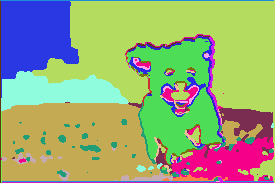

850 / 1000 |  label num : 23  | loss : 0.06037381291389465


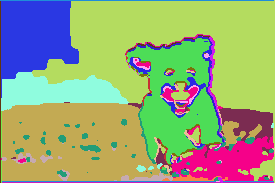

851 / 1000 |  label num : 23  | loss : 0.06039997190237045


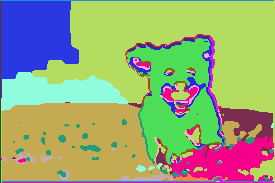

852 / 1000 |  label num : 23  | loss : 0.06076953560113907


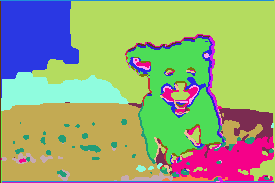

853 / 1000 |  label num : 23  | loss : 0.0602790005505085


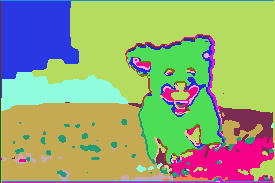

854 / 1000 |  label num : 23  | loss : 0.060186389833688736


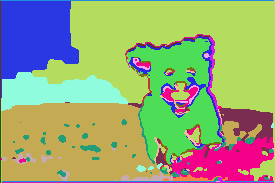

855 / 1000 |  label num : 23  | loss : 0.06029196083545685


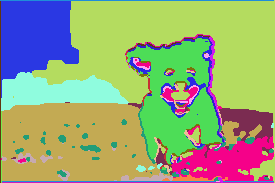

856 / 1000 |  label num : 23  | loss : 0.060366351157426834


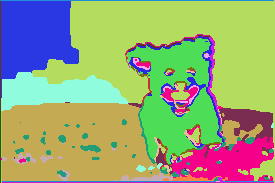

857 / 1000 |  label num : 23  | loss : 0.060101646929979324


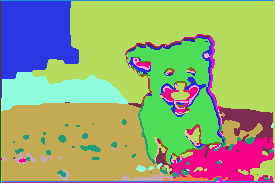

858 / 1000 |  label num : 23  | loss : 0.060032159090042114


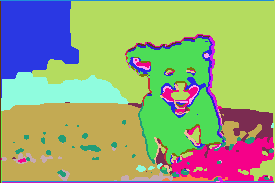

859 / 1000 |  label num : 23  | loss : 0.05988795682787895


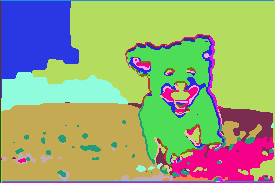

860 / 1000 |  label num : 23  | loss : 0.059734102338552475


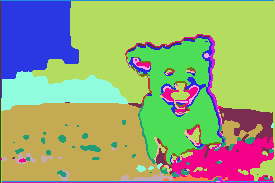

861 / 1000 |  label num : 23  | loss : 0.06000896915793419


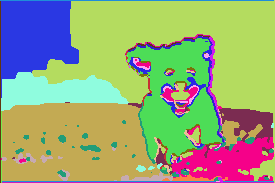

862 / 1000 |  label num : 23  | loss : 0.059291791170835495


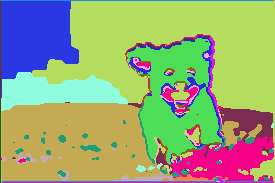

863 / 1000 |  label num : 23  | loss : 0.059344079345464706


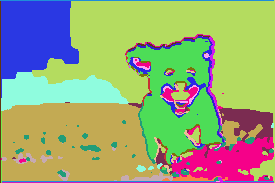

864 / 1000 |  label num : 23  | loss : 0.05945315584540367


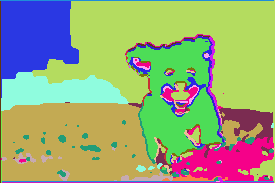

865 / 1000 |  label num : 23  | loss : 0.05949500948190689


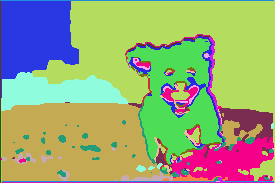

866 / 1000 |  label num : 23  | loss : 0.05953047797083855


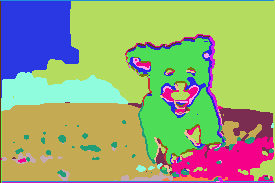

867 / 1000 |  label num : 23  | loss : 0.05950953811407089


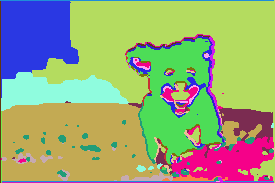

868 / 1000 |  label num : 23  | loss : 0.059651561081409454


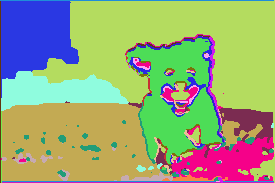

869 / 1000 |  label num : 23  | loss : 0.05978386104106903


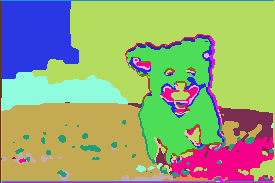

870 / 1000 |  label num : 23  | loss : 0.059013232588768005


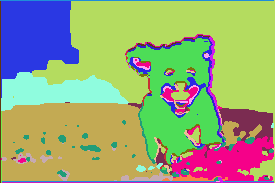

871 / 1000 |  label num : 23  | loss : 0.06001468002796173


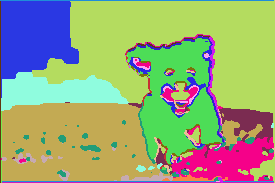

872 / 1000 |  label num : 23  | loss : 0.05872225761413574


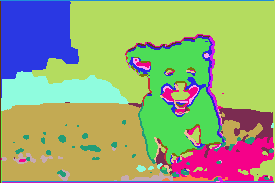

873 / 1000 |  label num : 23  | loss : 0.059572622179985046


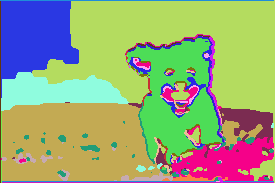

874 / 1000 |  label num : 23  | loss : 0.05927371233701706


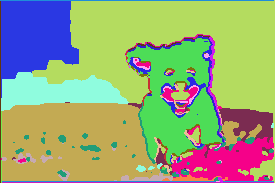

875 / 1000 |  label num : 23  | loss : 0.059828754514455795


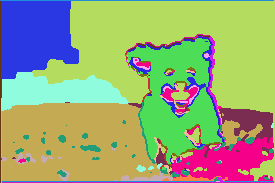

876 / 1000 |  label num : 23  | loss : 0.058979492634534836


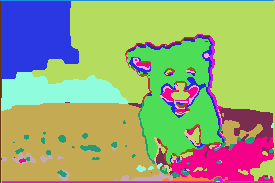

877 / 1000 |  label num : 23  | loss : 0.05949915573000908


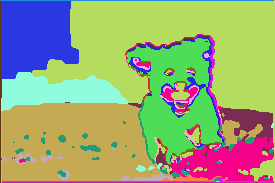

878 / 1000 |  label num : 23  | loss : 0.05877222120761871


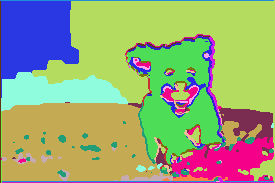

879 / 1000 |  label num : 23  | loss : 0.058738697320222855


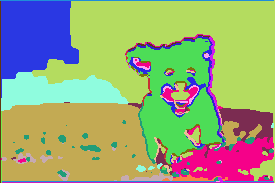

880 / 1000 |  label num : 23  | loss : 0.05905894562602043


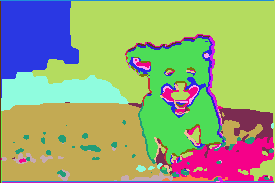

881 / 1000 |  label num : 23  | loss : 0.05903622508049011


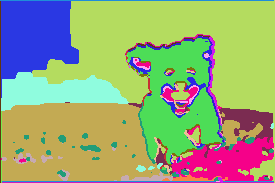

882 / 1000 |  label num : 23  | loss : 0.059464022517204285


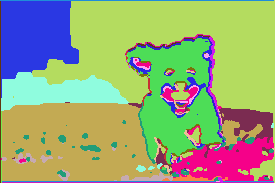

883 / 1000 |  label num : 23  | loss : 0.05913488566875458


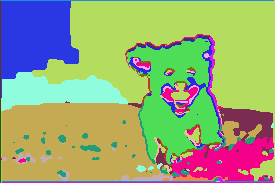

884 / 1000 |  label num : 23  | loss : 0.05883525684475899


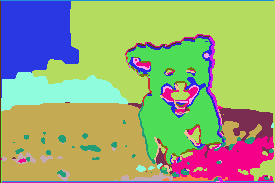

885 / 1000 |  label num : 23  | loss : 0.058518584817647934


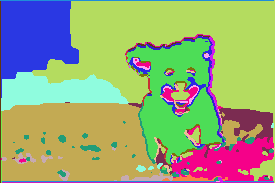

886 / 1000 |  label num : 23  | loss : 0.05919989198446274


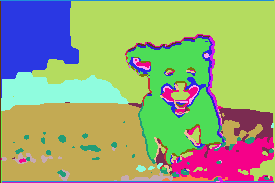

887 / 1000 |  label num : 23  | loss : 0.05850119888782501


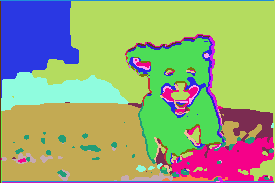

888 / 1000 |  label num : 23  | loss : 0.05872049182653427


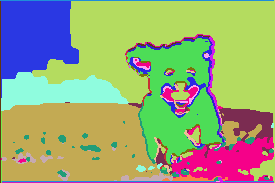

889 / 1000 |  label num : 23  | loss : 0.05854318290948868


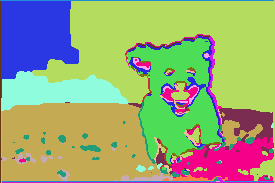

890 / 1000 |  label num : 23  | loss : 0.05872153490781784


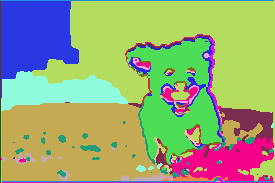

891 / 1000 |  label num : 23  | loss : 0.05837623402476311


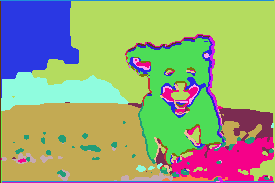

892 / 1000 |  label num : 23  | loss : 0.058564864099025726


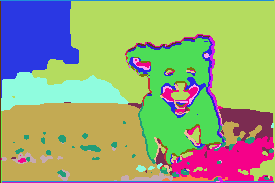

893 / 1000 |  label num : 23  | loss : 0.05895998328924179


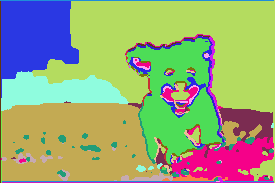

894 / 1000 |  label num : 23  | loss : 0.05827498435974121


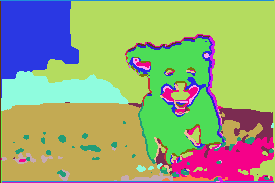

895 / 1000 |  label num : 23  | loss : 0.0586942620575428


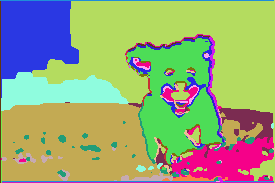

896 / 1000 |  label num : 23  | loss : 0.05810107663273811


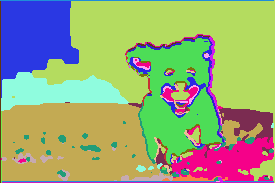

897 / 1000 |  label num : 23  | loss : 0.058155618607997894


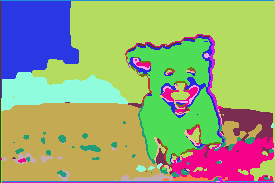

898 / 1000 |  label num : 23  | loss : 0.05804537981748581


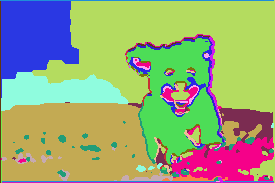

899 / 1000 |  label num : 23  | loss : 0.05834876000881195


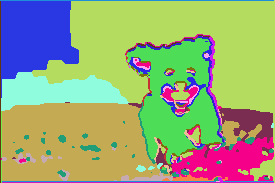

900 / 1000 |  label num : 23  | loss : 0.057532355189323425


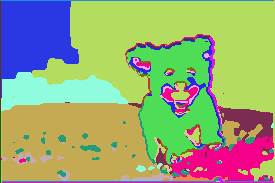

901 / 1000 |  label num : 23  | loss : 0.058532070368528366


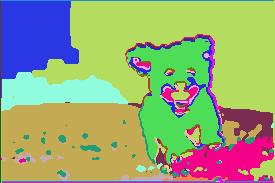

902 / 1000 |  label num : 23  | loss : 0.05764654651284218


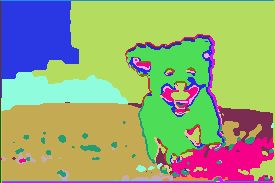

903 / 1000 |  label num : 23  | loss : 0.058019522577524185


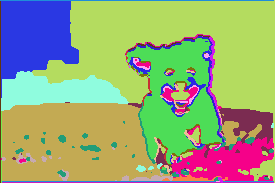

904 / 1000 |  label num : 23  | loss : 0.05856403335928917


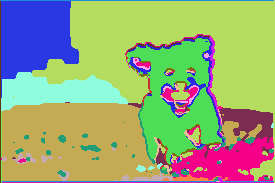

905 / 1000 |  label num : 23  | loss : 0.05779077857732773


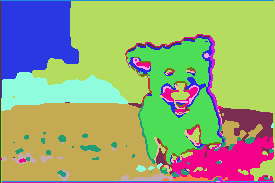

906 / 1000 |  label num : 23  | loss : 0.058002203702926636


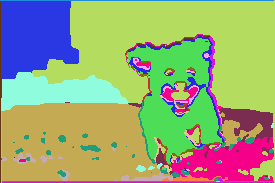

907 / 1000 |  label num : 23  | loss : 0.05806061625480652


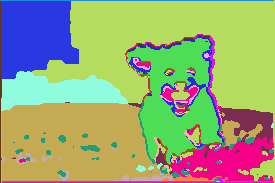

908 / 1000 |  label num : 23  | loss : 0.05808359384536743


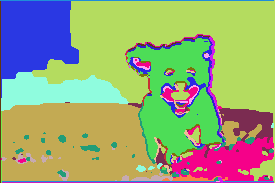

909 / 1000 |  label num : 23  | loss : 0.058347415179014206


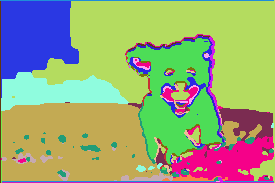

910 / 1000 |  label num : 23  | loss : 0.0583711601793766


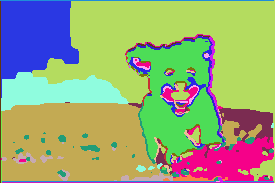

911 / 1000 |  label num : 23  | loss : 0.05749627202749252


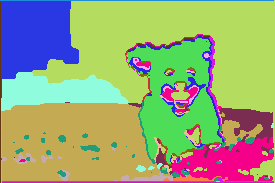

912 / 1000 |  label num : 23  | loss : 0.05830955505371094


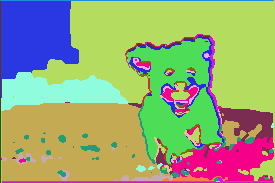

913 / 1000 |  label num : 23  | loss : 0.05723978579044342


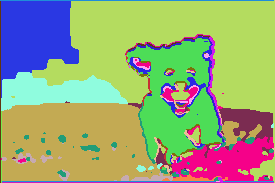

914 / 1000 |  label num : 23  | loss : 0.058245595544576645


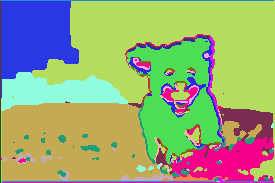

915 / 1000 |  label num : 23  | loss : 0.05737027898430824


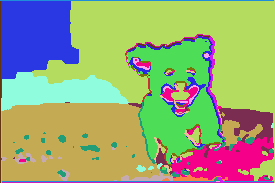

916 / 1000 |  label num : 23  | loss : 0.058001089841127396


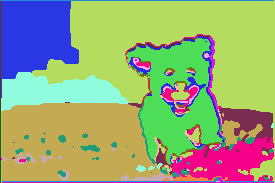

917 / 1000 |  label num : 23  | loss : 0.05761665850877762


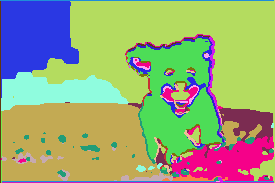

918 / 1000 |  label num : 23  | loss : 0.05757914111018181


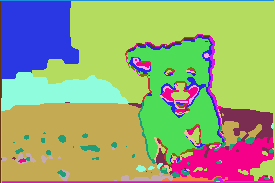

919 / 1000 |  label num : 23  | loss : 0.057383038103580475


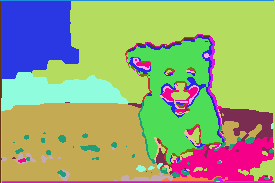

920 / 1000 |  label num : 23  | loss : 0.057498011738061905


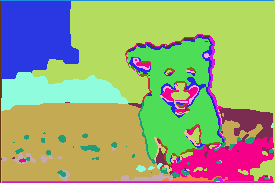

921 / 1000 |  label num : 23  | loss : 0.05695628374814987


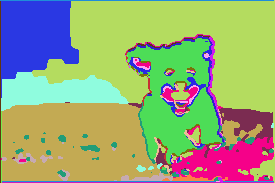

922 / 1000 |  label num : 23  | loss : 0.05742715299129486


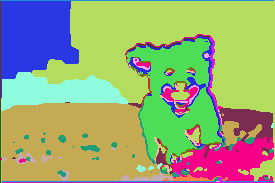

923 / 1000 |  label num : 23  | loss : 0.05708639696240425


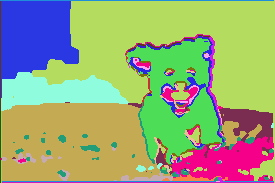

924 / 1000 |  label num : 23  | loss : 0.057544607669115067


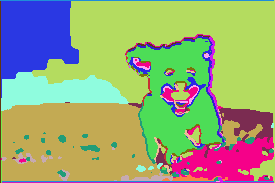

925 / 1000 |  label num : 23  | loss : 0.05733287334442139


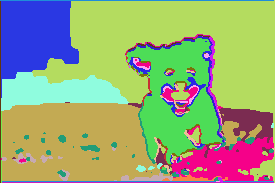

926 / 1000 |  label num : 23  | loss : 0.05722755938768387


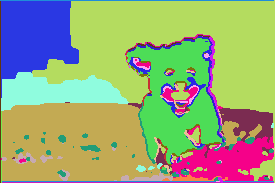

927 / 1000 |  label num : 23  | loss : 0.057016320526599884


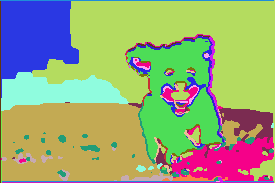

928 / 1000 |  label num : 23  | loss : 0.05678490921854973


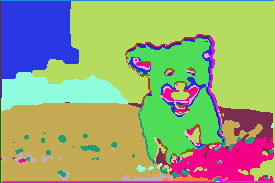

929 / 1000 |  label num : 23  | loss : 0.05675782263278961


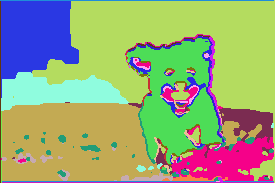

930 / 1000 |  label num : 23  | loss : 0.05691691115498543


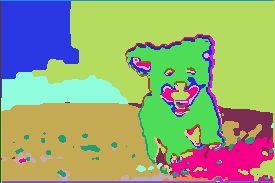

931 / 1000 |  label num : 23  | loss : 0.0570085383951664


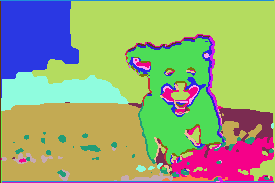

932 / 1000 |  label num : 23  | loss : 0.05660875141620636


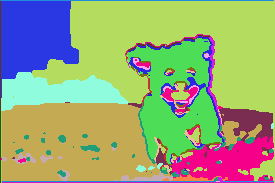

933 / 1000 |  label num : 23  | loss : 0.05699338763952255


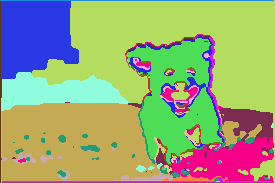

934 / 1000 |  label num : 23  | loss : 0.05691345036029816


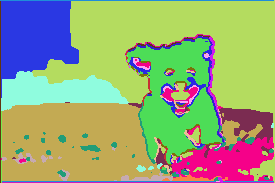

935 / 1000 |  label num : 23  | loss : 0.05695144832134247


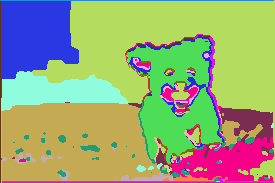

936 / 1000 |  label num : 23  | loss : 0.05704586207866669


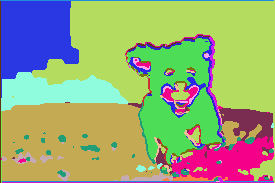

937 / 1000 |  label num : 23  | loss : 0.057085223495960236


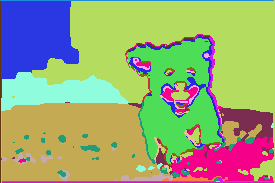

938 / 1000 |  label num : 23  | loss : 0.056708645075559616


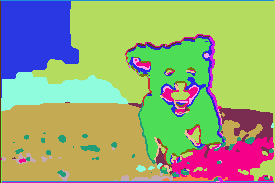

939 / 1000 |  label num : 23  | loss : 0.05761280283331871


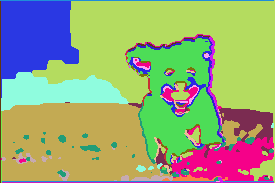

940 / 1000 |  label num : 23  | loss : 0.05735310539603233


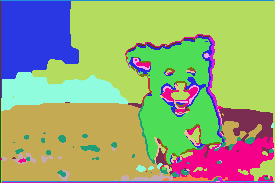

941 / 1000 |  label num : 23  | loss : 0.05674190819263458


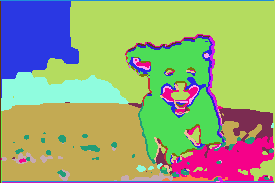

942 / 1000 |  label num : 23  | loss : 0.05683208256959915


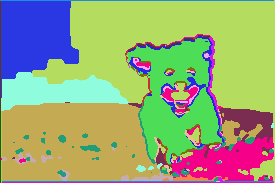

943 / 1000 |  label num : 23  | loss : 0.05656278878450394


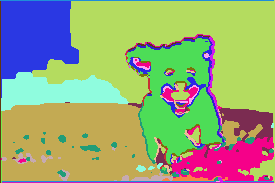

944 / 1000 |  label num : 23  | loss : 0.057298772037029266


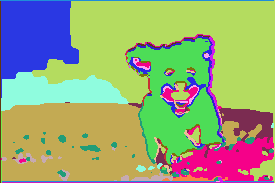

945 / 1000 |  label num : 23  | loss : 0.05619458854198456


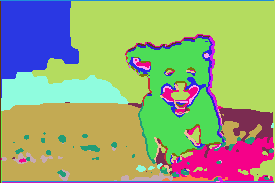

946 / 1000 |  label num : 23  | loss : 0.05674268305301666


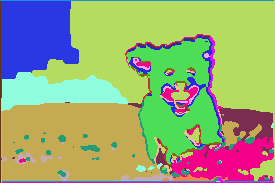

947 / 1000 |  label num : 23  | loss : 0.0570705309510231


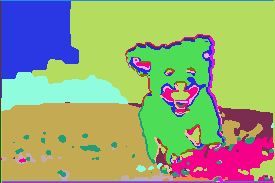

948 / 1000 |  label num : 23  | loss : 0.056731220334768295


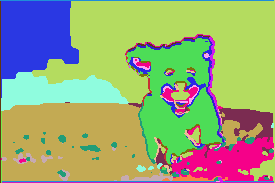

949 / 1000 |  label num : 23  | loss : 0.05674505606293678


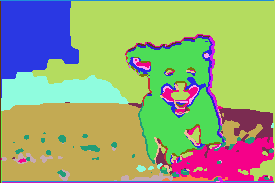

950 / 1000 |  label num : 23  | loss : 0.05644737929105759


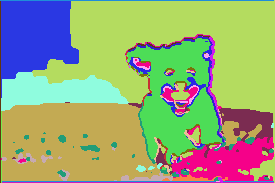

951 / 1000 |  label num : 23  | loss : 0.056366827338933945


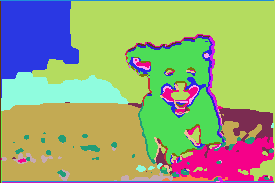

952 / 1000 |  label num : 23  | loss : 0.0560782216489315


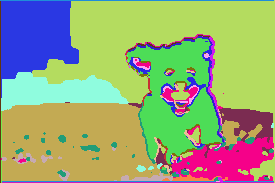

953 / 1000 |  label num : 23  | loss : 0.05608721449971199


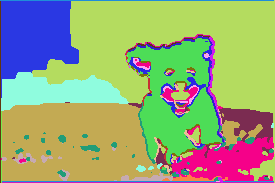

954 / 1000 |  label num : 23  | loss : 0.055876728147268295


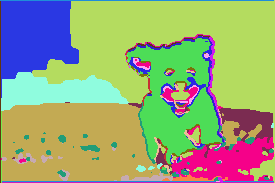

955 / 1000 |  label num : 23  | loss : 0.05577840656042099


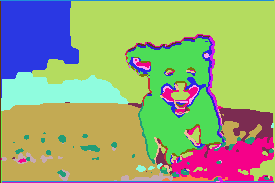

956 / 1000 |  label num : 23  | loss : 0.0558934286236763


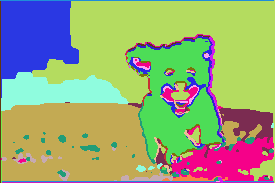

957 / 1000 |  label num : 23  | loss : 0.055727265775203705


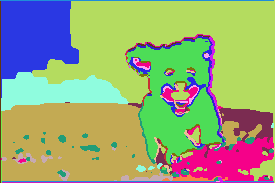

958 / 1000 |  label num : 23  | loss : 0.055684223771095276


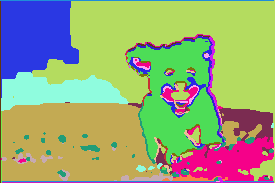

959 / 1000 |  label num : 23  | loss : 0.055704377591609955


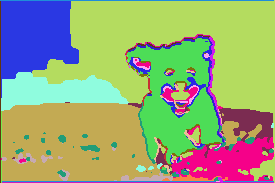

960 / 1000 |  label num : 23  | loss : 0.05561158061027527


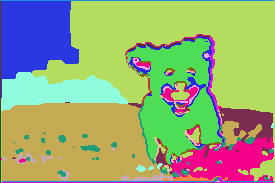

961 / 1000 |  label num : 23  | loss : 0.05571203678846359


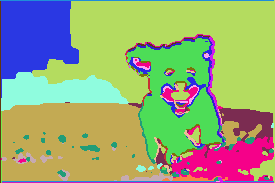

962 / 1000 |  label num : 23  | loss : 0.0555996298789978


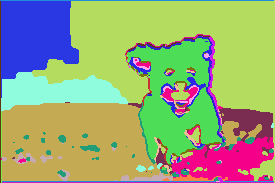

963 / 1000 |  label num : 23  | loss : 0.05553334206342697


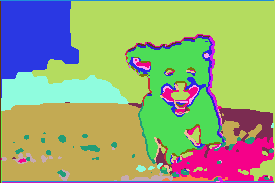

964 / 1000 |  label num : 23  | loss : 0.05572989583015442


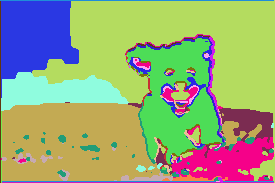

965 / 1000 |  label num : 23  | loss : 0.055558621883392334


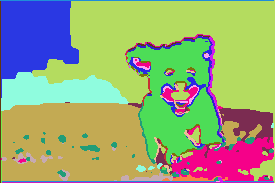

966 / 1000 |  label num : 23  | loss : 0.05527624860405922


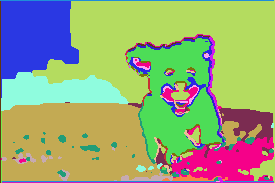

967 / 1000 |  label num : 23  | loss : 0.055471137166023254


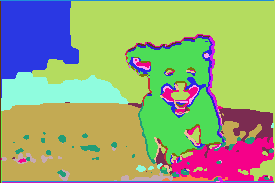

968 / 1000 |  label num : 23  | loss : 0.05534810572862625


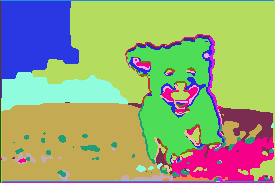

969 / 1000 |  label num : 23  | loss : 0.0553898923099041


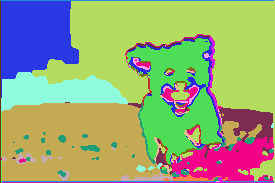

970 / 1000 |  label num : 23  | loss : 0.05523817613720894


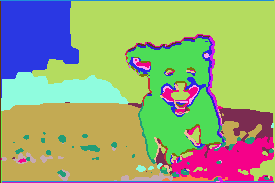

971 / 1000 |  label num : 23  | loss : 0.0551476888358593


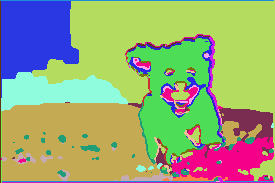

972 / 1000 |  label num : 23  | loss : 0.055111147463321686


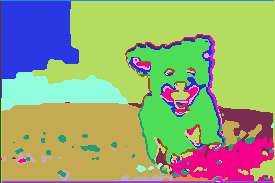

973 / 1000 |  label num : 23  | loss : 0.05543441325426102


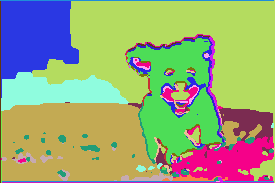

974 / 1000 |  label num : 23  | loss : 0.05599068105220795


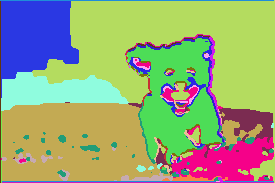

975 / 1000 |  label num : 23  | loss : 0.055465217679739


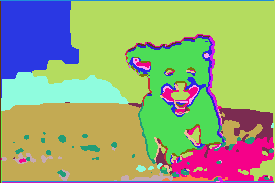

976 / 1000 |  label num : 23  | loss : 0.05569344758987427


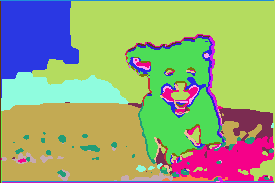

977 / 1000 |  label num : 23  | loss : 0.05536137893795967


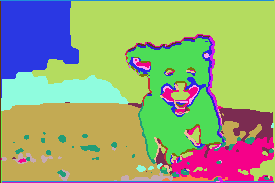

978 / 1000 |  label num : 23  | loss : 0.0553014874458313


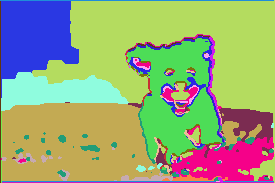

979 / 1000 |  label num : 23  | loss : 0.0554574579000473


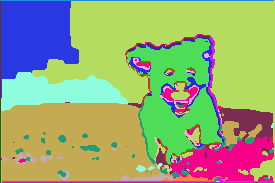

980 / 1000 |  label num : 23  | loss : 0.05566161125898361


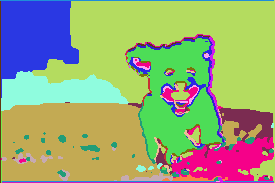

981 / 1000 |  label num : 23  | loss : 0.05553252249956131


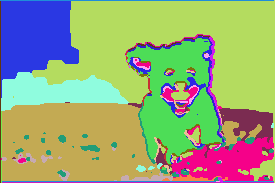

982 / 1000 |  label num : 23  | loss : 0.055819351226091385


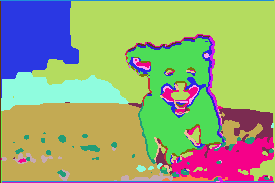

983 / 1000 |  label num : 23  | loss : 0.05548183247447014


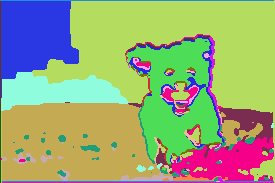

984 / 1000 |  label num : 23  | loss : 0.056619495153427124


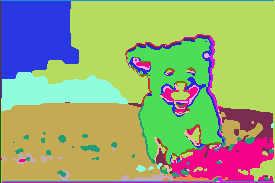

985 / 1000 |  label num : 23  | loss : 0.05614941939711571


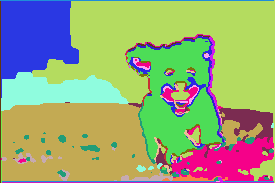

986 / 1000 |  label num : 23  | loss : 0.05517612025141716


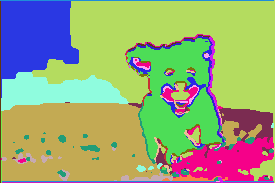

987 / 1000 |  label num : 23  | loss : 0.05560654401779175


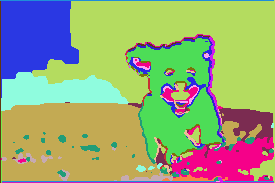

988 / 1000 |  label num : 23  | loss : 0.05543650686740875


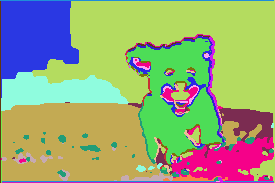

989 / 1000 |  label num : 23  | loss : 0.055356837809085846


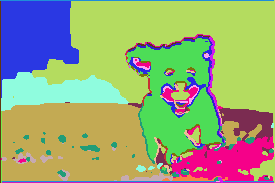

990 / 1000 |  label num : 23  | loss : 0.05631272494792938


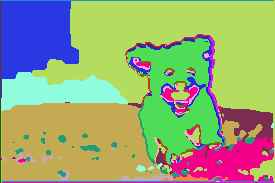

991 / 1000 |  label num : 23  | loss : 0.05549800395965576


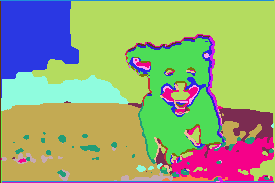

992 / 1000 |  label num : 23  | loss : 0.05521374195814133


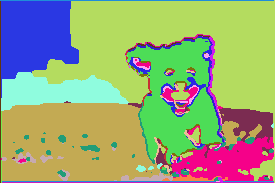

993 / 1000 |  label num : 23  | loss : 0.05577508732676506


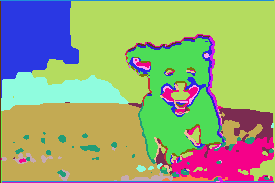

994 / 1000 |  label num : 23  | loss : 0.0552578940987587


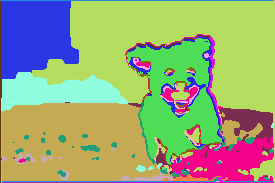

995 / 1000 |  label num : 23  | loss : 0.05527932196855545


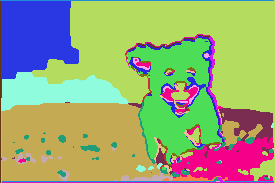

996 / 1000 |  label num : 23  | loss : 0.0550113283097744


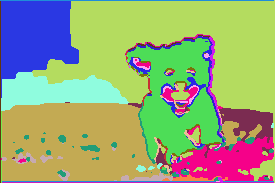

997 / 1000 |  label num : 23  | loss : 0.05518248304724693


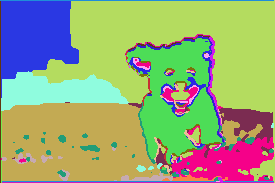

998 / 1000 |  label num : 23  | loss : 0.05535733699798584


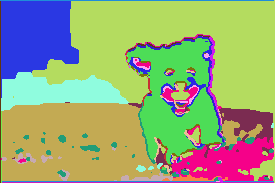

999 / 1000 |  label num : 23  | loss : 0.05528413504362106


In [ ]:
for batch_idx in range(hyperParam.n_epochs):
  optimizer.zero_grad()
  data = data.cuda()
  output = model( data )[ 0 ]
  output = output.permute( 1, 2, 0 ).contiguous().view( -1,hyperParam.conv1_outfeat)
  output_ = output.reshape((img.shape[0], img.shape[1], hyperParam.conv1_outfeat))


  output_discontinuity_y = output_[1:, :, :] - output_[0:-1, :, :]
  output_discontinuity_z = output_[:, 1:, :] - output_[:, 0:-1, :]
  contloss_y = continitity_lossy(output_discontinuity_y,continitity_lossy_target)
  contloss_z = continitity_lossz(output_discontinuity_z,continitity_lossz_target)


  _, target = torch.max( output, 1 )
  im_target = target.data.cpu().numpy()
  n_labels = len(np.unique(im_target))
  
  loss = hyperParam.cle_weight * loss_func(output, target) + hyperParam.discontinuity_weight * (contloss_y + contloss_z)
      
  loss.backward()
  optimizer.step()

  print(batch_idx, '/', hyperParam.n_epochs, '|', ' label num :', hyperParam.n_epochs, ' | loss :', loss.item())

  if n_labels <= hyperParam.min_labels:
      print ("nLabels", n_labels, "reached minLabels", hyperParam.min_labels, ".")
      break



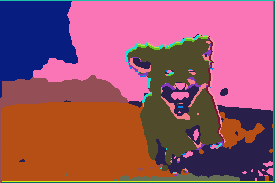

In [ ]:
cv2_imshow(im_target_rgb)